In [1]:
import pandas as pd
import pickle
from sklearn.neighbors import NearestNeighbors
import numpy as np
from tqdm import tqdm
import seaborn as sns
from sklearn.preprocessing import MultiLabelBinarizer
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
sns.set(font_scale = 1, style = 'darkgrid', rc={'figure.figsize':(7,5)})

In [2]:
#load dfs
researchers = pd.read_pickle("Files/Dataframes/researchers.pkl") 
sponsUnitResearchers = pd.read_pickle("Files/Dataframes/researchers_sponsoringUnits.pkl")

#load list with known sponsoring units from APS
with open('Files/knownDivisions.pkl', 'rb') as f:
    divisions = pickle.load(f)

## One-hot encoding

In [3]:
#get sponsoring units, and remove None and Unknown
sponsoringUnits = sponsUnitResearchers.SponsoringUnits_all.unique().tolist()
sponsoringUnits.remove('None')
sponsoringUnits.remove('Unknown')

In [4]:
#all sponsoring units in list, aggregate when it is same SearchName, Year and SessionType
#keep Seniority, CumulativePaperCount and Productivity as well
researchers_allSponUnit = sponsUnitResearchers.groupby(['SearchName', 'Year', 'SessionType'], as_index=False).agg({'SponsoringUnits_all': list, 'Seniority': 'first', 'CumulativePaperCount': 'first', 'Productivity': 'first', 'Gender': 'first'}).rename(columns = {'AssignedSponsoringUnit': 'SponsoringUnits_all'})

In [5]:
#one-hot encoding
mlb = MultiLabelBinarizer(sparse_output=True)

oneHot = researchers_allSponUnit.join(pd.DataFrame.sparse.from_spmatrix(
    mlb.fit_transform(researchers_allSponUnit.pop('SponsoringUnits_all')),
    index = researchers_allSponUnit.index, 
    columns = mlb.classes_))

In [7]:
#Select columns
cols = list(researchers_allSponUnit.columns)
cols += sponsoringUnits

In [8]:
#df with researcher with one-hot encoded sponsoring units
oneHot_researchers = oneHot[cols]

In [9]:
allCols = sponsoringUnits
allCols += ['Seniority', 'CumulativePaperCount', 'Productivity']

## Functions

In [10]:
def standardizeColumn(df, columnName):
    standardizedColumn = (df[columnName] - df[columnName].mean())/(df[columnName].std())
    
    return standardizedColumn

In [11]:
def KNN(df, groupFeature, groups, K, distanceMetric, oneHotFeatures_n, standardizeFeatures_n, allFeatures):
    group1 = df[df[groupFeature] == groups[0]].reset_index(drop = True)
    group2 = df[df[groupFeature] == groups[1]].reset_index(drop = True)
    
    oneHot_weight = np.repeat(1/oneHotFeatures_n, oneHotFeatures_n) #weight for one-hot encoded features
    other_weight = np.repeat(1, standardizeFeatures_n) #weight for the other features
    weights = np.hstack((oneHot_weight, other_weight)) 
    
    if distanceMetric == 'minkowski':
        neighbors = NearestNeighbors(n_neighbors=K, metric='minkowski', p = 1.5, metric_params={'w': weights}, n_jobs = -1).fit(group1[allFeatures].to_numpy())
    elif distanceMetric == 'euclidean':
        neighbors = NearestNeighbors(n_neighbors=K, metric='minkowski', p = 2, metric_params={'w': weights}, n_jobs = -1).fit(group1[allFeatures].to_numpy())
    elif distanceMetric == 'manhattan':
        neighbors = NearestNeighbors(n_neighbors=K, metric='minkowski', p = 1, metric_params={'w': weights}, n_jobs = -1).fit(group1[allFeatures].to_numpy())
    kNeighbor_dist, kNeighbor_ind = neighbors.kneighbors(group2[allFeatures].to_numpy())
    
    indices = kNeighbor_ind.copy().astype(float)

    return kNeighbor_dist, indices, group1, group2

In [13]:
def plotYearlyDistances(distance, threshold, year, metric):
    df = pd.DataFrame(distance.flatten(), columns = ['Distance'])
#    
#    fig, ax = plt.subplots(1,1)
    sns.histplot(df, x = 'Distance', stat = 'proportion')
    plt.axvline(x = threshold, color = 'black', linewidth = 1.3, label = "Distance threshold: " + "{:.2f}".format(threshold)).set_linestyle("--")
    plt.legend()
    plt.xscale('log')
    plt.yscale('log')
    plt.title(str(year))
    plt.savefig('Figures/KNN_distance_' + metric + str(year) +  '.png', bbox_inches='tight')
    plt.show()

In [14]:
def findParameters(df, K, distanceMetric, allFeatures, q):
    researchers = df.copy()
    standardizeFeatures = ['Seniority', 'CumulativePaperCount', 'Productivity']
    n_oneHotFeatures = len(allFeatures) -  len(standardizeFeatures) #number of features from one-hot encoding
    
    for c in standardizeFeatures:
        researchers[c] = standardizeColumn(researchers, c) #standardize data
    
    yearList = np.sort(researchers.Year.unique())
    for y in yearList:
        year_df = researchers[researchers.Year == y] #filter by year
        distances, indices, females, males = KNN(year_df, 'Gender', ['Female', 'Male'], K, distanceMetric, n_oneHotFeatures, len(standardizeFeatures), allFeatures)
        
        threshold = np.quantile(distances.flatten(), q) #q quantile
        indices[~(distances <= threshold)] = np.nan #set indices to nan if their distance is higher than the threshold
        
        plotYearlyDistances(distances, threshold, y, distanceMetric)  #plot yearly distances        

In [15]:
#check if being used
def getRatio(indices, df1, df2, suffixes, feature): #df1 is females/attendees, df2 is males/invited
    similarResearchers_df = pd.DataFrame(data = df2[feature])
    index_rand = [np.random.choice(i, 1)[0] for i in indices] #randomly select index for each row
    similarResearchers_df['SimilarIndex'] = index_rand #create column with the random similar indices
    similarResearchers_df = similarResearchers_df.dropna(subset = 'SimilarIndex') #drop rows where the researchers are not similar enough
    similar = df1.iloc[similarResearchers_df.SimilarIndex][[feature]] #the random selected similar researchers
    similarResearchers = pd.merge(similarResearchers_df, similar, left_on = 'SimilarIndex', right_on = similar.index, how = 'inner', suffixes=(suffixes[1], suffixes[0]))
    
    #calculate ratio
    g1_ratio = similarResearchers[feature + suffixes[0]].value_counts(normalize = True)
    g2_ratio = similarResearchers[feature + suffixes[1]].value_counts(normalize = True)
    
    return g1_ratio, g2_ratio

In [16]:
#check if being used
#def likelihood(indices, df1, df2, suffixes, groupFeature, feature): #df1 is females/attendees, df2 is males/invited
def likelihood(ratio_group1, ratio_group2, feature):

    if feature in ratio_group1.index:
        group1_p = ratio_group1.loc[feature]
    else:
        group1_p = 0
        
    if feature in ratio_group2.index:
        group2_p = ratio_group2.loc[feature]
    else:
        group2_p = 0
    
    likelihood_n = group1_p/group2_p
    
    return likelihood_n

In [17]:
#delete - but check if it is being used before hand
def getStats(df, measure): #measure = likelihood
    measure_dict = {}
    yearList = np.sort(df.Year.unique())
    for y in yearList:
        avg = df[df.Year == y][measure].mean()
        std = df[df.Year == y][measure].std()
        sem = df[df.Year == y][measure].sem()
        measure_dict[y] = {'Avg_' + measure: avg, 'Std_' + measure: std, 'SEM_' + measure: sem}
    return measure_dict

In [121]:
#new one that is more simple
def getStats_likelihood(df):
    avg = df.groupby(['K', 'Year']).mean()['Likelihood'].reset_index().rename(columns = {'Likelihood': 'Avg_likelihood'})
    std = df.groupby(['K', 'Year']).std()['Likelihood'].reset_index().rename(columns = {'Likelihood': 'STD_likelihood'})
    sem = df.groupby(['K', 'Year']).sem()['Likelihood'].reset_index().rename(columns = {'Likelihood': 'SEM_likelihood'})

    stats_df = avg.merge(std, how = 'inner', on = ['K', 'Year'])
    stats_df = stats_df.merge(sem, how = 'inner', on = ['K', 'Year'])
    
    return stats_df

In [18]:
#standard error:
#expected variation in mean

In [117]:
#check if being used
def plotLikelihood(df, k, q, title):
    years = df.index.tolist()
    
    #fix, ax = plt.subplots(1,1)
    sns.lineplot(data = df, x = df.index, y = 'Avg_likelihood', marker = 'o', color = 'red')
    plt.axhline(1, color = 'black', linewidth = 1, label = "Line indicating equality").set_linestyle("--")
    plt.errorbar(x = df.index, y = df.Avg_likelihood, yerr = df.SEM_likelihood, color = 'red', capsize = 4)
    plt.legend()
    plt.xticks(np.arange(min(years), max(years)+1, 2.0))
    plt.xlabel('Year')
    plt.ylabel('Likelihood of female invitation')
    #plt.title("Evolution of likelihood of female invitation with " + str(k) + " neighbors, q = " + str(q))
    plt.savefig("Figures/" + title + str(k) + "Neighbors_" + str(q) + ".png", bbox_inches = 'tight')
    #plt.savefig("Figures/femaleLikelihood" + str(k) + "Neighbors_" + str(q) + ".png", bbox_inches='tight')
    plt.show()

In [45]:
#use the one just below
def likelihoodEvolution_varyK(df, allFeatures, K, groupFeature, groups, distanceMetric, Q, N, suffixes):
    researchers = df.copy()
    researchers = df.copy()
    standardizeFeatures = ['Seniority', 'CumulativePaperCount', 'Productivity']
    n_oneHotFeatures = len(allFeatures) -  len(standardizeFeatures) #number of features from one-hot encoding
    likelihood_dict = {}
    index = 0
    
    for c in standardizeFeatures:
        researchers[c] = standardizeColumn(researchers, c) #standardize data
    
    yearList = np.sort(researchers.Year.unique())
    for k in tqdm(K):
        for q in tqdm(Q):
            for y in yearList:
                year_df = researchers[researchers.Year == y] #filter by year
                if groupFeature == 'Gender':
                    analysisFeature = 'SessionType'
                    distances, indices, group1, group2 = KNN(year_df, groupFeature, groups, k, distanceMetric, n_oneHotFeatures, len(standardizeFeatures), allFeatures) #do KNN
                    threshold = np.quantile(distances.flatten(), q) #q quantile
                    indices[~(distances <= threshold)] = np.nan #set indices to nan if their distance is higher than the threshold
                
                #calculate likelihood
                    for n in range(0,N):
                        ratio1, ratio2 = getRatio(indices, group1, group2, suffixes, analysisFeature)
                        lh = likelihood(ratio1, ratio2, 'invited')
                        likelihood_dict[index] = {'K': k, 'Year': y, 'Iteration': n, 'Likelihood': lh}
                        index += 1
    likelihood_df = pd.DataFrame.from_dict(likelihood_dict, orient = 'index') #create df with likelihood
    return likelihood_df
    #likelihood_stats = getStats(likelihood_df, 'Likelihood') #calculate average and standard deviation
    #likelihood_stats_df = pd.DataFrame.from_dict(likelihood_stats, orient = 'index') #create df with stats on likelihood
    #plotLikelihood(likelihood_stats_df, k, q) #plot likelihood

In [282]:
#test of likelihodEvolution without plotting
def likelihoodEvolution(df, allFeatures, K, groupFeature, groups, distanceMetric, Q, N, suffixes):
    researchers = df.copy()
    standardizeFeatures = ['Seniority', 'CumulativePaperCount', 'Productivity']
    n_oneHotFeatures = len(allFeatures) -  len(standardizeFeatures) #number of features from one-hot encoding
    likelihood_dict = {}
    index = 0
    
    for c in standardizeFeatures:
        researchers[c] = standardizeColumn(researchers, c) #standardize data
    
    yearList = np.sort(researchers.Year.unique())
    for k in tqdm(K):
        for q in tqdm(Q):
            for y in yearList:
                year_df = researchers[researchers.Year == y] #filter by year
                if groupFeature == 'Gender':
                    analysisFeature = 'SessionType'
                    distances, indices, group1, group2 = KNN(year_df, groupFeature, groups, k, distanceMetric, n_oneHotFeatures, len(standardizeFeatures), allFeatures) #do KNN
                    threshold = np.quantile(distances.flatten(), q) #q quantile
                    indices[~(distances <= threshold)] = np.nan #set indices to nan if their distance is higher than the threshold
                
                #calculate likelihood
                    for n in range(0,N):
                        ratio1, ratio2 = getRatio(indices, group1, group2, suffixes, analysisFeature)
                        lh = likelihood(ratio1, ratio2, 'invited')
                        likelihood_dict[index] = {'K': k, 'Year': y, 'Iteration': n, 'Likelihood': lh}
                        index += 1
                        
    likelihood_df = pd.DataFrame.from_dict(likelihood_dict, orient = 'index') #create df with likelihood     
    return likelihood_df

In [20]:
def likelihoodEvolutions(df, allFeatures, K, groupFeature, groups, distanceMetric, Q, N, suffixes):
    
    researchers = df.copy()
    standardizeFeatures = ['Seniority', 'CumulativePaperCount', 'Productivity']
    n_oneHotFeatures = len(allFeatures) -  len(standardizeFeatures) #number of features from one-hot encoding
    likelihood_dict = {}
    index = 0
    
    for c in standardizeFeatures:
        researchers[c] = standardizeColumn(researchers, c) #standardize data
    
    yearList = np.sort(researchers.Year.unique())
    for k in tqdm(K):
        for q in tqdm(Q):
            for y in yearList:
                year_df = researchers[researchers.Year == y] #filter by year
                if groupFeature == 'Gender':
                    analysisFeature = 'SessionType'
                    distances, indices, group1, group2 = KNN(year_df, groupFeature, groups, k, distanceMetric, n_oneHotFeatures, len(standardizeFeatures), allFeatures) #do KNN
                    threshold = np.quantile(distances.flatten(), q) #q quantile
                    indices[~(distances <= threshold)] = np.nan #set indices to nan if their distance is higher than the threshold
                
                #calculate likelihood
                    for n in range(0,N):
                        ratio1, ratio2 = getRatio(indices, group1, group2, suffixes, analysisFeature)
                        lh = likelihood(ratio1, ratio2, 'invited')
                        likelihood_dict[index] = {'Year': y, 'Iteration': n, 'Likelihood': lh}
                        index += 1
           #seniority filter
        #if groupFeature == 'Gender':
            likelihood_df = pd.DataFrame.from_dict(likelihood_dict, orient = 'index') #create df with likelihood
        #seniorityFilter: do avgLikelihood_heatmap
            likelihood_stats = getStats(likelihood_df, 'Likelihood') #calculate average and standard deviation
            likelihood_stats_df = pd.DataFrame.from_dict(likelihood_stats, orient = 'index') #create df with stats on likelihood
            plotLikelihood(likelihood_stats_df, k, q) #plot likelihood
        

        
            

    #for k in tqdm(K): 
        #yearList = np.sort(researchers.Year.unique())
        #for y in yearList:
            #year_df = researchers[researchers.Year == y] #filter by year
            #if groupFeature == 'Gender':
                #groups = ['Female', 'Male']
                #suffixes = ['_F', '_M']
                #analysisFeature = 'SessionType'
                #if seniorityFilter == True:
                    #seniorityLabels = year_df.Seniority_cat.unique().tolist()
                    #for i in seniorityLabels:
                       # cat_df = year_df[year_df.Seniority_cat == i]
                      #  indices, females, males = KNN(cat_df, groupFeature, groups, y, allFeatures, n_oneHotFeatures, standardizeFeatures_n, k, q, seniorityFilter)
                        #calcualte likelihood
                     #   for n in range(0,N):
                    #        ratio1, ratio2 = getRatio(indices, females, males, suffixes, analysisFeature)
                   #         lh = likelihood(ratio1, ratio2, 'invited')

                  #          likelihood_dict[index] = {'Year': y, 'Seniority': i, 'Iteration': n, 'Likelihood': lh}
                 #           index += 1
                            
                #else:
                 #   indices, females, males = KNN(year_df, groupFeature, groups, y, allFeatures, n_oneHotFeatures, standardizeFeatures_n, k, q, seniorityFilter)
                    #calculate likelihood
                #    for n in range(0,N):
               #         ratio1, ratio2 = getRatio(indices, females, males, suffixes, analysisFeature)
              #          lh = likelihood(ratio1, ratio2, 'invited')
             #           likelihood_dict[index] = {'Year': y, 'Iteration': n, 'Likelihood': lh}
            #            index += 1
                        
           # elif groupFeature == 'SessionType':
           #     groups = ['attendee', 'invited']
           #     suffixes = ['_att', '_inv']
          #      analysisFeature = 'Gender'
                
         #       indices, attendees, invited = KNN(year_df, groupFeature, groups, y, allFeatures, n_oneHotFeatures, standardizeFeatures_n, k, q, seniorityFilter)
                #calculate likelihood
        #        for n in range(0, N):
       #             ratio_att, ratio_inv = getRatio(indices, attendees, invited, suffixes, analysisFeature) 
      #              ratio_att_F = ratio_att.loc['Female'] #ratio of female attendees
     #               ratio_inv_F = ratio_inv.loc['Female'] #ratio of female invited
  #                  ratio_dict[index] = {'Year': y, 'Iteration': n, 'FemaleInvRatio': ratio_inv_F, 'FemaleAttRatio': ratio_att_F}
 #                   index += 1
        
#        if groupFeature == 'Gender':
            #likelihood_df = pd.DataFrame.from_dict(likelihood_dict, orient = 'index') #create df with likelihood
            #if seniorityFilter == True:
             #   avgLikelihood_heatmap(likelihood_df, k)
            #else:
           #     likelihood_stats = getStats(likelihood_df, 'Likelihood')  #calculate average and standard deviation
          #      likelihood_stats_df = pd.DataFrame.from_dict(likelihood_stats, orient = 'index') #create df with stats on likelihood
         #       plotLikelihood(likelihood_stats_df, k) #plot likelihood
        
        #else: #when groupFeature is SessionType
         #   ratio_df = pd.DataFrame.from_dict(ratio_dict, orient = 'index') #create df with likelihood
        #    ratioInv_stats = pd.DataFrame.from_dict(getStats(ratio_df, 'FemaleInvRatio'), orient = 'index')  #calculate average and standard deviation for female invited
       #     ratioAtt_stats = pd.DataFrame.from_dict(getStats(ratio_df, 'FemaleAttRatio'), orient = 'index') #calculate average and standard deviation for female attendees
      #      ratio_stats_df = pd.merge(ratioInv_stats, ratioAtt_stats, left_index = True, right_index = True)
#           
     #       plotRatio(ratio_stats_df, k)
           
        
        

In [21]:
def avgLikelihood_heatmap(df, K):
    index = 0
    likelihood_dict = {}
    yearList = np.sort(df.Year.unique())
    seniorityCat = df.Seniority.unique()
    for y in yearList:
        for i in seniorityCat:
            avg_likelihood = df[(df.Year == y) & (df.Seniority == i)].Likelihood.mean()
            std_likelihood = df[(df.Year == y) & (df.Seniority == i)].Likelihood.std()
            likelihood_dict[index] = {'Year': y, 'Seniority': i, 'Avg_likelihood': avg_likelihood, 'Std_likelihood': std_likelihood}
            index += 1
            
    likelihood_df =  pd.DataFrame.from_dict(likelihood_dict, orient = 'index') 
    likelihood_pivot = likelihood_df.pivot(index = 'Year', columns = 'Seniority', values = 'Avg_likelihood')
    xlabels = ['0-5', '6-10', '11-15', '16-20', '21-25', '26-30', '> 30']
    
    #log_norm = LogNorm(vmin=likelihood_pivot.min().min(), vmax=likelihood_pivot.max().max())
     #norm = log_norm
    sns.heatmap(likelihood_pivot, annot=True, xticklabels = xlabels)
    plt.title('Evolution of likelihood of female invitations for different seniority with K = ' + str(K))
    plt.savefig('Figures/likelihoodHeatmap_' + str(K) + 'Neighbors.png', bbox_inches='tight')
    plt.show()

In [22]:
#filter on seniority
def likelihoodEvolutions_seniority(df, allFeatures, K, distanceMetric, q, N):
    researchers = df.copy()
    standardizeFeatures = ['Seniority', 'CumulativePaperCount', 'Productivity']
    n_oneHotFeatures = len(allFeatures) -  len(standardizeFeatures) #number of features from one-hot encoding
    likelihood_dict = {}
    index = 0
    
    for c in standardizeFeatures:
        researchers[c] = standardizeColumn(researchers, c) #standardize data

    yearList = np.sort(researchers.Year.unique())
    for y in yearList:
        year_df = researchers[researchers.Year == y] #filter by year
        seniorityLabels = year_df.Seniority_cat.unique().tolist()
        for i in seniorityLabels:
            cat_df = year_df[year_df.Seniority_cat == i] #filter by seniority category
            distances, indices, females, males = KNN(cat_df, 'Gender', ['Female', 'Male'], K, distanceMetric, n_oneHotFeatures, len(standardizeFeatures), allFeatures) #do KNN
            threshold = np.quantile(distances.flatten(), q) #q quantile
            indices[~(distances <= threshold)] = np.nan #set indices to nan if their distance is higher than the threshold
            
            for n in range(0, N): #calculate likelihood
                femaleRatio, maleRatio = getRatio(indices, females, males, ['_F', '_M'], 'SessionType')
                lh = likelihood(femaleRatio, maleRatio, 'invited')
                likelihood_dict[index] = {'Year': y, 'Seniority': i, 'Iteratio': n, 'Likelihood': lh}
                index += 1
                
    likelihood_df = pd.DataFrame.from_dict(likelihood_dict, orient = 'index') #create df with likelihood
    avgLikelihood_heatmap(likelihood_df, K)

### Varying distance metric

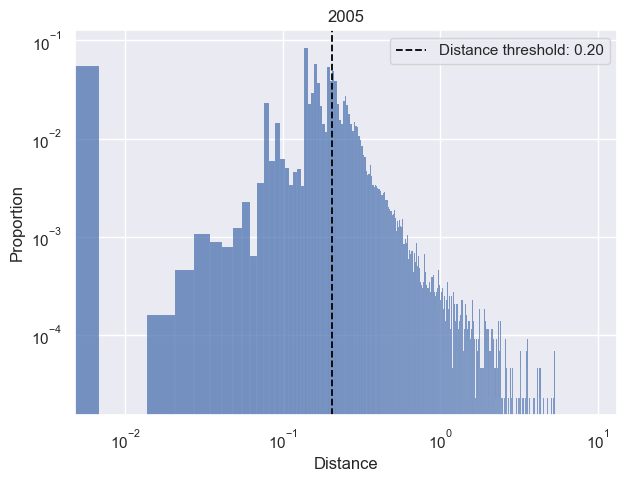

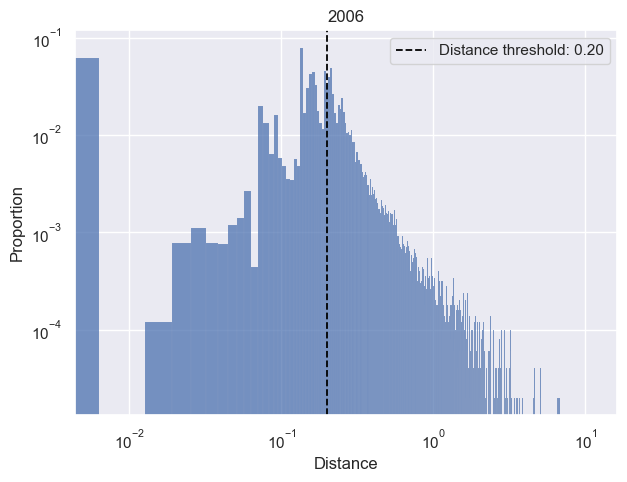

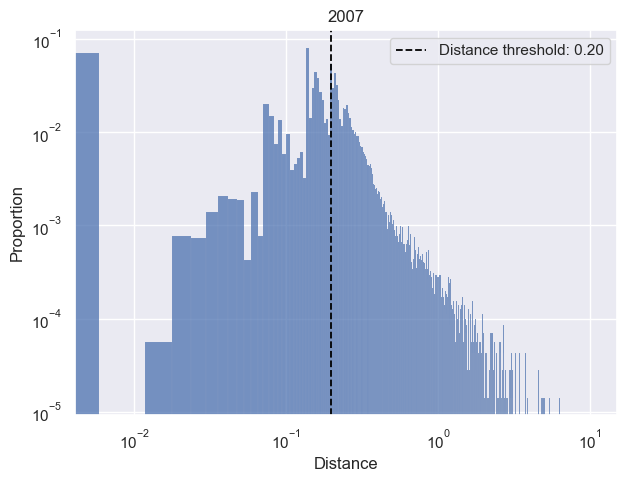

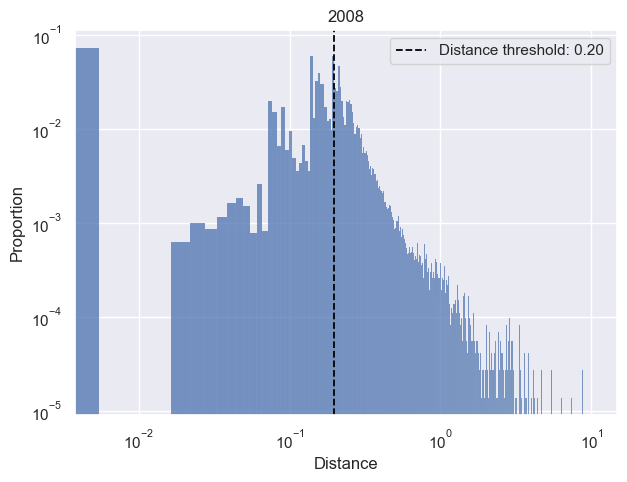

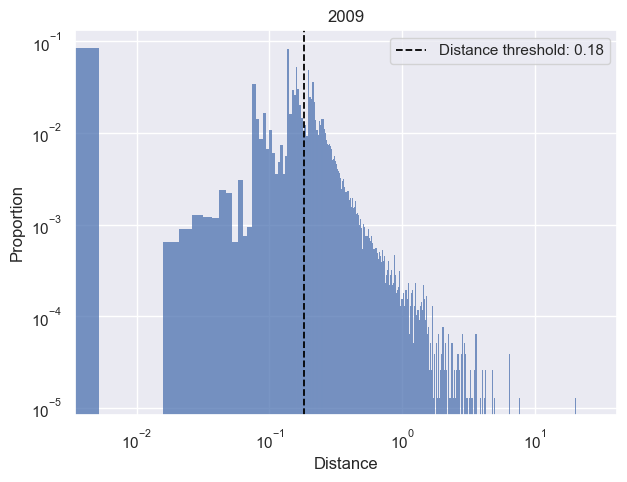

...

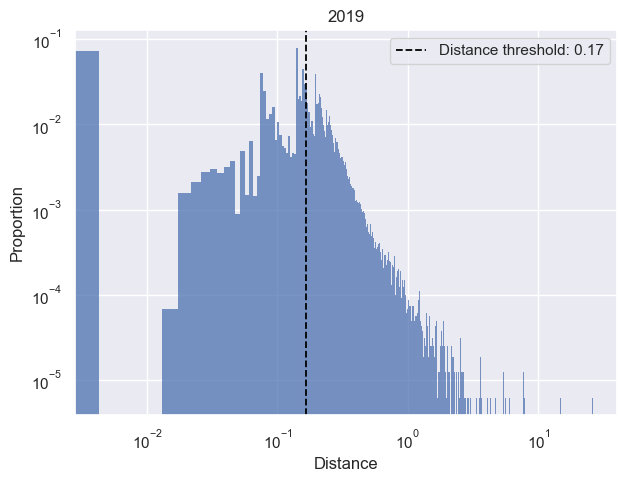

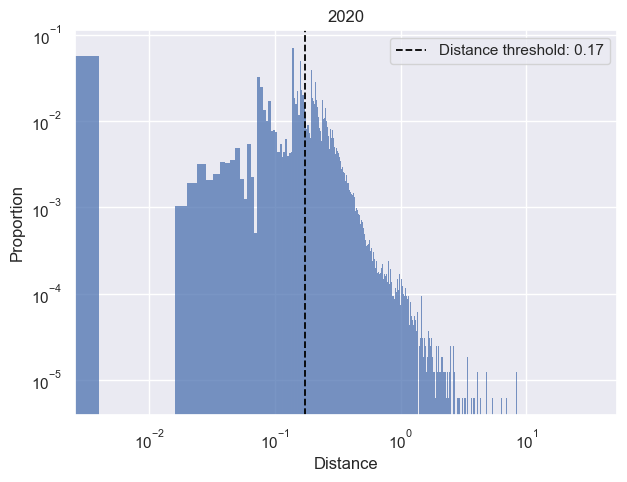

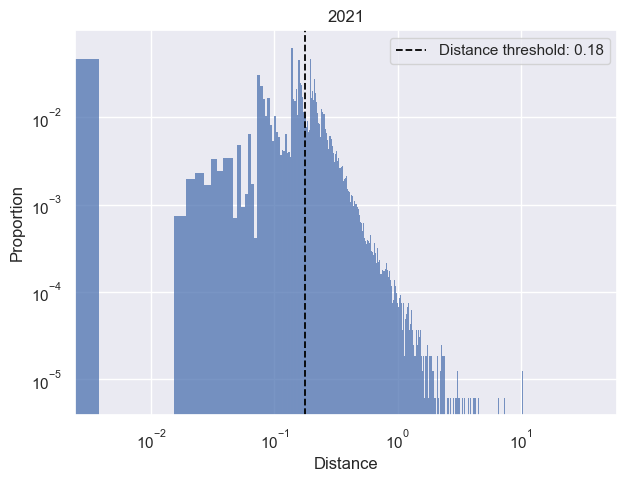

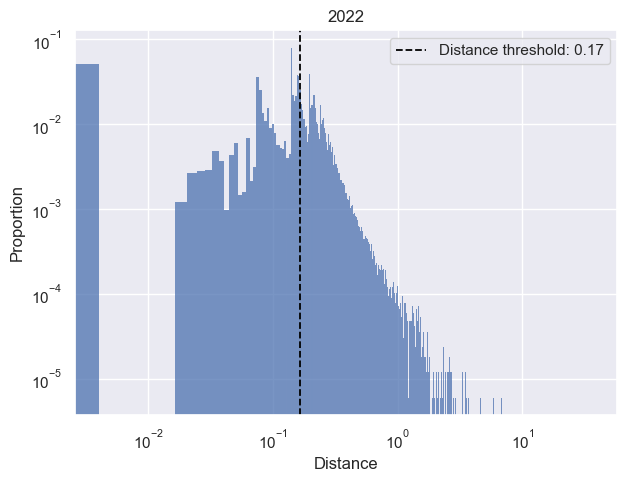

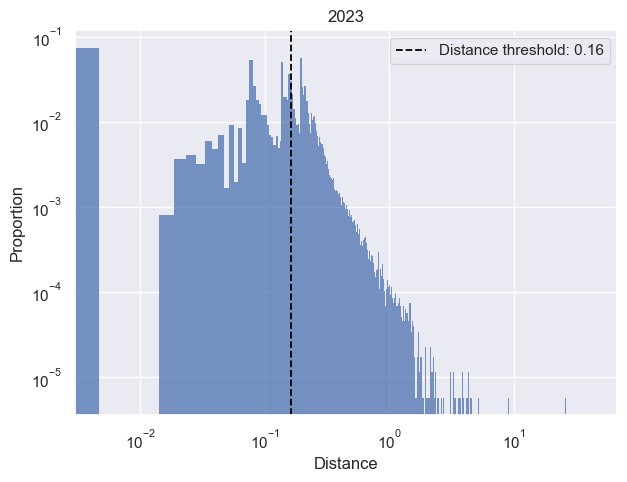

In [25]:
#plot distance - euclidean, K = 10, q = 0.5
findParameters(oneHot_researchers, 10, 'euclidean', allCols, 0.5)

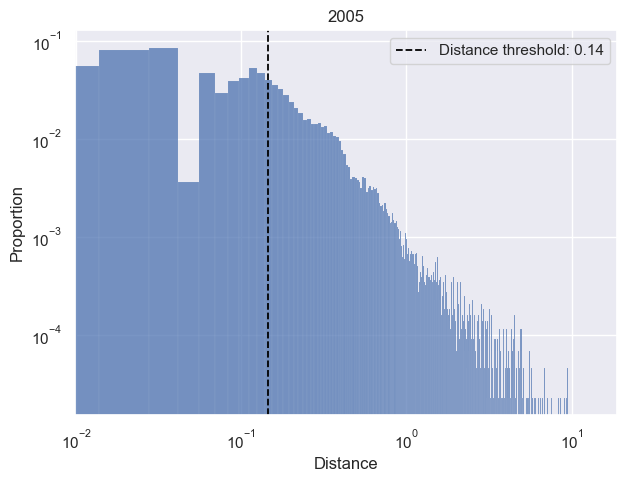

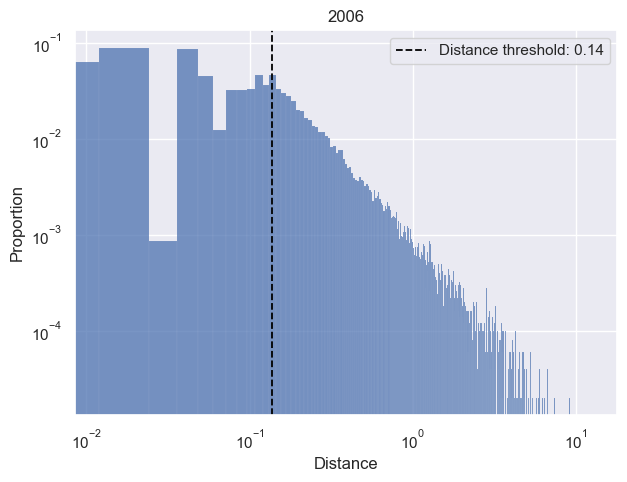

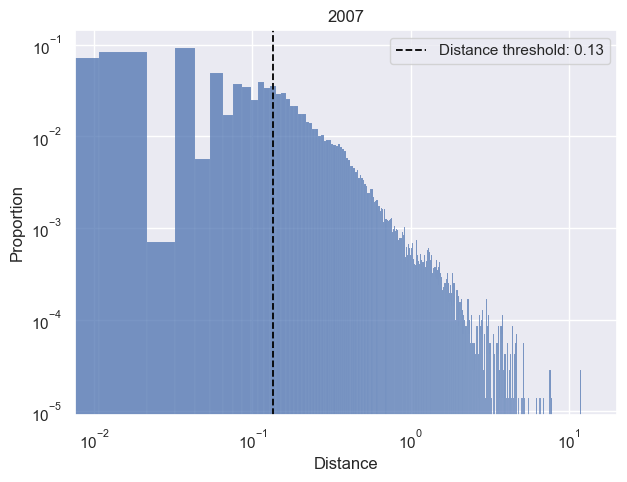

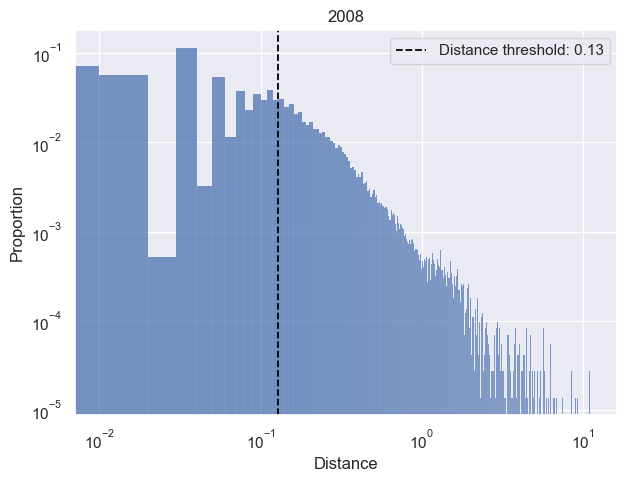

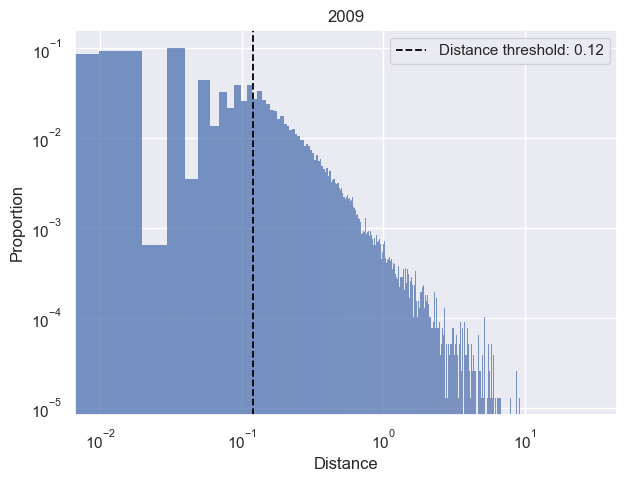

...

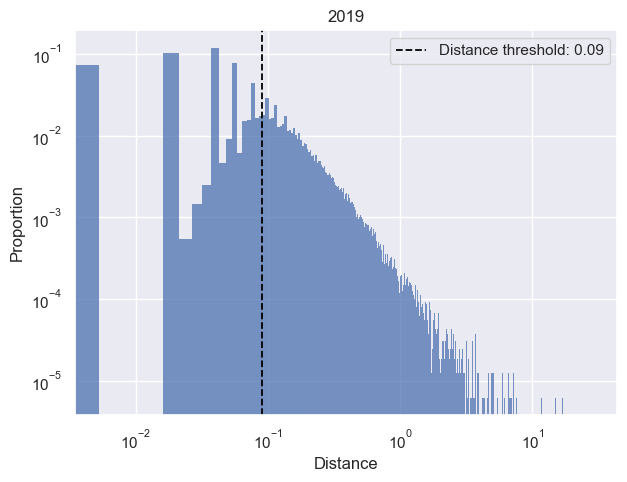

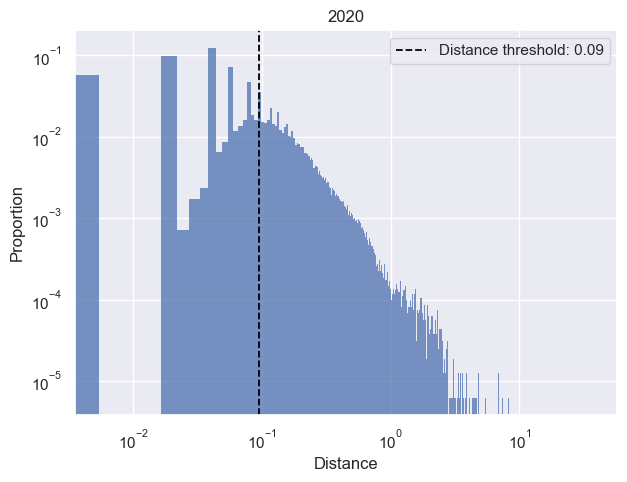

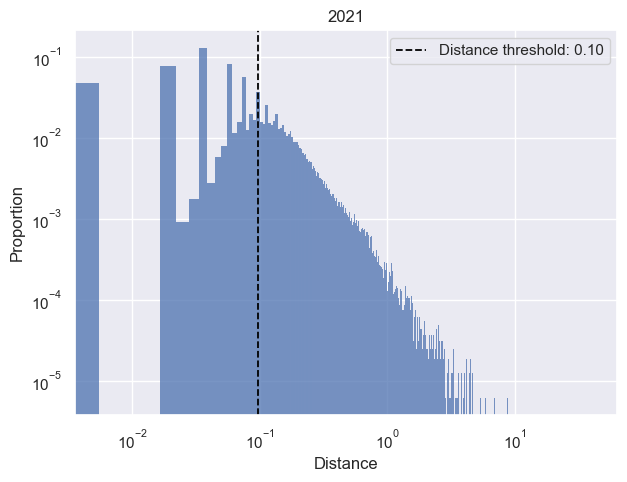

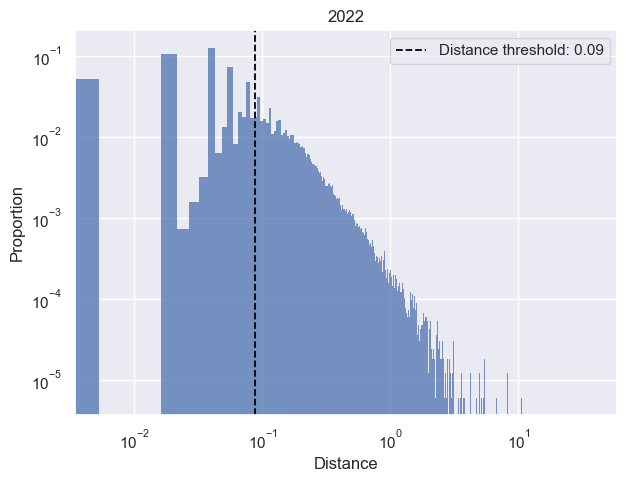

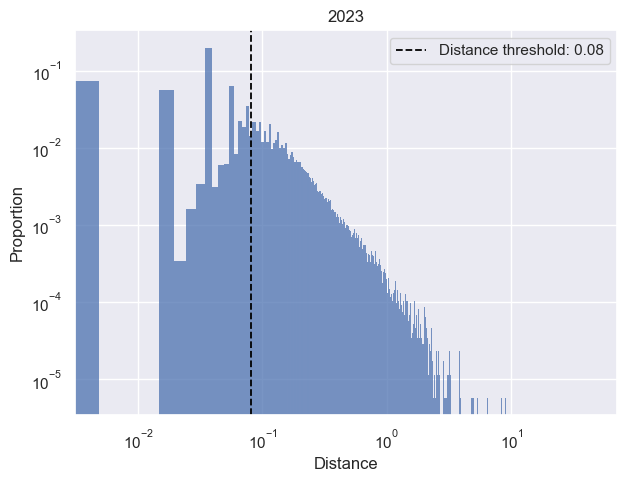

In [26]:
#plot distance - manhattan, K = 10, q = 0.5
findParameters(oneHot_researchers, 10, 'manhattan', allCols, 0.5)

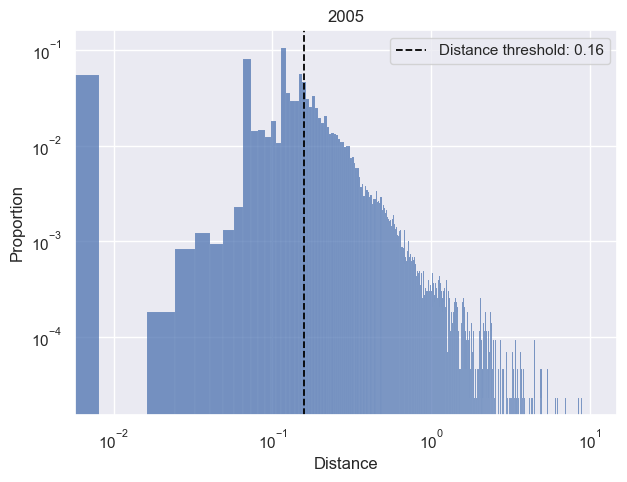

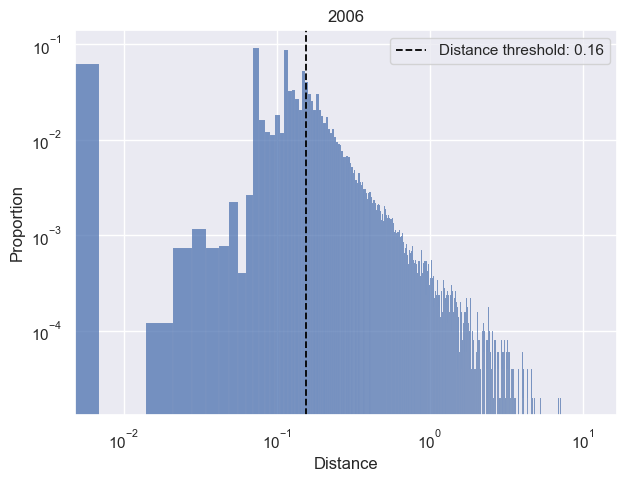

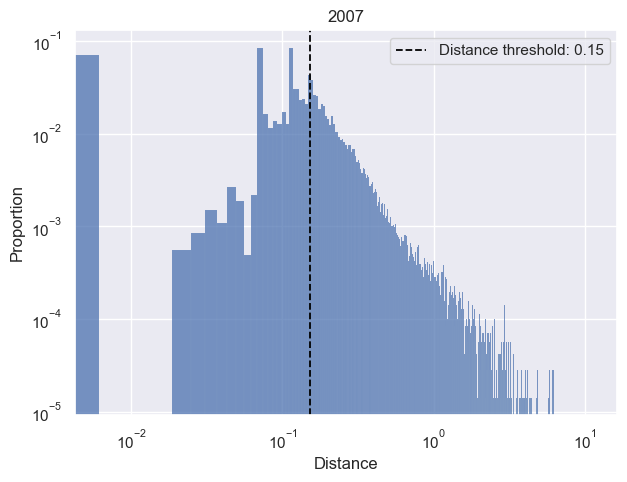

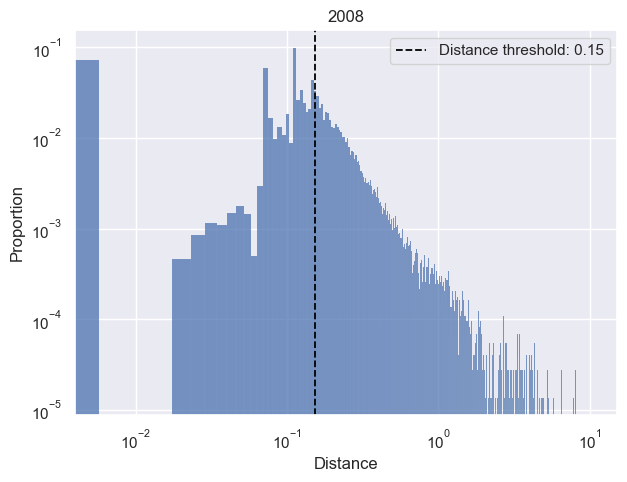

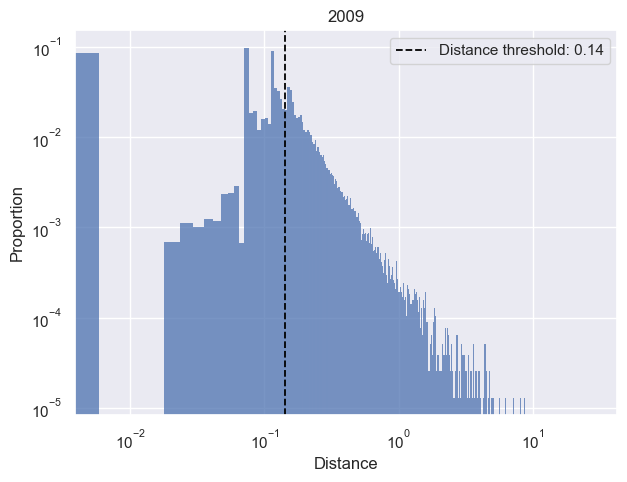

...

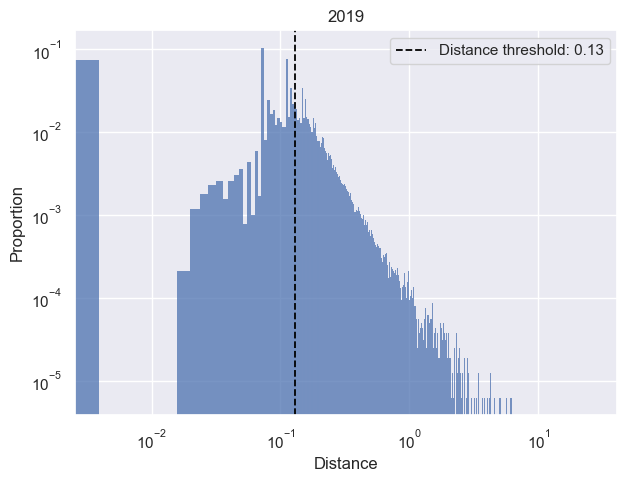

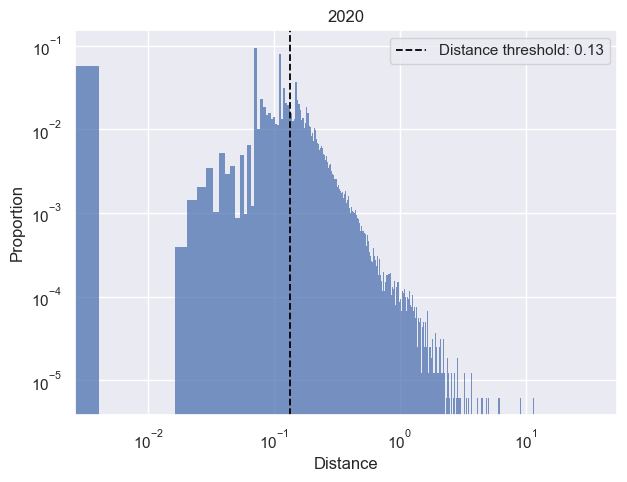

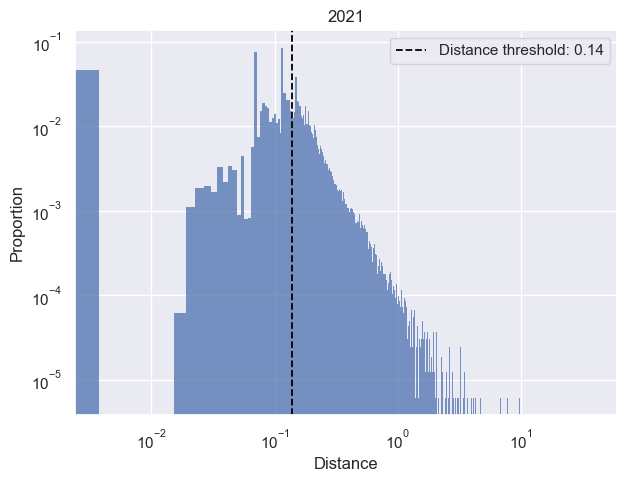

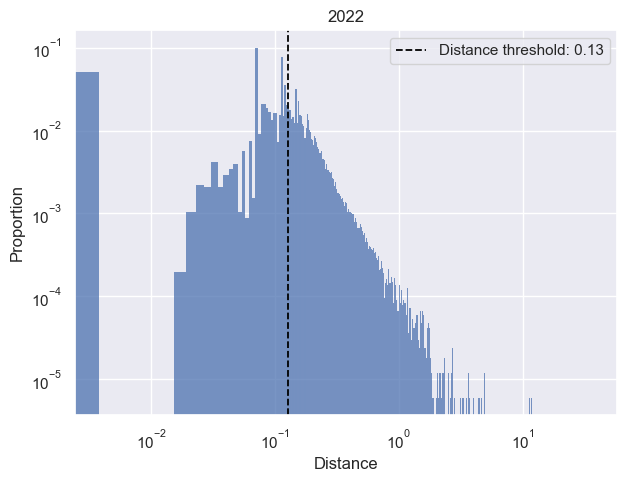

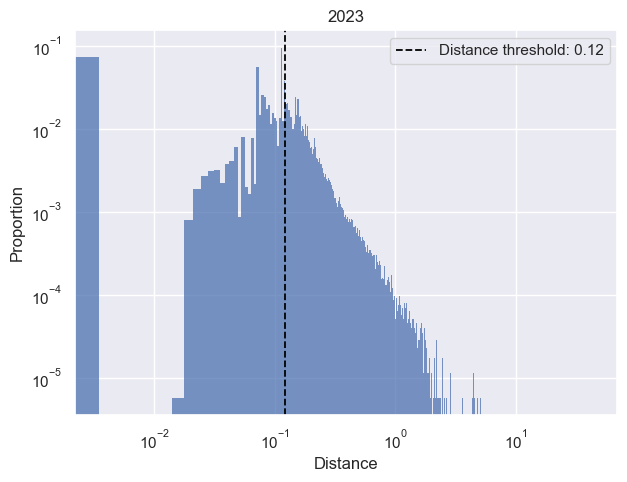

In [27]:
#plot distance - minkowski, p = 1.5, K = 10, q = 0.5
findParameters(oneHot_researchers, 10, 'minkowski', allCols, 0.5)

In [285]:
euclideanLikelihood = likelihoodEvolution(oneHot_researchers, allCols, [10], 'Gender', ['Female', 'Male'], 'euclidean', [0.5], 1000, ['_F', '_M'])
manhattanLikelihood = likelihoodEvolution(oneHot_researchers, allCols, [10], 'Gender', ['Female', 'Male'], 'manhattan', [0.5], 1000, ['_F', '_M'])
minkowskiLikelihood = likelihoodEvolution(oneHot_researchers, allCols, [10], 'Gender', ['Female', 'Male'], 'minkowski', [0.5], 1000, ['_F', '_M'])

100%|███████████████████████████████████████████| 1/1 [38:50<00:00, 2330.63s/it]


In [ ]:
#plot dem
#prøv så med manhattan, K = 50, og check den ikke er helt anderledes

  0%|                                                     | 0/1 [00:00<?, ?it/s]

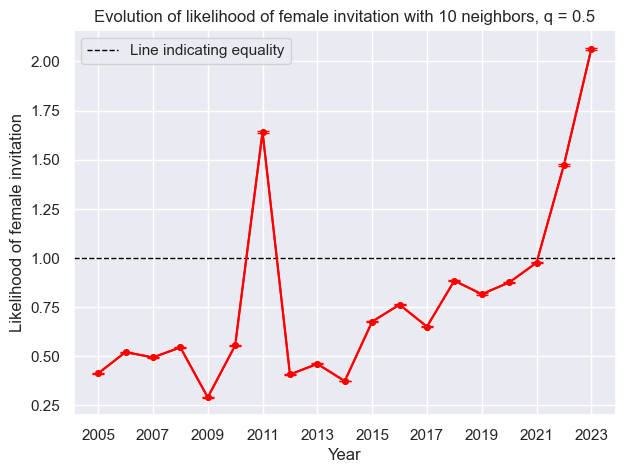


100%|███████████████████████████████████████████| 1/1 [55:21<00:00, 3321.52s/it]


In [28]:
#euclidean distance, K = 10, q = 0.5
likelihoodEvolutions(oneHot_researchers, allCols, [10], 'Gender', ['Female', 'Male'], 'euclidean', [0.5], 1000, ['_F', '_M'])

  0%|                                                     | 0/1 [00:00<?, ?it/s]

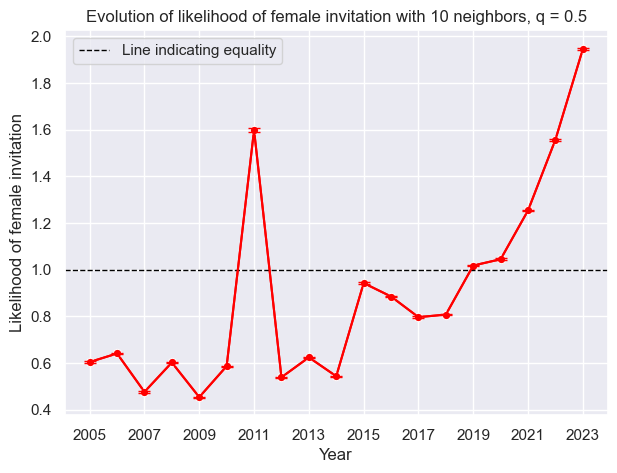


100%|███████████████████████████████████████████| 1/1 [37:23<00:00, 2243.25s/it]


In [29]:
#manhattan distance, K = 10, q = 0.5
likelihoodEvolutions(oneHot_researchers, allCols, [10], 'Gender', ['Female', 'Male'], 'manhattan', [0.5], 1000, ['_F', '_M'])

  0%|                                                     | 0/1 [00:00<?, ?it/s]

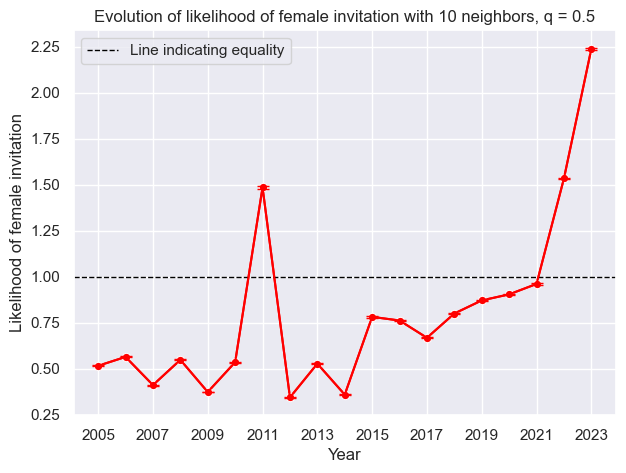


100%|███████████████████████████████████████████| 1/1 [38:29<00:00, 2309.65s/it]


In [30]:
#minkowski distance with p = 1.5, K = 10, q = 0.5
likelihoodEvolutions(oneHot_researchers, allCols, [10], 'Gender', ['Female', 'Male'], 'minkowski', [0.5], 1000, ['_F', '_M'])

### Varying K

In [38]:
#plot on top
#test
varyK_df = likelihoodEvolution_varyK(oneHot_researchers, allCols, [2, 5, 10, 20, 30, 40, 50], 'Gender', ['Female', 'Male'], 'manhattan', [0.5], 1000, ['_F', '_M'])

100%|█████████████████████████████████████████| 7/7 [6:48:41<00:00, 3503.04s/it]


In [126]:
likelihoodStats_female = getStats_likelihood(varyK_df)
likelihoodStats_female

,K,Year,Avg_likelihood,STD_likelihood,SEM_likelihood
0,2,2005,0.380807,0.066197,0.002093
1,2,2006,0.377858,0.058297,0.001844
2,2,2007,0.200143,0.038270,0.001210
3,2,2008,0.367551,0.059773,0.001890
4,2,2009,0.248782,0.033306,0.001053
...,...,...,...,...,...
128,50,2019,1.104989,0.121932,0.003856
129,50,2020,1.102142,0.120276,0.003803
130,50,2021,1.336692,0.132913,0.004203
131,50,2022,1.623130,0.151116,0.004779


In [140]:
likelihood_2

,K,Year,Avg_likelihood,STD_likelihood,SEM_likelihood
0,2,2005,0.380807,0.066197,0.002093
1,2,2006,0.377858,0.058297,0.001844
2,2,2007,0.200143,0.038270,0.001210
3,2,2008,0.367551,0.059773,0.001890
4,2,2009,0.248782,0.033306,0.001053
5,2,2010,0.492500,0.058714,0.001857
6,2,2011,0.877486,0.099221,0.003138
7,2,2012,0.350851,0.051747,0.001636
8,2,2013,0.300694,0.040563,0.001283
9,2,2014,0.431221,0.060974,0.001928


<ErrorbarContainer object of 3 artists>

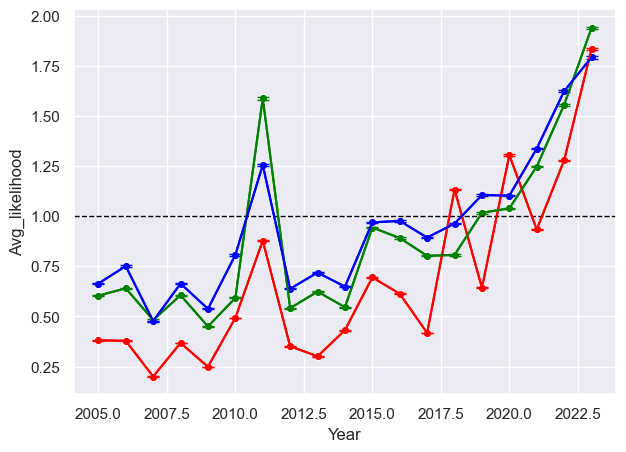

In [162]:
K_list = [2, 10, 50]
q = 0.5
likelihood_2 = likelihoodStats_female[likelihoodStats_female.K == K_list[0]]
sns.lineplot(data = likelihood_2, x = 'Year', y = 'Avg_likelihood', marker = 'o', color = 'red')
sns.lineplot(data = likelihood_10, x = 'Year', y = 'Avg_likelihood', marker = 'o', color = 'green')
sns.lineplot(data = likelihood_50, x = 'Year', y = 'Avg_likelihood', marker = 'o', color = 'blue')
plt.axhline(1, color = 'black', linewidth = 1, label = "Line indicating equality").set_linestyle("--")
plt.errorbar(x = likelihood_2.Year, y = likelihood_2.Avg_likelihood, yerr = likelihood_2.SEM_likelihood, color = 'red', capsize = 4)
plt.errorbar(x = likelihood_10.Year, y = likelihood_10.Avg_likelihood, yerr = likelihood_10.SEM_likelihood, color = 'green', capsize = 4)
plt.errorbar(x = likelihood_50.Year, y = likelihood_50.Avg_likelihood, yerr = likelihood_50.SEM_likelihood, color = 'blue', capsize = 4)
#plt.legend()
#plt.xticks(np.arange(min(years), max(years)+1, 2.0))
#plt.xlabel('Year')
#plt.ylabel('Likelihood of female invitation')
#plt.savefig("Figures/" + title + str(k) + "Neighbors_" + str(q) + ".png", bbox_inches = 'tight')
#plt.show()

In [225]:
finalLikelihood = likelihood_10[likelihood_10.Year == 2023].Avg_likelihood.values[0]

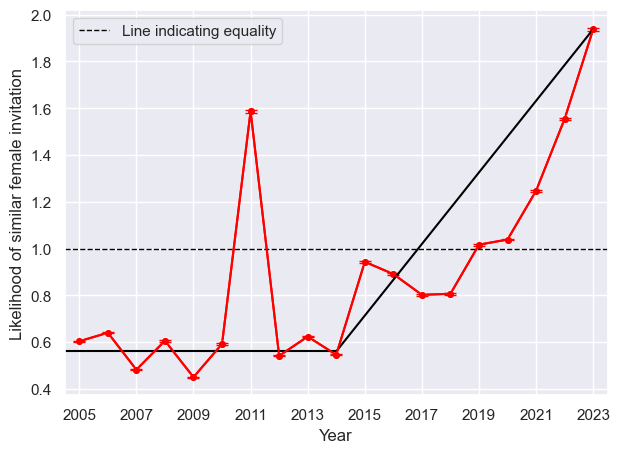

In [250]:
years = likelihood_10.Year.unique()
sns.lineplot(data = likelihood_10, x = 'Year', y = 'Avg_likelihood', marker = 'o', color = 'red')
plt.errorbar(x = likelihood_10.Year, y = likelihood_10.Avg_likelihood, yerr = likelihood_10.SEM_likelihood, color = 'red', capsize = 4)
plt.axhline(1, color = 'black', linewidth = 1, label = "Line indicating equality").set_linestyle("--")
plt.xlim(2004.5,2023.5)
#plt.axhline(0.6, color = 'black', linewidth = 1)
plt.plot([2004.5, 2014], [0.56, 0.56], color = 'black')
plt.plot([2014, 2023], [0.56,finalLikelihood], color = 'black')
plt.xticks(np.arange(min(years), max(years)+1, 2.0))
plt.legend()
plt.ylabel('Likelihood of similar female invitation')
plt.show()

[2005.         2019.81776567 2023.        ]


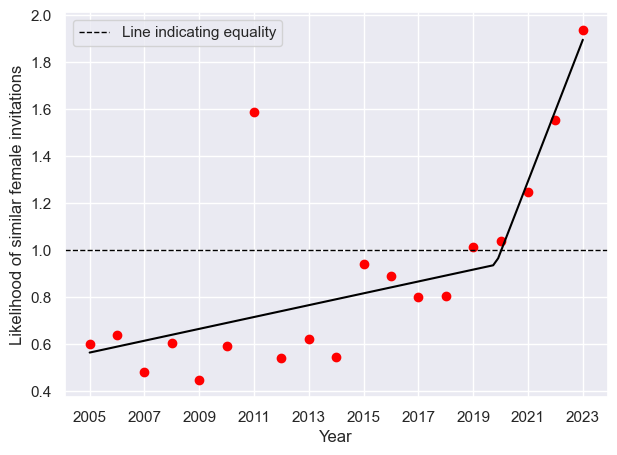

In [252]:
## fit piecewise
import pwlf
x = likelihood_10.Year.values
y = likelihood_10.Avg_likelihood.values

my_pwlf = pwlf.PiecewiseLinFit(x, y)
breaks = my_pwlf.fit(2)
print(breaks)


x_hat = np.linspace(x.min(), x.max(), 100)
y_hat = my_pwlf.predict(x_hat)

plt.figure()
plt.plot(x, y, 'o', color = 'red')
plt.plot(x_hat, y_hat, '-', color = 'black')
plt.axhline(1, color = 'black', linewidth = 1, label = "Line indicating equality").set_linestyle("--")
plt.legend()
plt.xticks(np.arange(min(years), max(years)+1, 2.0))
plt.xlabel("Year")
plt.ylabel("Likelihood of similar female invitations")
plt.show()


#now try to do it more manually
#do line from 2005 to 2015 with constant at 0.5
#then do a increasing line from 2015

  0%|                                                     | 0/1 [00:00<?, ?it/s]

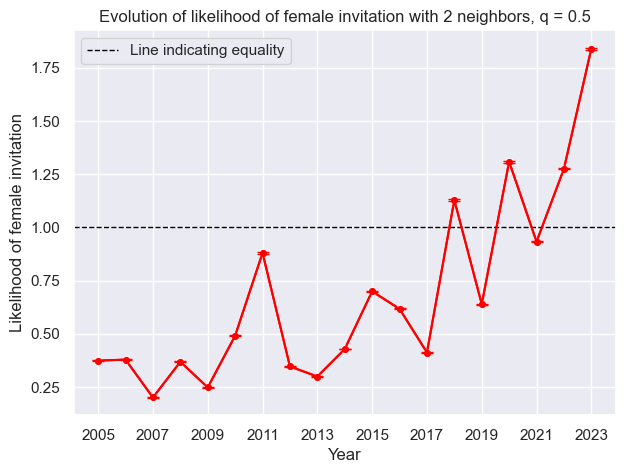


  0%|                                                     | 0/1 [00:00<?, ?it/s]

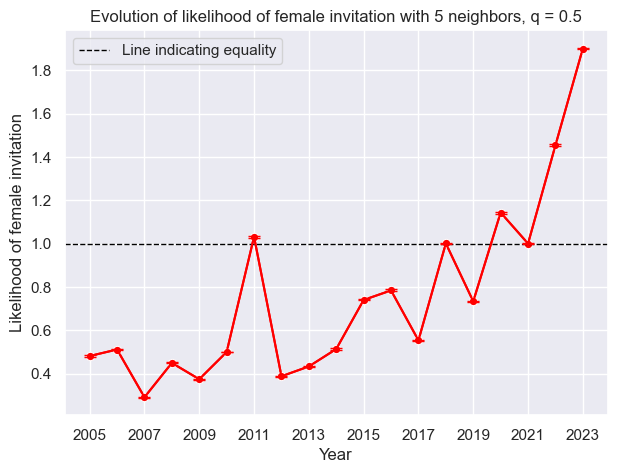


  0%|                                                     | 0/1 [00:00<?, ?it/s]

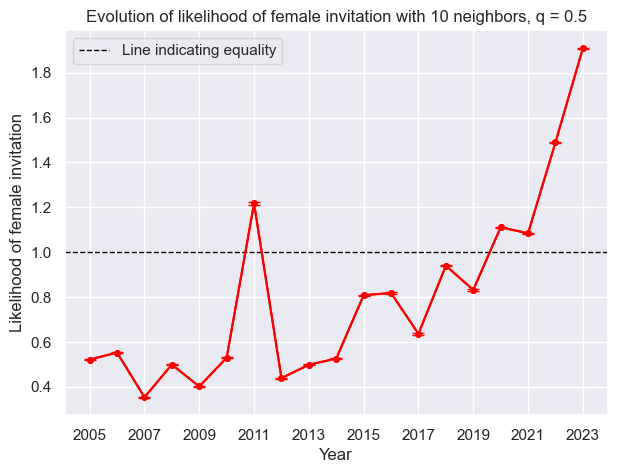


  0%|                                                     | 0/1 [00:00<?, ?it/s]

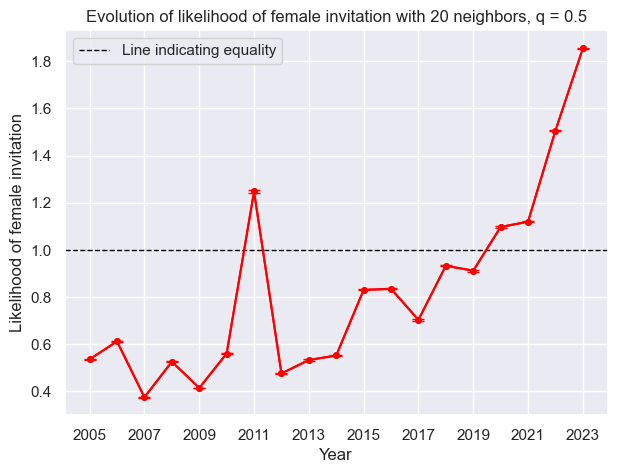


  0%|                                                     | 0/1 [00:00<?, ?it/s]

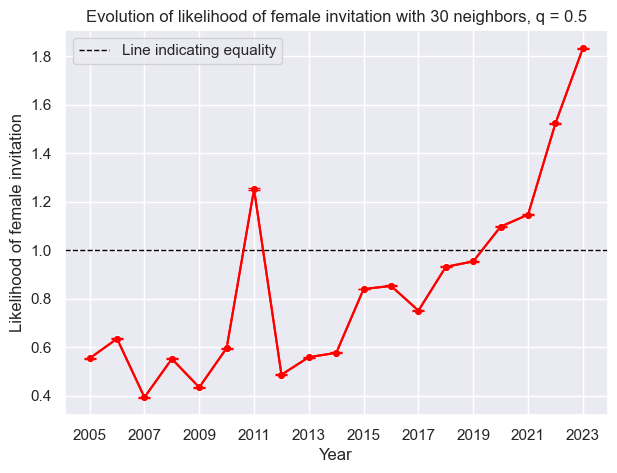


  0%|                                                     | 0/1 [00:00<?, ?it/s]

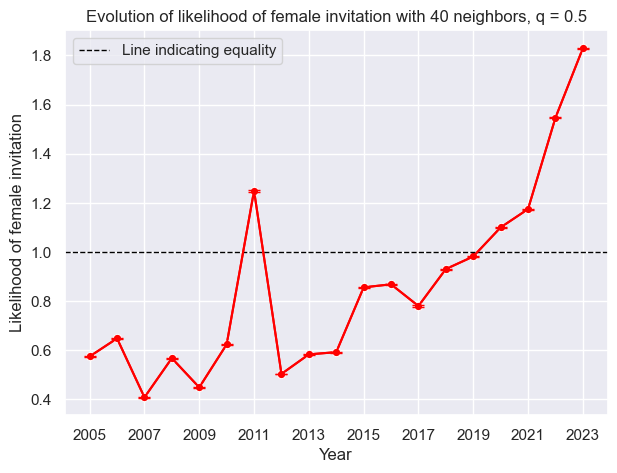


  0%|                                                     | 0/1 [00:00<?, ?it/s]

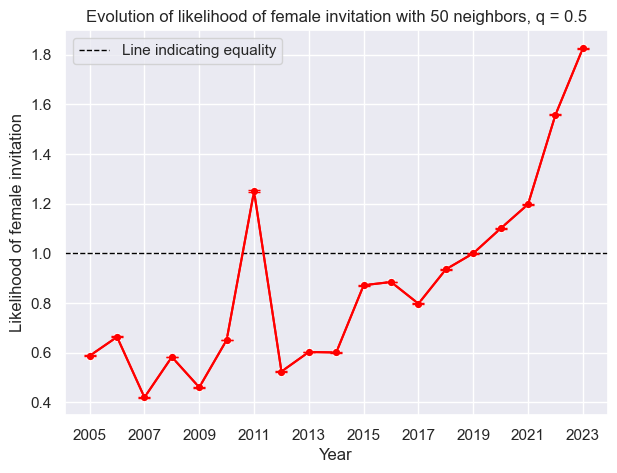


100%|█████████████████████████████████████████| 7/7 [8:43:35<00:00, 4487.92s/it]


In [31]:
#manhattan distance, q = 0.5, K varied
likelihoodEvolutions(oneHot_researchers, allCols, [2, 5, 10, 20, 30, 40, 50], 'Gender', ['Female', 'Male'], 'manhattan', [0.5], 1000, ['_F', '_M'])

My own interpretation is, that the one that the females that are most likely to be invited, is not the ones that are most similar to females. 
Is there any way we could find the likelihood of females being invited in general, or would that just be what we already have? Because it seems that the lower K, the lower likelihood.


Choosing K.
The reason we are choosing K = 10, is that using euclidean, we see one pattern for K = 1 or K = 5 and for K >= 10. The pattern we see for K >= 10 is similar to the pattern for other distance metrics. 

### Varying the quantile

  0%|                                                     | 0/7 [00:00<?, ?it/s]

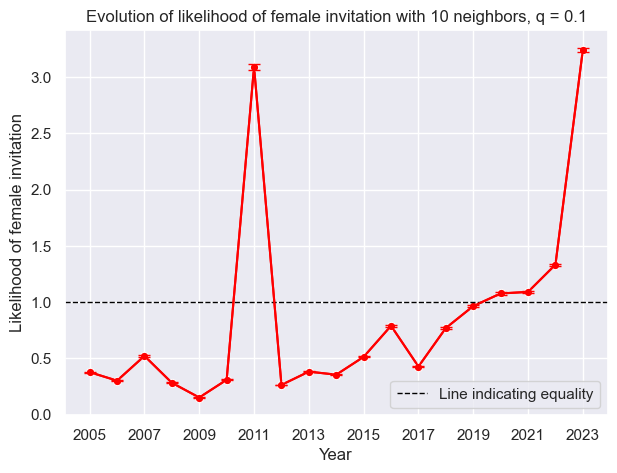


 14%|█████▊                                   | 1/7 [35:09<3:30:59, 2109.98s/it]

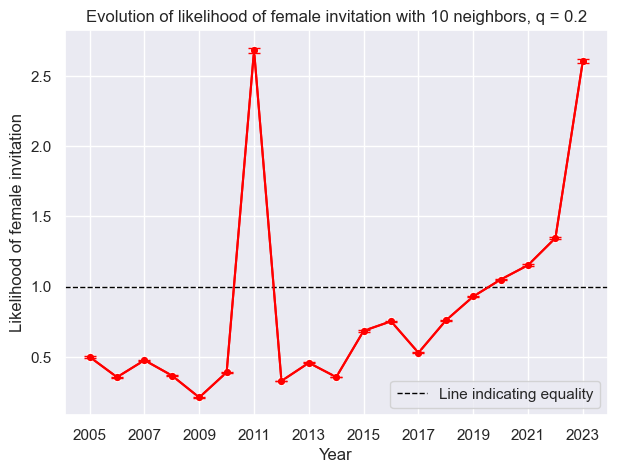


 29%|███████████▏                           | 2/7 [1:36:03<4:11:29, 3017.90s/it]

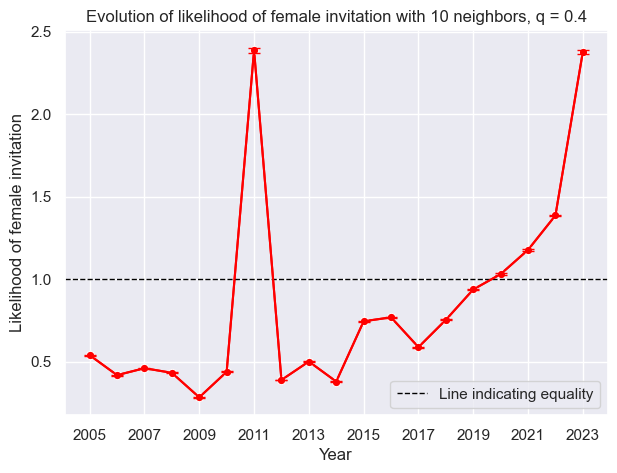


 43%|████████████████▋                      | 3/7 [2:13:32<2:57:47, 2666.79s/it]

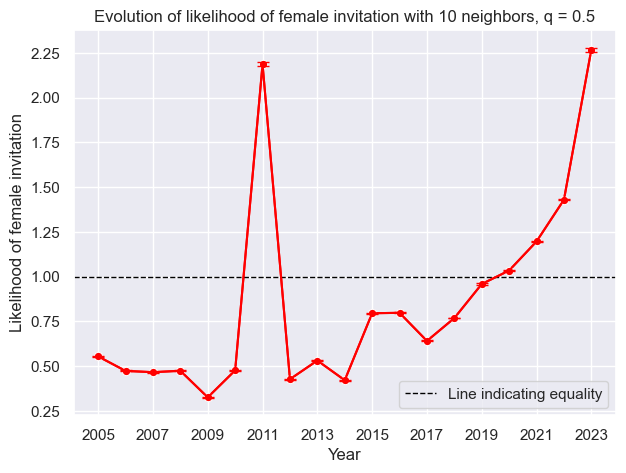


 57%|██████████████████████▎                | 4/7 [3:46:00<3:10:12, 3804.15s/it]

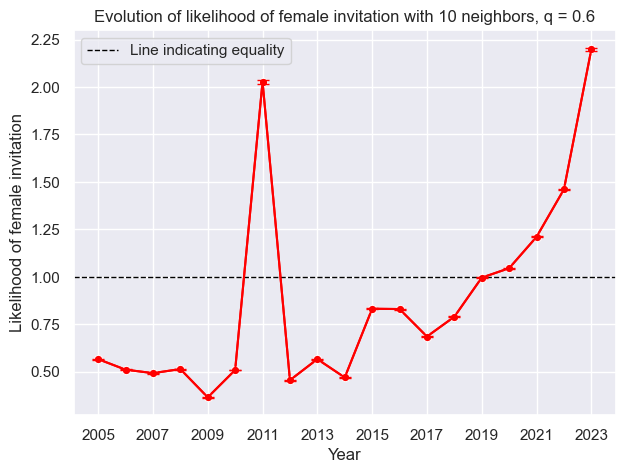


 71%|███████████████████████████▊           | 5/7 [4:33:11<1:55:06, 3453.28s/it]

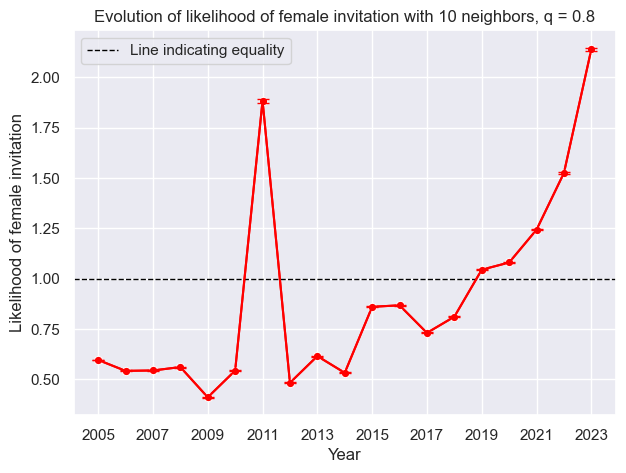


 86%|███████████████████████████████████▏     | 6/7 [5:15:01<52:12, 3132.72s/it]

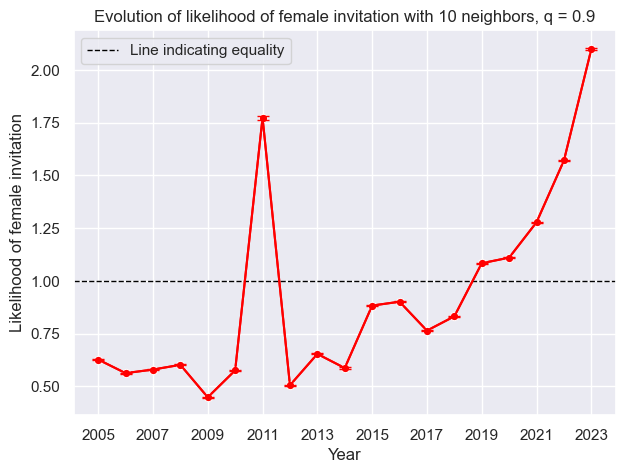


100%|████████████████████████████████████████| 1/1 [5:55:00<00:00, 21300.42s/it]


In [34]:
#manhattan distance, K = 10, q varied
likelihoodEvolutions(oneHot_researchers, allCols, [10], 'Gender', ['Female', 'Male'], 'manhattan', [0.1, 0.2, 0.4, 0.5, 0.6, 0.8, 0.9] , 1000, ['_F', '_M'])

### Filtering on seniority

In [35]:
#create seniority categories
binStart = [-1]
bins = np.arange(5, 35, 5).tolist()
bins.append(float("inf"))
binStart += bins
labels = ['0-5', '6-10', '11-15', '16-20', '21-25', '26-30', '> 30']

seniorityCat_researchers = oneHot_researchers.copy()
seniorityCat_researchers['Seniority_cat'] = pd.cut(oneHot_researchers['Seniority'], bins = binStart, labels = labels)

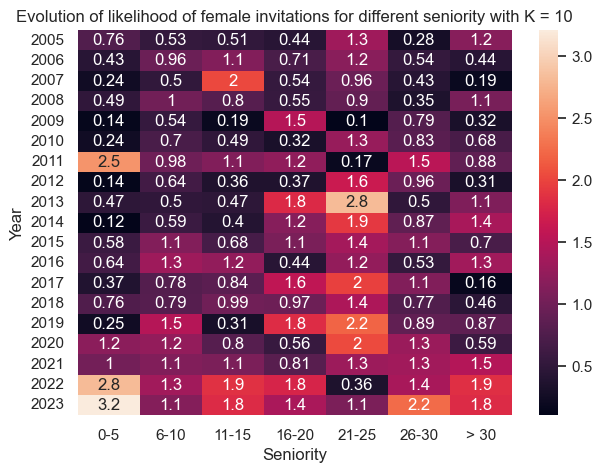

In [36]:
likelihoodEvolutions_seniority(seniorityCat_researchers, allCols, 10, 'manhattan', 0.5, 1000)

### Similarity for males

Now, the evolution of likelihood of males similar to females being invited, will be calculated. 

In [46]:
maleLikelihood = likelihoodEvolution_varyK(oneHot_researchers, allCols, [2, 5, 10, 20, 30, 40, 50], 'Gender', ['Male', 'Female'], 'manhattan', [0.5], 1000, ['_M', '_F'])

100%|█████████████████████████████████████████| 7/7 [3:35:00<00:00, 1842.93s/it]


In [255]:
likelihoodStats_male = getStats_likelihood(maleLikelihood)

,K,Year,Avg_likelihood,STD_likelihood,SEM_likelihood
0,2,2005,0.676227,0.139881,0.004423
1,2,2006,0.709642,0.186562,0.005900
2,2,2007,1.554934,0.427058,0.013505
3,2,2008,1.215768,0.341040,0.010785
4,2,2009,1.482368,0.314782,0.009954
...,...,...,...,...,...
128,50,2019,0.813676,0.144573,0.004572
129,50,2020,0.732837,0.120733,0.003818
130,50,2021,0.646831,0.102535,0.003242
131,50,2022,0.737971,0.115096,0.003640


In [263]:
likelihood_female10K = likelihoodStats_female[likelihoodStats_female.K == 10]
likelihood_male10K = likelihoodStats_male[likelihoodStats_male.K == 10]

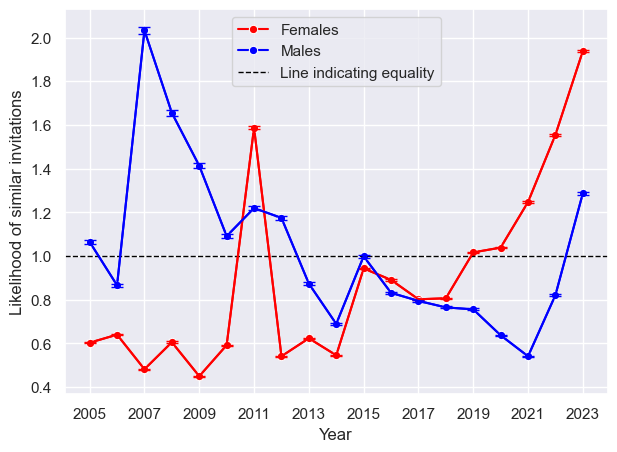

In [279]:
sns.lineplot(data = likelihood_female10K, x = 'Year', y = 'Avg_likelihood', marker = 'o', color = 'red', label = 'Females')
sns.lineplot(data = likelihood_male10K, x = 'Year', y = 'Avg_likelihood', marker = 'o', color = 'blue', label = 'Males')
plt.axhline(1, color = 'black', linewidth = 1, label = "Line indicating equality").set_linestyle("--")
plt.errorbar(x = likelihood_female10K.Year, y = likelihood_female10K.Avg_likelihood, yerr = likelihood_female10K.SEM_likelihood, color = 'red', capsize = 4)
plt.errorbar(x = likelihood_male10K.Year, y = likelihood_male10K.Avg_likelihood, yerr = likelihood_male10K.SEM_likelihood, color = 'blue', capsize = 4)
#plt.errorbar(x = likelihood_10.Year, y = likelihood_10.Avg_likelihood, yerr = likelihood_10.SEM_likelihood, color = 'green', capsize = 4)
#plt.errorbar(x = likelihood_50.Year, y = likelihood_50.Avg_likelihood, yerr = likelihood_50.SEM_likelihood, color = 'blue', capsize = 4)
plt.legend()
plt.xticks(np.arange(min(years), max(years)+1, 2.0))
plt.ylabel('Likelihood of similar invitations')
#plt.savefig("Figures/" + title + str(k) + "Neighbors_" + str(q) + ".png", bbox_inches = 'tight')
plt.show()

  0%|                                                     | 0/1 [00:00<?, ?it/s]

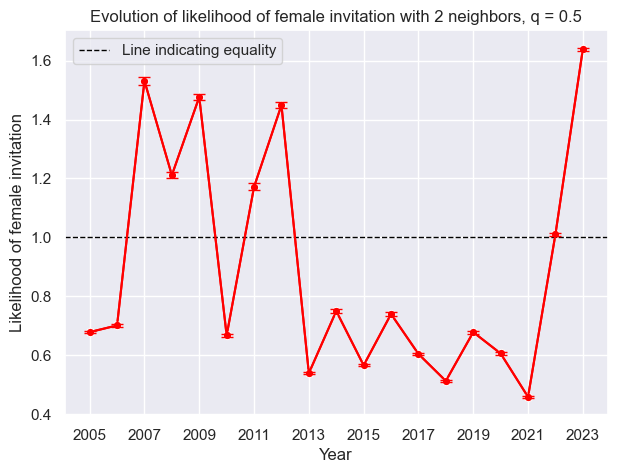


  0%|                                                     | 0/1 [00:00<?, ?it/s]

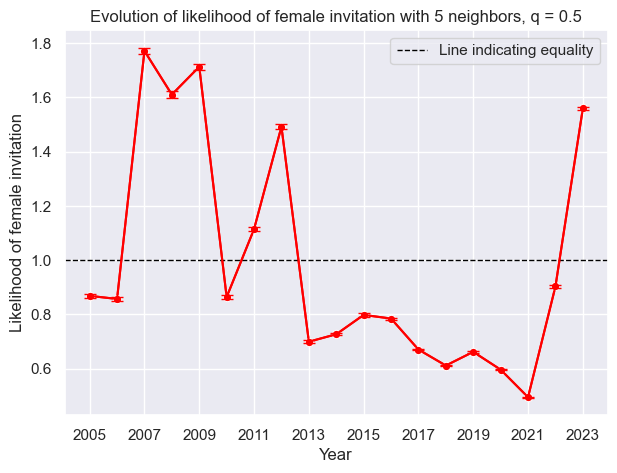


  0%|                                                     | 0/1 [00:00<?, ?it/s]

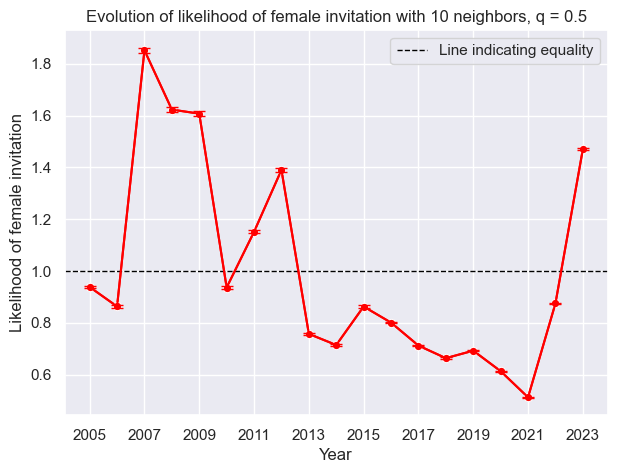


  0%|                                                     | 0/1 [00:00<?, ?it/s]

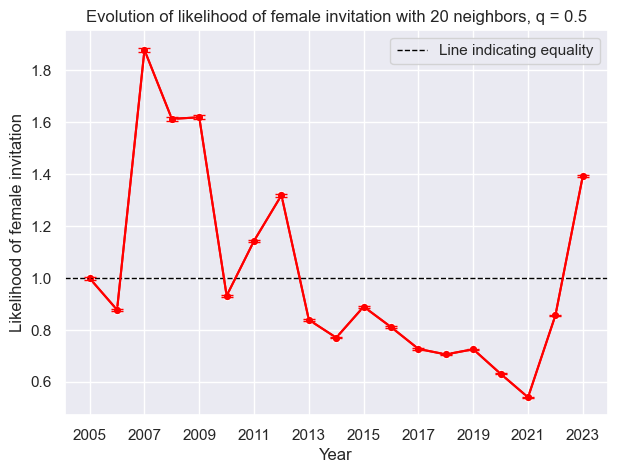


  0%|                                                     | 0/1 [00:00<?, ?it/s]

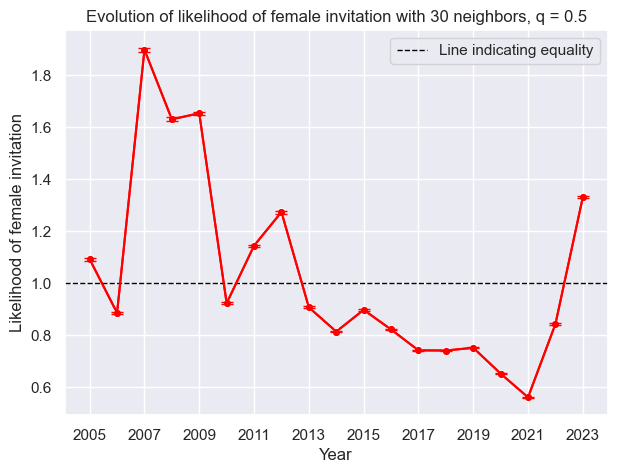


  0%|                                                     | 0/1 [00:00<?, ?it/s]

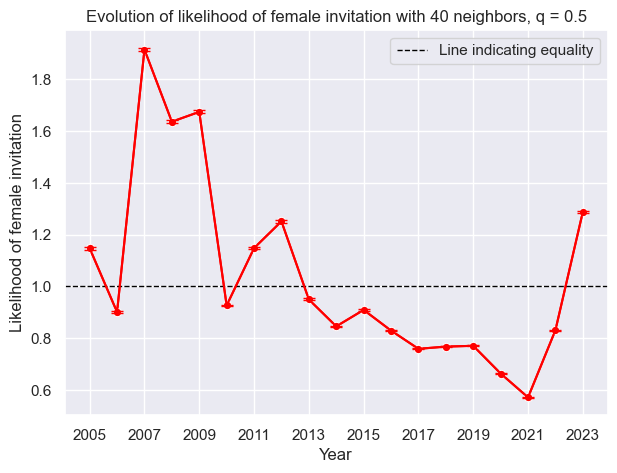


  0%|                                                     | 0/1 [00:00<?, ?it/s]

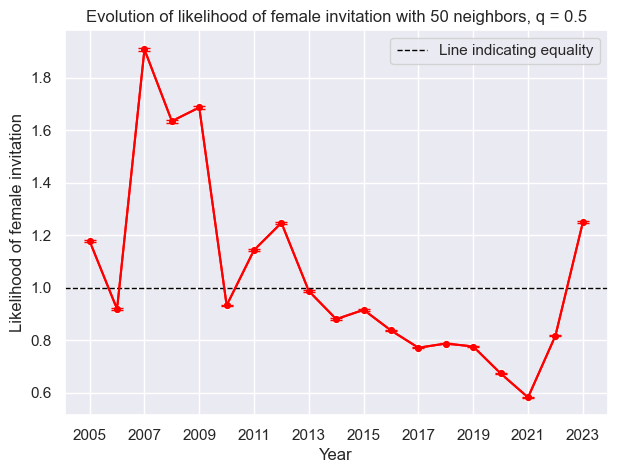


100%|█████████████████████████████████████████| 7/7 [2:07:02<00:00, 1088.86s/it]


In [44]:
likelihoodEvolutions(oneHot_researchers, allCols, [2, 5, 10, 20, 30, 40, 50], 'Gender', ['Male', 'Female'], 'manhattan', [0.5], 1000, ['_M', '_F'])

In [ ]:
#instead of doing plots.
#save df for each analysis, with year, K, q, and the data.
#the later plot

In [ ]:
#
#likelihood_stats = getStats(likelihood_df, 'likelihood') #calculate average and standard deviation
#        likelihood_stats_df = pd.DataFrame.from_dict(likelihood_stats, orient = 'index') #create df with stats on likelihood
#        plotLikelihood(likelihood_stats_df, k) #plot likelihood
#        

In [ ]:
findParameters(oneHot_researchers, 5, 'euclidean', allCols, 0.5)

In [ ]:
findParameters(oneHot_researchers, 5, 'manhattan', allCols, 0.5)

In [ ]:
findParameters(oneHot_researchers, 5, 'minkowski', allCols, 0.5)

In [61]:
def KNN(df, groupFeature, groups, year, allFeatures, oneHotFeatures_n, standardizeFeatures_n, K, q, seniorityFilter): 
        
    group1 = df[df[groupFeature] == groups[0]].reset_index(drop = True)
    group2 = df[df[groupFeature] == groups[1]].reset_index(drop = True)
    
    neighbors = NearestNeighbors(n_neighbors=K).fit(group1[allFeatures].to_numpy())
    oneHot_weight = np.repeat(1/oneHotFeatures_n, oneHotFeatures_n) #weight for one-hot encoded features
    other_weight = np.repeat(1, standardizeFeatures_n) #weight for the other features
    weights = np.hstack((oneHot_weight, other_weight)) 
    
    neighbors = NearestNeighbors(n_neighbors=K, metric='minkowski', p = 1.5, metric_params={'w': weights}, n_jobs = -1).fit(group1[allFeatures].to_numpy())
    neighbors = NearestNeighbors(n_neighbors=K).fit(group1[allFeatures].to_numpy())
    kNeighbor_dist, kNeighbor_ind = neighbors.kneighbors(group2[allFeatures].to_numpy()) 
                                    
    threshold = np.quantile(kNeighbor_dist.flatten(), q) #q quantile
    indices = kNeighbor_ind.copy().astype(float) #get indices of five nearest neighbors of all males
    indices[~(kNeighbor_dist <= threshold)] = np.nan #set indices to nan if their distance is higher than the threshold
    
    if seniorityFilter == False: #only plot if we don't filter on seniority
        plotYearlyDistances(kNeighbor_dist, threshold, year, K, groupFeature) #plot yearly distances
    return indices, group1, group2

In [315]:
#def likelihood(indices, df1, df2, suffixes, groupFeature, feature): #df1 is females/attendees, df2 is males/invited
def likelihood(ratio_group1, ratio_group2, feature):
   
    #similarResearchers_df = pd.DataFrame(data = df2['SessionType'])
    #similarResearchers_df = pd.DataFrame(data = df2[feature])
    #index_rand = [np.random.choice(i, 1)[0] for i in indices] #randomly select index for each row
    #similarResearchers_df['SimilarIndex'] = index_rand #create column with the random similar indices
    #similarResearchers_df = similarResearchers_df.dropna(subset = 'SimilarIndex') #drop rows where the researchers are not similar enough
    #similar = df1.iloc[similarResearchers_df.SimilarIndex][['SessionType']] #the random selected similar researchers
    #similar = df1.iloc[similarResearchers_df.SimilarIndex][[feature]] #the random selected similar researchers
    #similarResearchers = pd.merge(similarResearchers_df, similar, left_on = 'SimilarIndex', right_on = similar.index, how = 'inner', suffixes=(suffixes[1], suffixes[0]))
    #same females are similar to different males
    
    #calculate likelihood
    #group1 = similarResearchers['SessionType' + suffixes[0]].value_counts(normalize = True)
    #group2 = similarResearchers['SessionType' + suffixes[1]].value_counts(normalize = True)
    #group1 = similarResearchers[feature + suffixes[0]].value_counts(normalize = True)
    #group2 = similarResearchers[feature + suffixes[1]].value_counts(normalize = True)
    
    if feature in ratio_group1.index:
        group1_p = ratio_group1.loc[feature]
    else:
        group1_p = 0
        
    if feature in ratio_group2.index:
        group2_p = ratio_group2.loc[feature]
    else:
        group2_p = 0
    
    likelihood_n = group1_p/group2_p
    
    return likelihood_n

In [316]:
#delete
#def RelativeLikelihood_stats(df): #calculate average relative likelihood per year
#    likelihood_dict = {}
#    yearList = np.sort(df.Year.unique())
#    for y in yearList:
#        avg_likelihood = df[df.Year == y].Likelihood.mean()
#        std_likelihood = df[df.Year == y].Likelihood.std()
#        likelihood_dict[y] = {'Avg_likelihood': avg_likelihood, 'Std_likelihood': std_likelihood}
#    return likelihood_dict

In [103]:
#delete
def avgRatio(df): #calculate avg_ratio
    ratio_dict = {}
    yearList = np.sort(df.Year.unique())
    for y in yearList:
        avg_ratio = df[df.Year == y].Ratio.mean()
        std_ratio = df[df.Year == y].Ratio.std()
        ratio_dict[y] = {'Avg_ratio': avg_ratio, 'Std_ratio': std_ratio}
    return ratio_dict

In [22]:
def avgLikelihood_heatmap(df, K):
    index = 0
    likelihood_dict = {}
    yearList = np.sort(df.Year.unique())
    seniorityCat = df.Seniority.unique()
    for y in yearList:
        for i in seniorityCat:
            avg_likelihood = df[(df.Year == y) & (df.Seniority == i)].Likelihood.mean()
            std_likelihood = df[(df.Year == y) & (df.Seniority == i)].Likelihood.std()
            likelihood_dict[index] = {'Year': y, 'Seniority': i, 'Avg_likelihood': avg_likelihood, 'Std_likelihood': std_likelihood}
            index += 1
            
    likelihood_df =  pd.DataFrame.from_dict(likelihood_dict, orient = 'index') 
    likelihood_pivot = likelihood_df.pivot(index = 'Year', columns = 'Seniority', values = 'Avg_likelihood')
    xlabels = ['0-5', '6-10', '11-15', '16-20', '21-25', '26-30', '> 30']
    
    #log_norm = LogNorm(vmin=likelihood_pivot.min().min(), vmax=likelihood_pivot.max().max())
     #norm = log_norm
    sns.heatmap(likelihood_pivot, annot=True, xticklabels = xlabels)
    plt.title('Evolution of likelihood of female invitations for different seniority with K = ' + str(K))
    plt.savefig('Figures/likelihoodHeatmap_' + str(K) + 'Neighbors.png', bbox_inches='tight')
    plt.show()

In [249]:
def plotRatio(df, k):
    years = df.index.tolist()

    sns.lineplot(data = df, x = df.index, y = 'Avg_FemaleInvRatio', marker = 'o', color = 'darkseagreen', label = 'True ratio of female invited speakers')
    sns.lineplot(data = df, x = df.index, y = 'Avg_FemaleAttRatio', marker = 'o', color = 'peru', label = 'Ratio of potential invited speakers')
    plt.errorbar(x = df.index, y = df['Avg_FemaleInvRatio'], yerr = df['Std_FemaleInvRatio'], color = 'darkseagreen', capsize = 4)
    plt.errorbar(x = df.index, y = df['Avg_FemaleAttRatio'], yerr = df['Std_FemaleAttRatio'], color = 'peru', capsize = 4)
    plt.xticks(np.arange(min(years), max(years)+1, 2.0))
    plt.xlabel('Year')
    plt.ylabel('Ratio')
    plt.title("Evolution of ratio of true and potential invited speakers = " + str(k) + " neighbors")
    plt.savefig("Figures/ratioEvolution_PotentialInv" + str(k) + "Neighbors.png", bbox_inches='tight')
    plt.show()

In [23]:
def likelihoodEvolution(df, standardizeFeatures, allFeatures, K, q, N, groupFeature, groups, seniorityFilter, suffixes, sessionType): #calculate likelihood of females being invited as speakers over the years
    likelihood_dict = {}
    index = 0
    researchers = df.copy()
    n_oneHotFeatures = len(allFeatures) - len(standardizeFeatures) #number of features from one-hot encoding
    standardizeFeatures_n = len(standardizeFeatures)
    
    for c in standardizeFeatures:
        researchers[c] = standardizeColumn(researchers, c) #standardize data
    
    for k in tqdm(K):
        yearList = np.sort(researchers.Year.unique())
        for y in yearList:
        #for y in yearList:
            year_df = researchers[researchers.Year == y] #get all data from year y
            if seniorityFilter == True:
                seniorityLabels = year_df.Seniority_cat.unique().tolist()
                for i in seniorityLabels:
                    cat_df = year_df[year_df.Seniority_cat == i]
                    indices, group1, group2 = KNN(cat_df, groupFeature, groups, y, allFeatures, n_oneHotFeatures, standardizeFeatures_n, k, q, seniorityFilter)                             
                    #calculate likelihood
                    for n in range(0,N):
                        lh = likelihood(indices, group1, group2, suffixes, sessionType)
                        likelihood_dict[index] = {'Year': y, 'Seniority': i, 'Iteration': n, 'Likelihood': lh}
                        index += 1

            else:
                indices, group1, group2 = KNN(df, groupFeature, groups, y, allFeatures, n_oneHotFeatures, standardizeFeatures_n, k, q, seniorityFilter)
                #calculate likelihood
                for n in range(0,N):
                    lh = likelihood(indices, group1, group2, suffixes, sessionType)
                    likelihood_dict[index] = {'Year': y, 'Iteration': n, 'Likelihood': lh}
                    index += 1
    
            
        likelihood_df = pd.DataFrame.from_dict(likelihood_dict, orient='index') #create df with likelihood
        
        
        if seniorityFilter == True:
            avgLikelihood_heatmap(likelihood_df, k)


        else:
            likelihood_stats = RelativeLikelihood_stats(likelihood_df) #calculate average and standard deviation
            likelihood_stats_df = pd.DataFrame.from_dict(likelihood_stats, orient = 'index') #create df with stats on likelihood
            plotLikelihood(likelihood_stats_df, k) #plot likelihood
            
            
#now try with False with seniority filter
#then try with invited and non-invited

In [317]:
###test of how we can make function work with similar females, similar females within same seniority, attendees similar to invited speakers
def likelihoodEvolutions(df, allFeatures, K, N, groupFeature, seniorityFilter):
    standardizeFeatures = ['Seniority', 'CumulativePaperCount', 'Productivity'] #features to standardize
    q = 0.5 #quantile
    likelihood_dict = {}
    ratio_dict = {}
    index = 0
    standardizeFeatures_n = len(standardizeFeatures) #number of features to standardize
    n_oneHotFeatures = len(allFeatures) - standardizeFeatures_n #number of features from one-hot encoding
    researchers = df.copy()
    
    for c in standardizeFeatures:
        researchers[c] = standardizeColumn(researchers, c) #standardize data
    
    for k in tqdm(K): 
        yearList = np.sort(researchers.Year.unique())
        for y in yearList:
            year_df = researchers[researchers.Year == y] #filter by year
            if groupFeature == 'Gender':
                groups = ['Female', 'Male']
                suffixes = ['_F', '_M']
                analysisFeature = 'SessionType'
                if seniorityFilter == True:
                    seniorityLabels = year_df.Seniority_cat.unique().tolist()
                    for i in seniorityLabels:
                        cat_df = year_df[year_df.Seniority_cat == i]
                        indices, females, males = KNN(cat_df, groupFeature, groups, y, allFeatures, n_oneHotFeatures, standardizeFeatures_n, k, q, seniorityFilter)
                        #calcualte likelihood
                        for n in range(0,N):
                            ratio1, ratio2 = getRatio(indices, females, males, suffixes, analysisFeature)
                            lh = likelihood(ratio1, ratio2, 'invited')
                            #lh = likelihood(indices, females, males, suffixes, groupFeature, analysisFeature)
                            likelihood_dict[index] = {'Year': y, 'Seniority': i, 'Iteration': n, 'Likelihood': lh}
                            index += 1
                            
                else:
                    indices, females, males = KNN(year_df, groupFeature, groups, y, allFeatures, n_oneHotFeatures, standardizeFeatures_n, k, q, seniorityFilter)
                    #calculate likelihood
                    for n in range(0,N):
                        ratio1, ratio2 = getRatio(indices, females, males, suffixes, analysisFeature)
                        lh = likelihood(ratio1, ratio2, 'invited')
                        likelihood_dict[index] = {'Year': y, 'Iteration': n, 'Likelihood': lh}
                        index += 1
                        
            elif groupFeature == 'SessionType':
                groups = ['attendee', 'invited']
                suffixes = ['_att', '_inv']
                analysisFeature = 'Gender'
                
                indices, attendees, invited = KNN(year_df, groupFeature, groups, y, allFeatures, n_oneHotFeatures, standardizeFeatures_n, k, q, seniorityFilter)
                #calculate likelihood
                for n in range(0, N):
                    ratio_att, ratio_inv = getRatio(indices, attendees, invited, suffixes, analysisFeature) 
                    ratio_att_F = ratio_att.loc['Female'] #ratio of female attendees
                    ratio_inv_F = ratio_inv.loc['Female'] #ratio of female invited
                    ratio_dict[index] = {'Year': y, 'Iteration': n, 'FemaleInvRatio': ratio_inv_F, 'FemaleAttRatio': ratio_att_F}
                    index += 1
        
        if groupFeature == 'Gender':
            print(groupFeature)
            likelihood_df = pd.DataFrame.from_dict(likelihood_dict, orient = 'index') #create df with likelihood
            if seniorityFilter == True:
                avgLikelihood_heatmap(likelihood_df, k)
            else:
                #likelihood_stats = RelativeLikelihood_stats(likelihood_df) #calculate average and standard deviation
                likelihood_stats = getStats(likelihood_df, 'Likelihood')  #calculate average and standard deviation
                likelihood_stats_df = pd.DataFrame.from_dict(likelihood_stats, orient = 'index') #create df with stats on likelihood
                plotLikelihood(likelihood_stats_df, k) #plot likelihood
        
        else: #when groupFeature is SessionType
            ratio_df = pd.DataFrame.from_dict(ratio_dict, orient = 'index') #create df with likelihood
            #ratio_stats = avgRatio(df)
            ratioInv_stats = pd.DataFrame.from_dict(getStats(ratio_df, 'FemaleInvRatio'), orient = 'index')  #calculate average and standard deviation for female invited
            ratioAtt_stats = pd.DataFrame.from_dict(getStats(ratio_df, 'FemaleAttRatio'), orient = 'index') #calculate average and standard deviation for female attendees
            ratio_stats_df = pd.merge(ratioInv_stats, ratioAtt_stats, left_index = True, right_index = True)
#            pd.DataFrame.from_dict(ratio_stats, orient = 'index') #create df with stats on likelihood
            plotRatio(ratio_stats_df, k)
           
        
        
       

            
#now try with False with seniority filter
#then try with invited and non-invited

In [318]:
allCols = knownUnits
allCols += ['Seniority', 'CumulativePaperCount', 'Productivity']

  0%|                                                     | 0/6 [00:00<?, ?it/s]

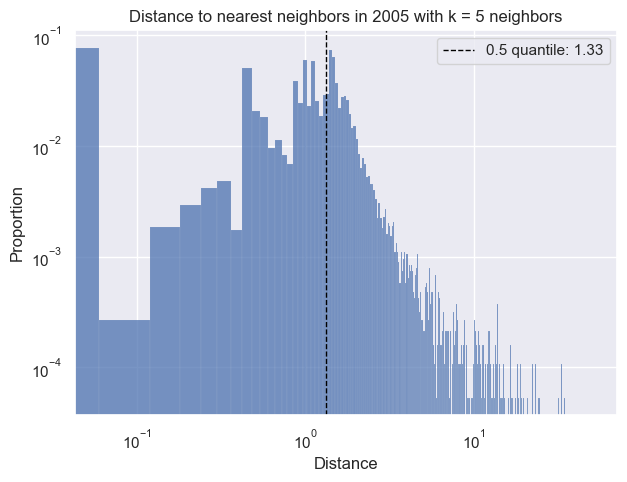

  0%|                                                     | 0/6 [00:03<?, ?it/s]

KeyboardInterrupt



In [322]:
#likelihood of similar females being invited
likelihoodEvolutions(oneHot_researchers, allCols, [5, 10, 20, 30, 40, 50], 1000, 'Gender', False)

  0%|                                                     | 0/6 [00:00<?, ?it/s]

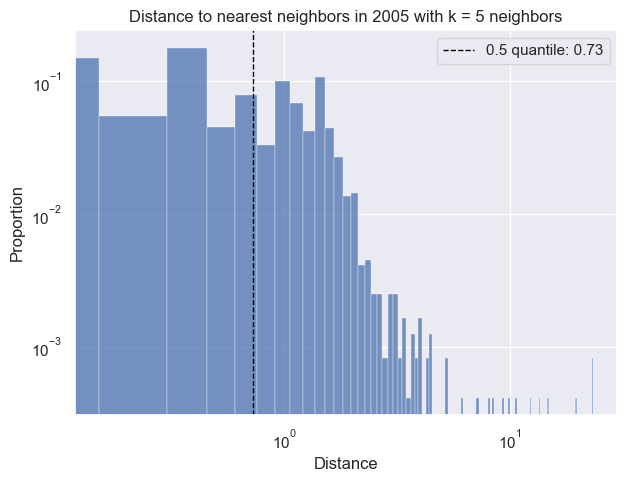

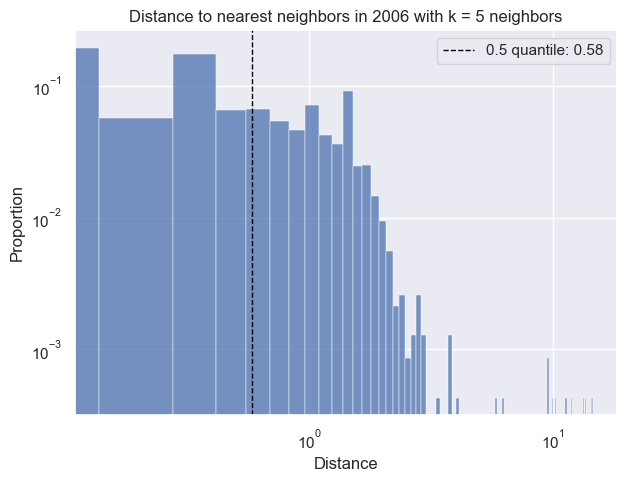

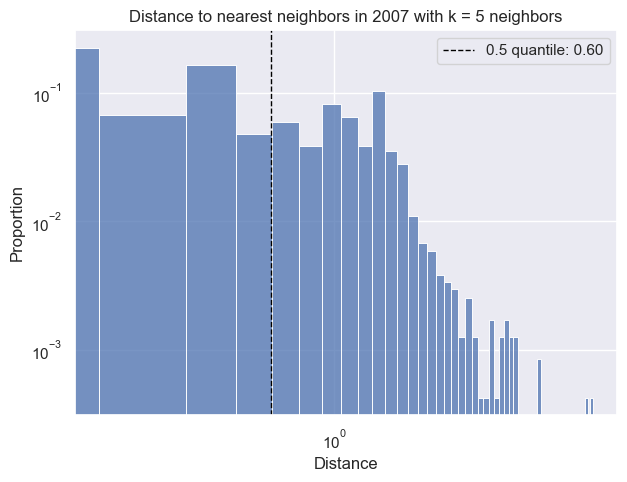

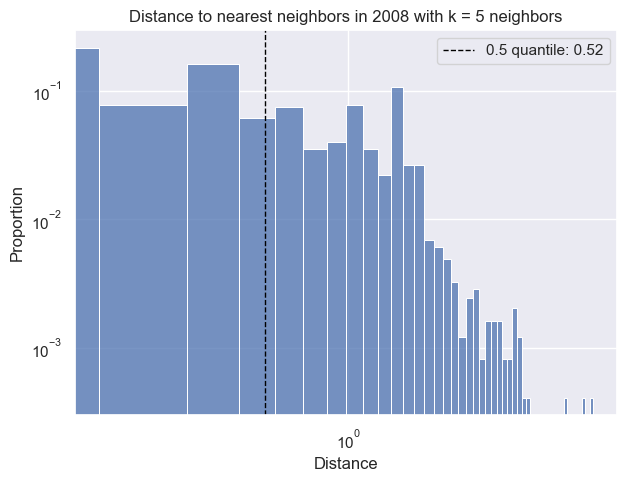

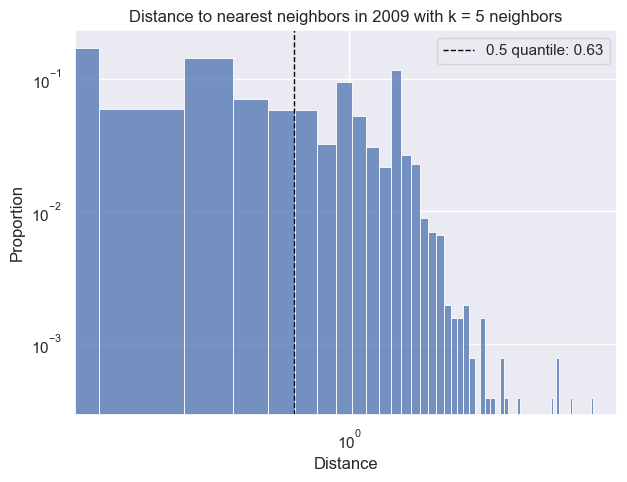

...

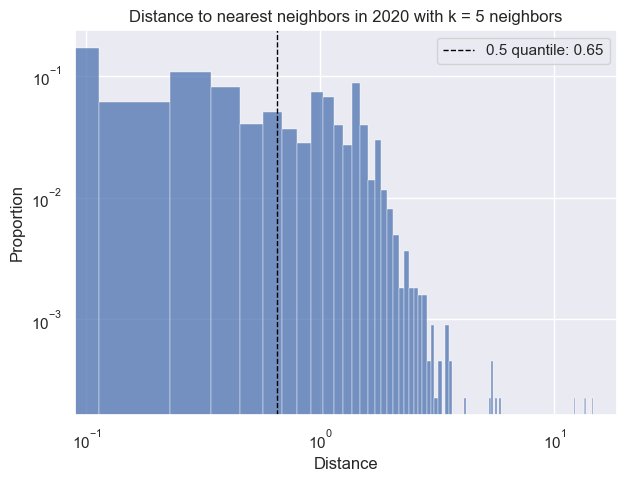

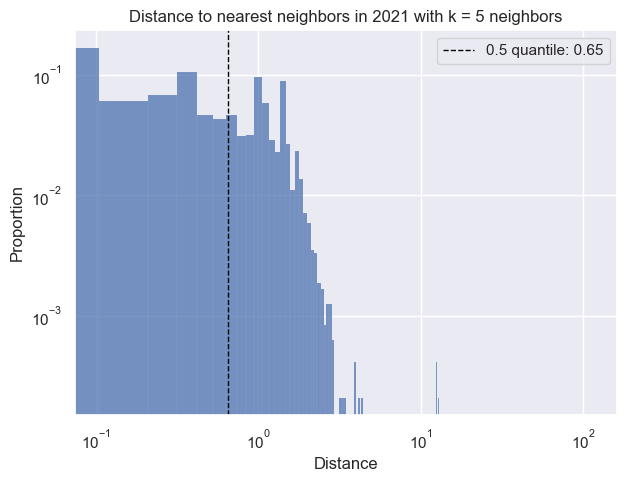

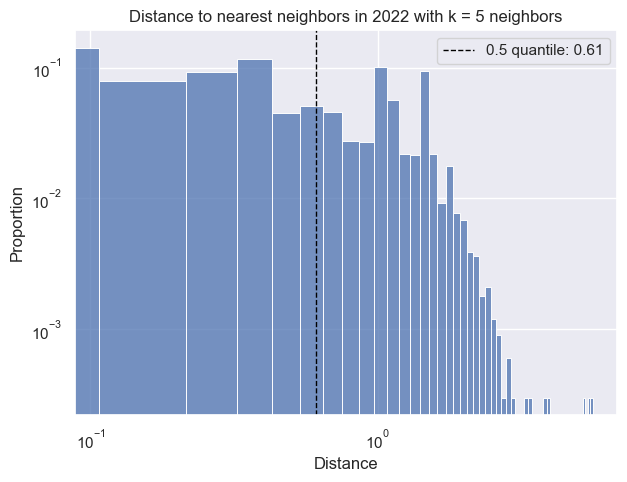

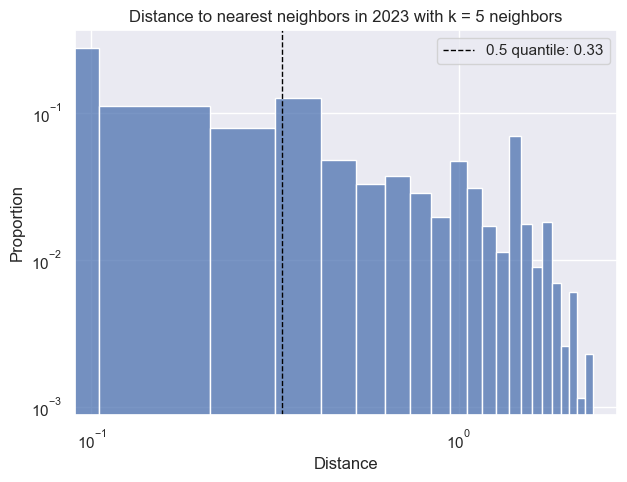

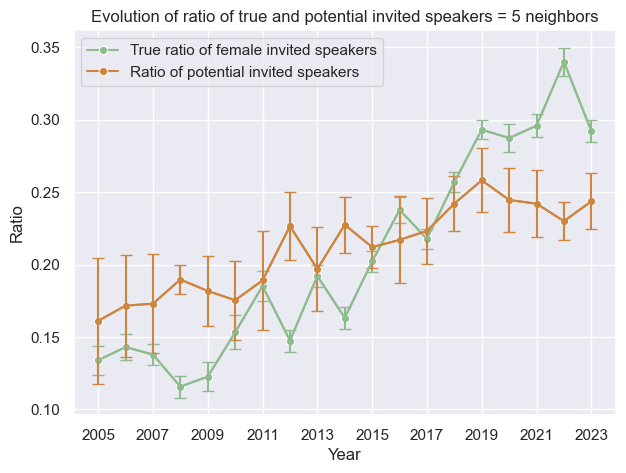

 17%|███████▌                                     | 1/6 [00:23<01:59, 23.88s/it]

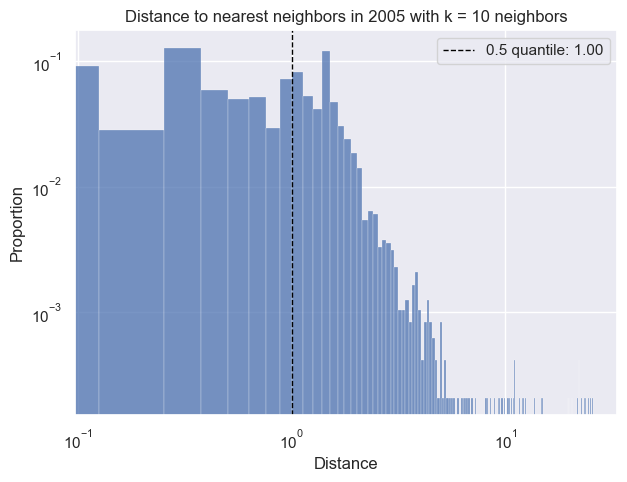

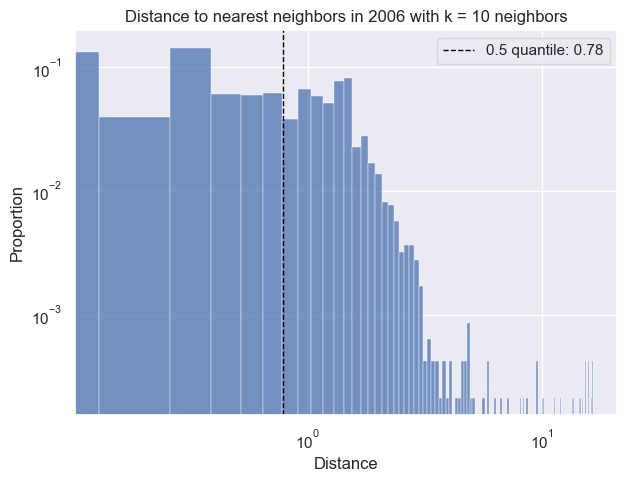

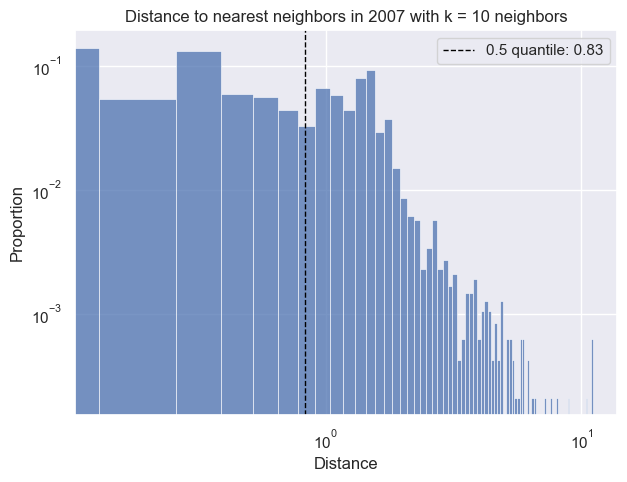

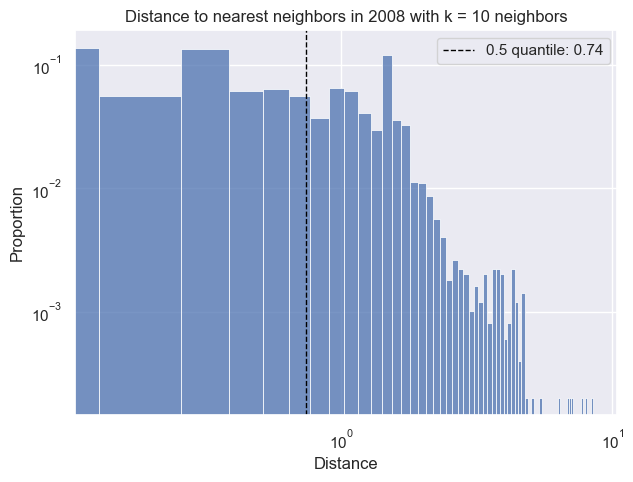

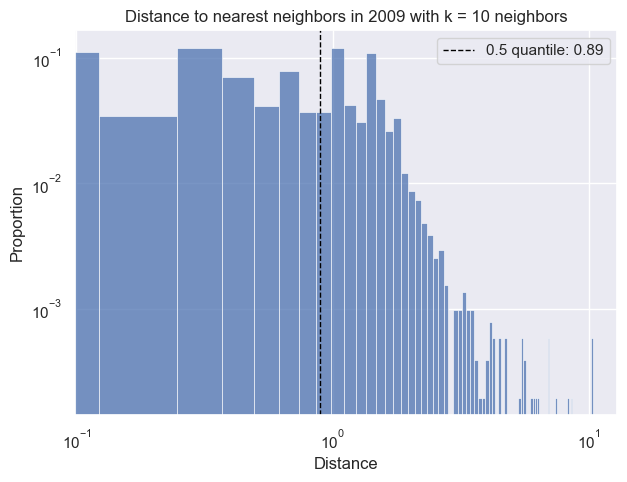

...

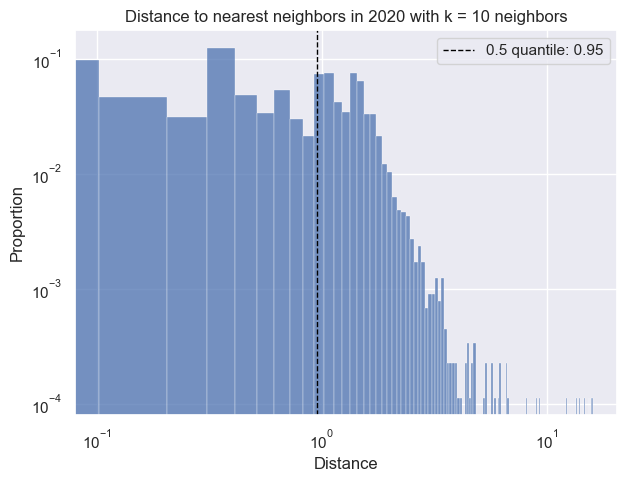

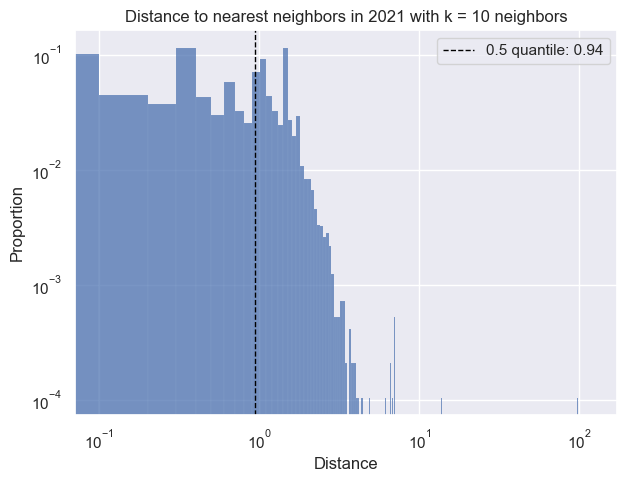

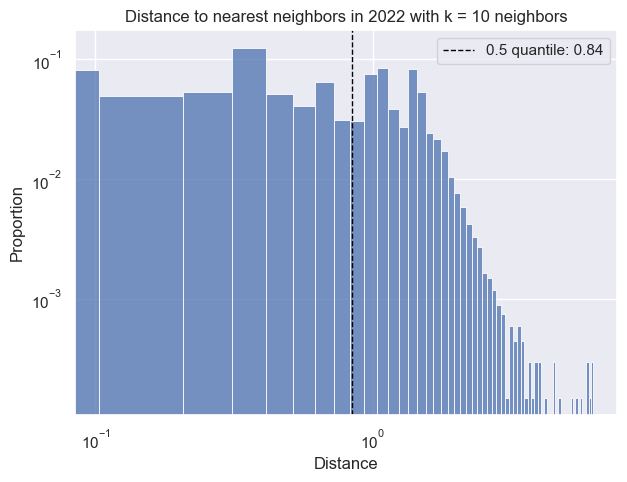

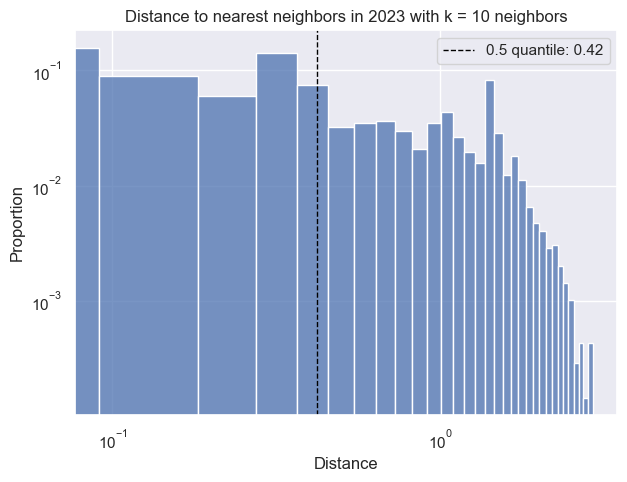

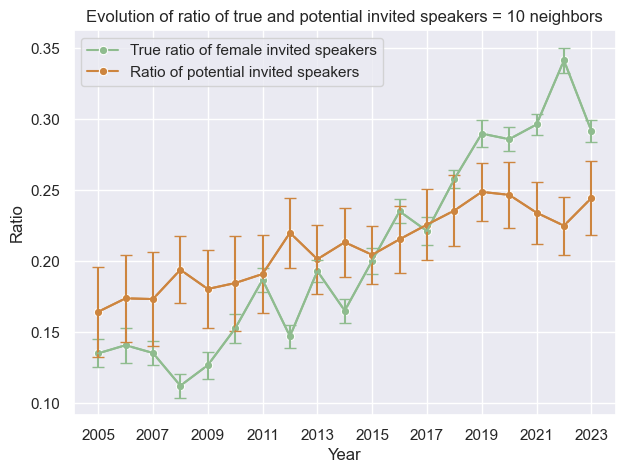

 33%|███████████████                              | 2/6 [00:47<01:34, 23.71s/it]

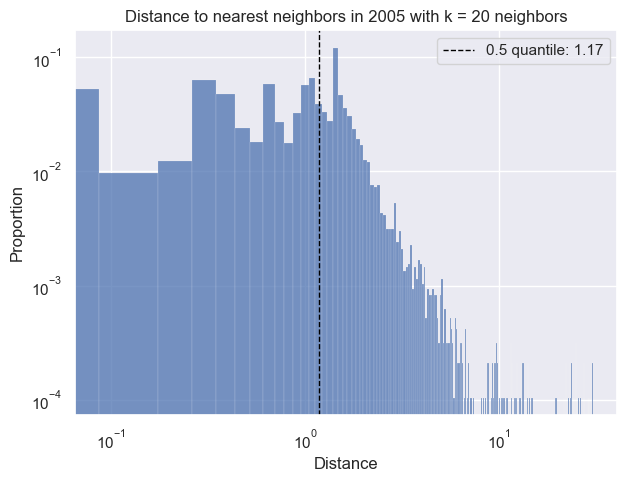

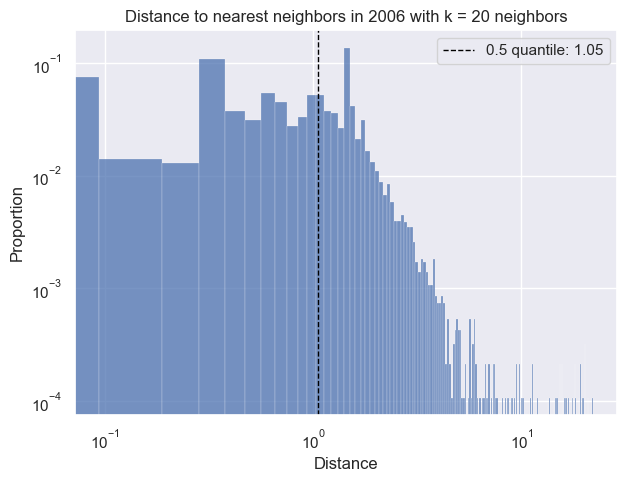

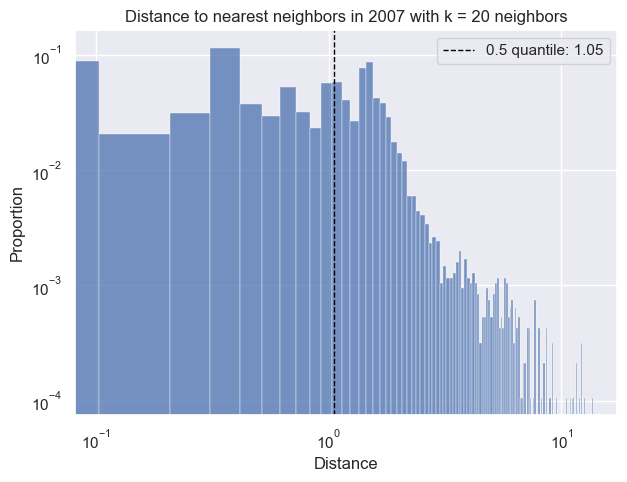

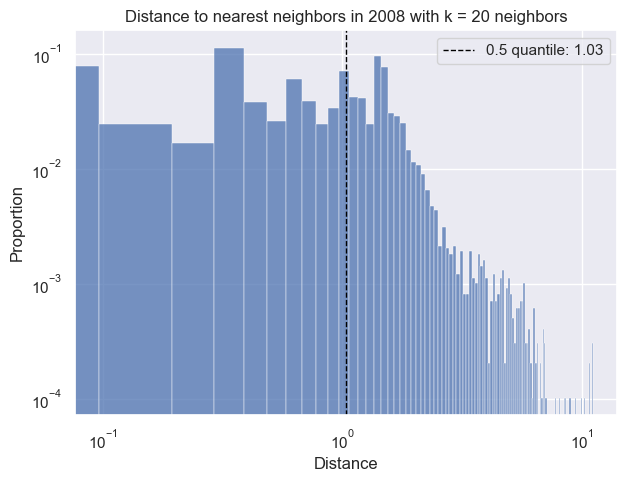

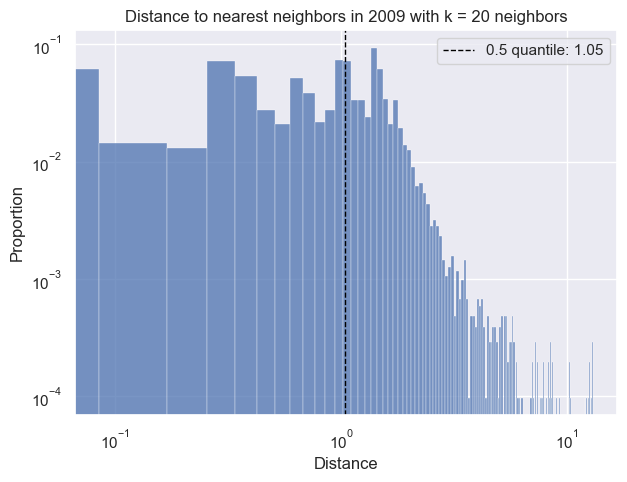

...

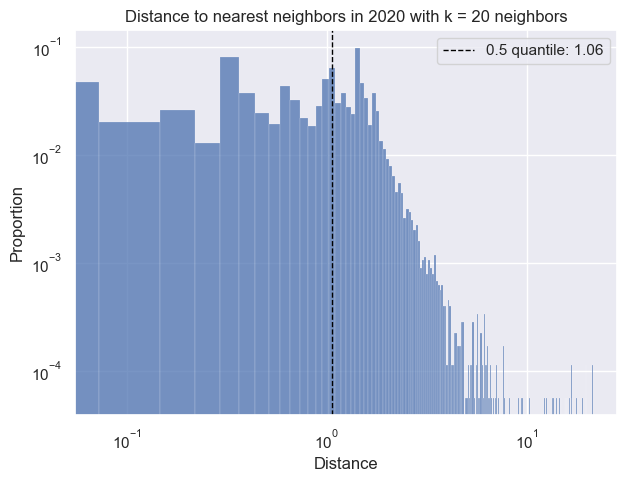

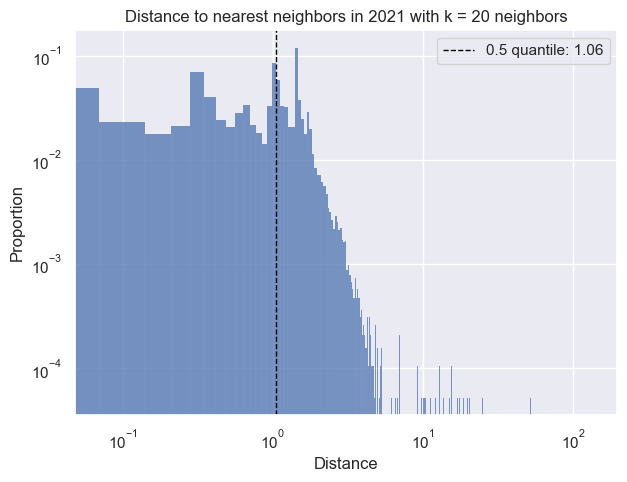

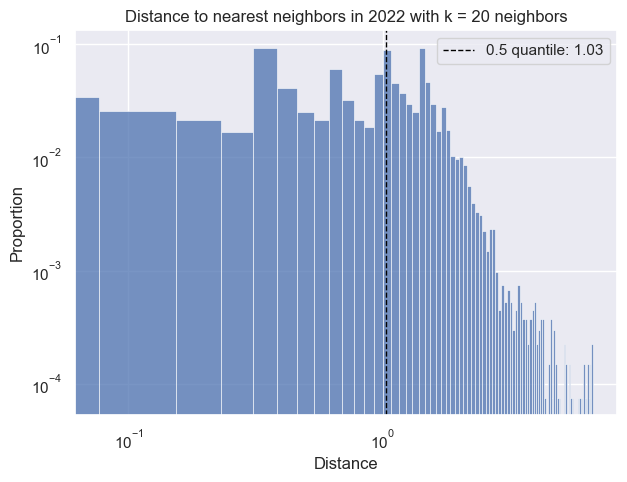

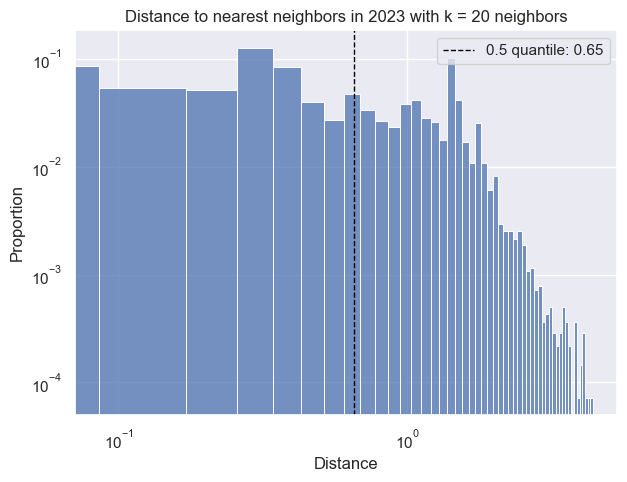

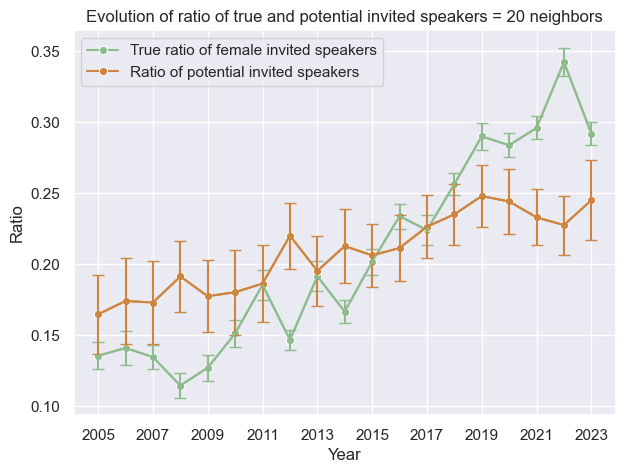

 50%|██████████████████████▌                      | 3/6 [01:16<01:18, 26.13s/it]

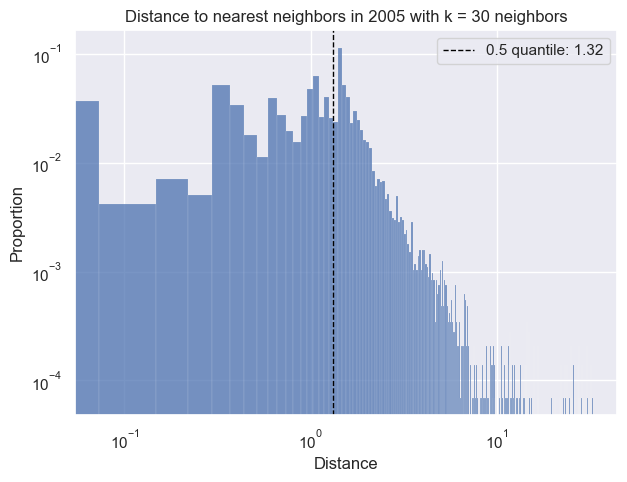

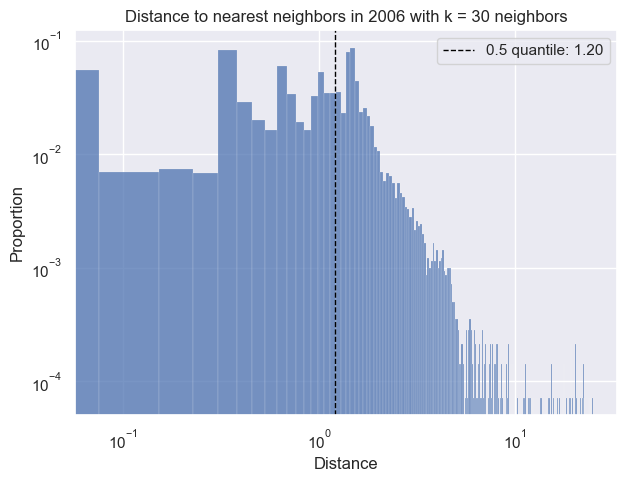

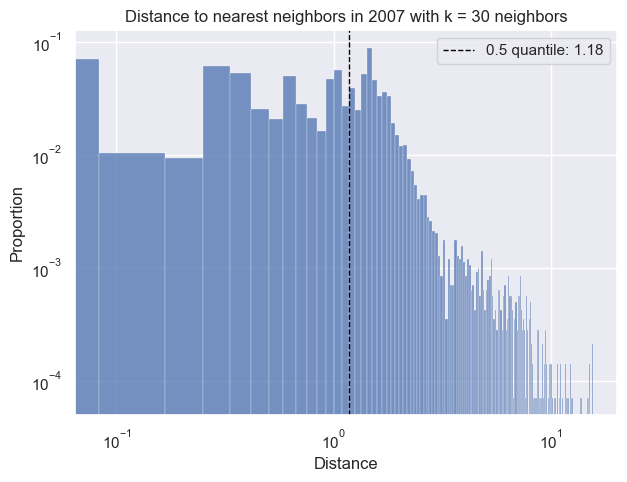

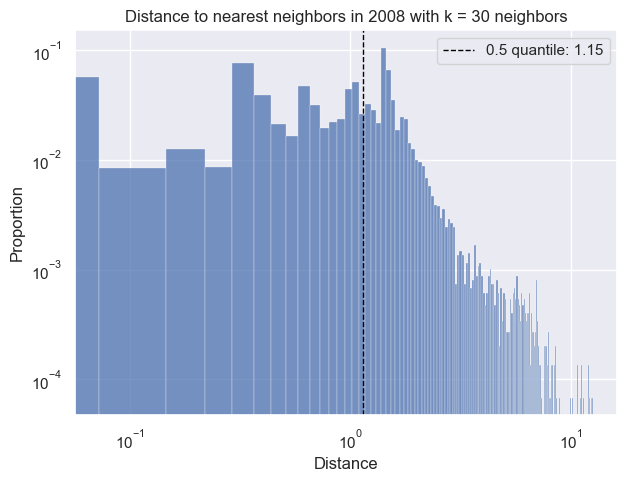

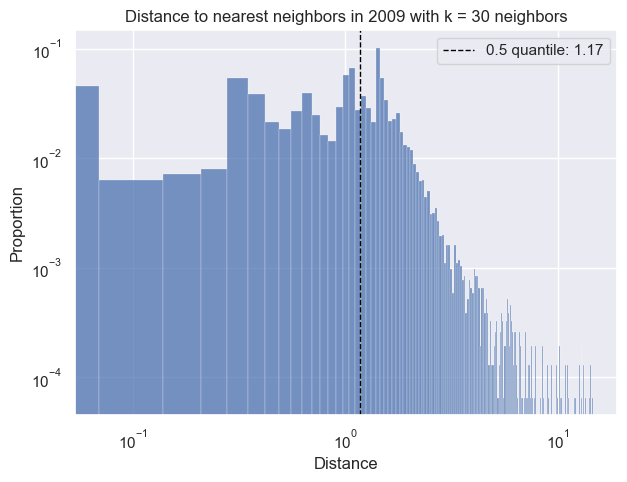

...

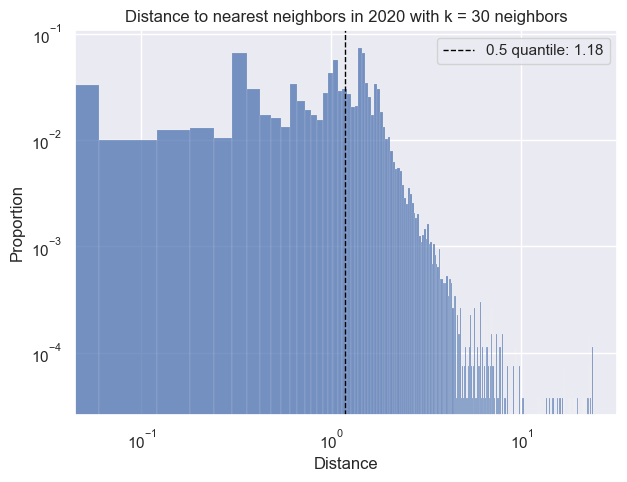

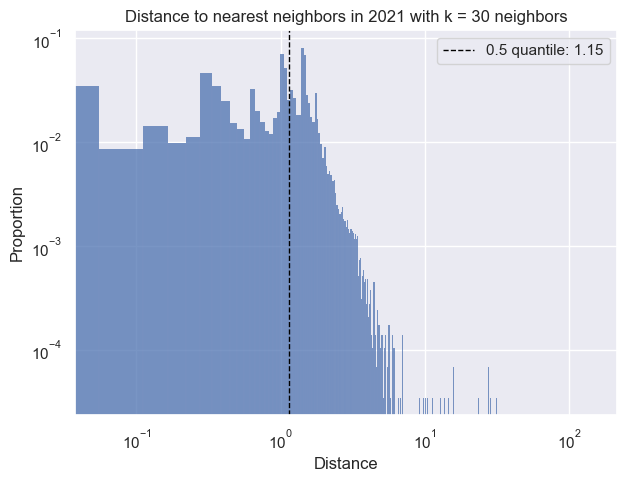

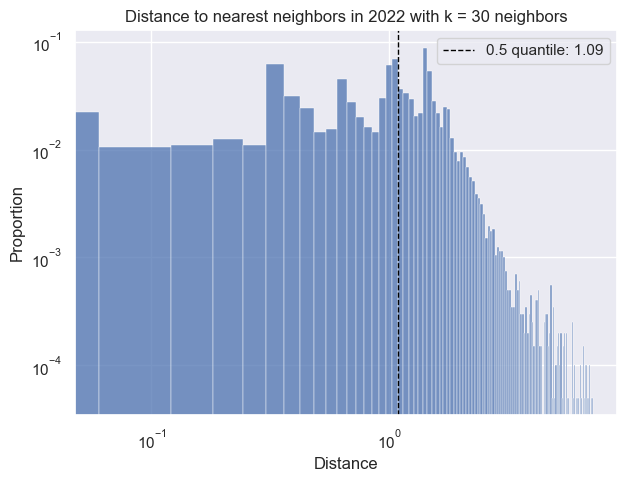

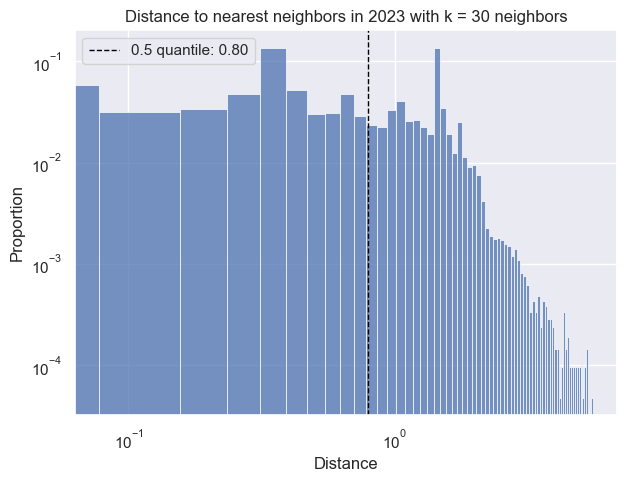

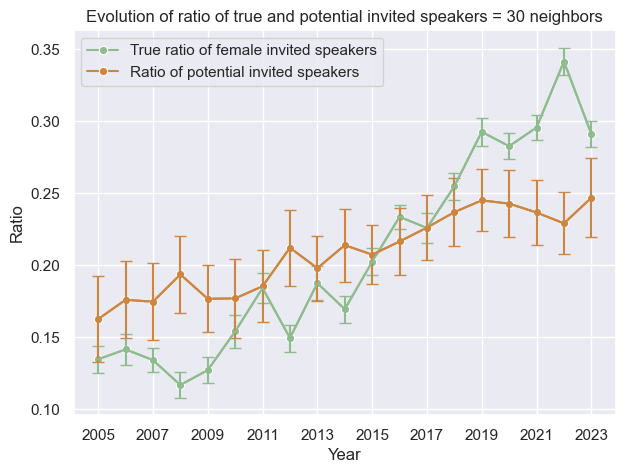

 67%|██████████████████████████████               | 4/6 [01:50<00:58, 29.43s/it]

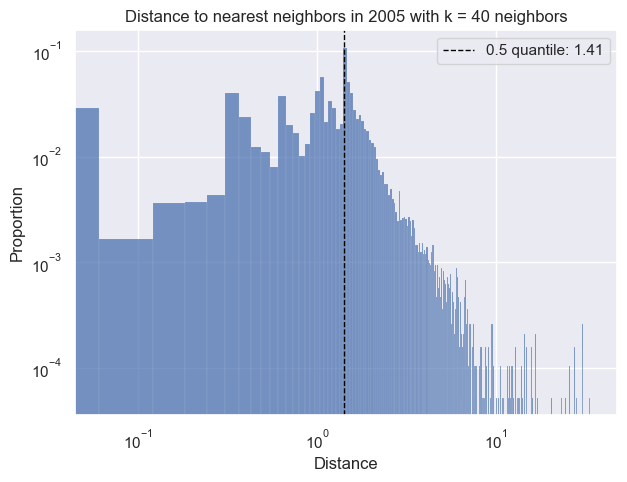

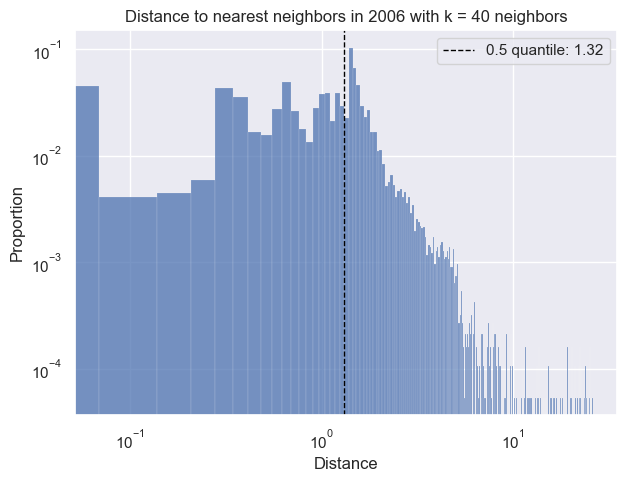

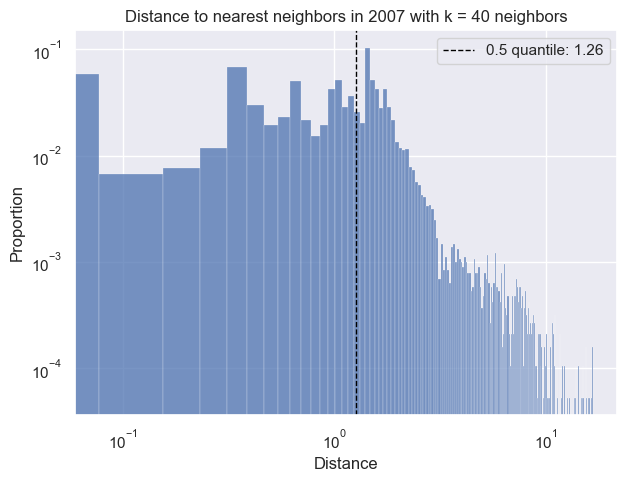

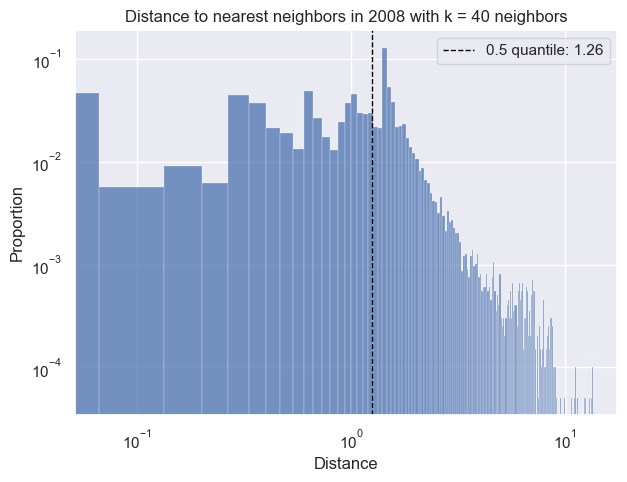

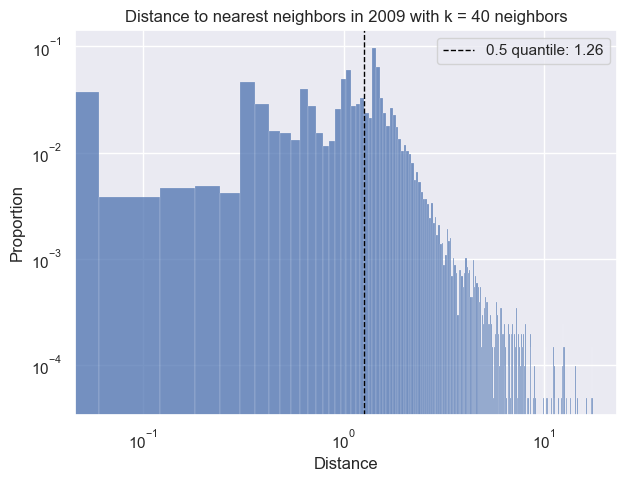

...

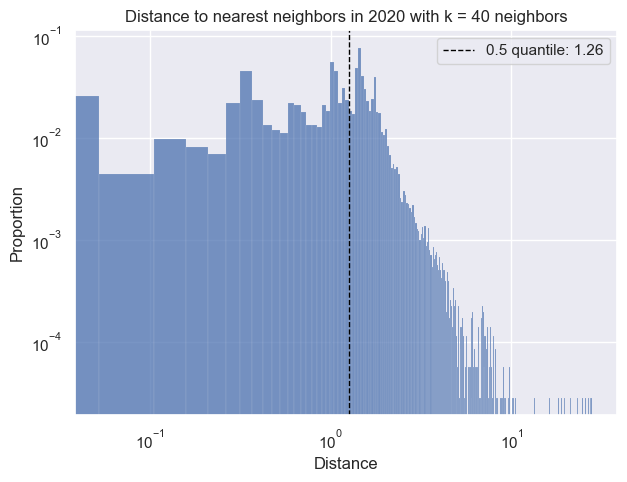

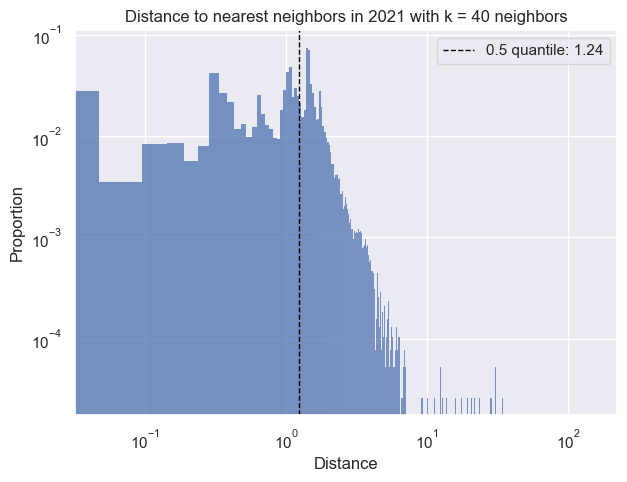

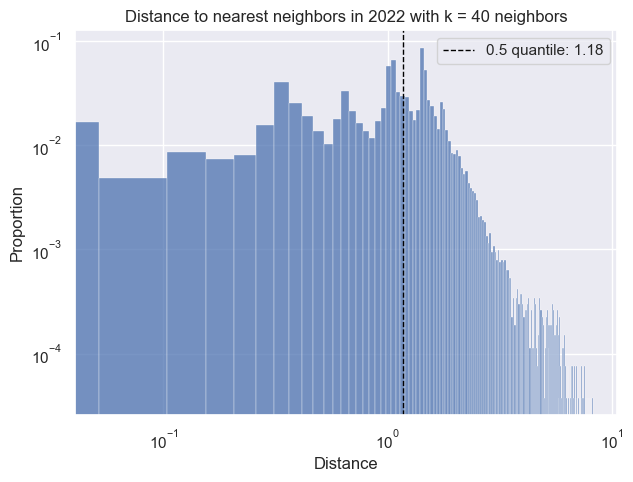

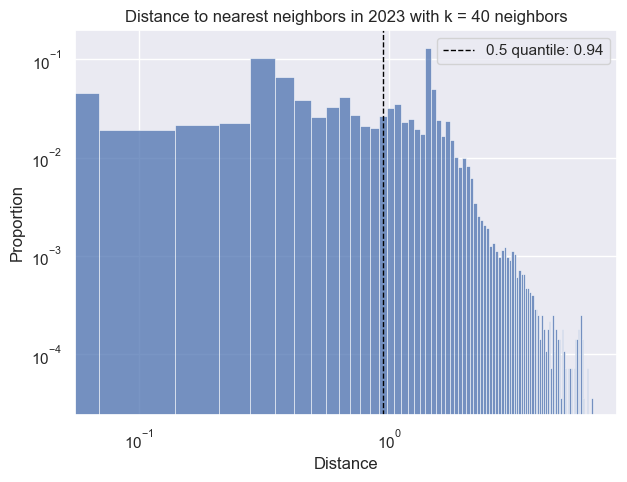

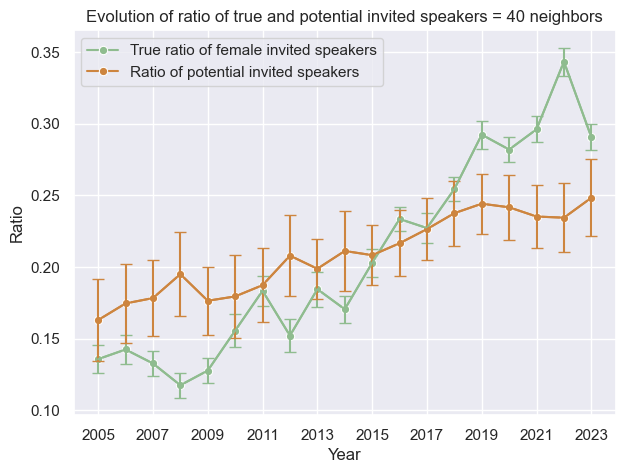

 83%|█████████████████████████████████████▌       | 5/6 [02:29<00:32, 32.87s/it]

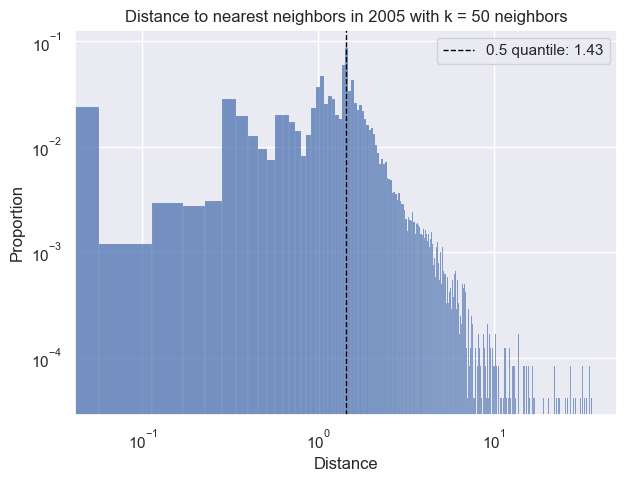

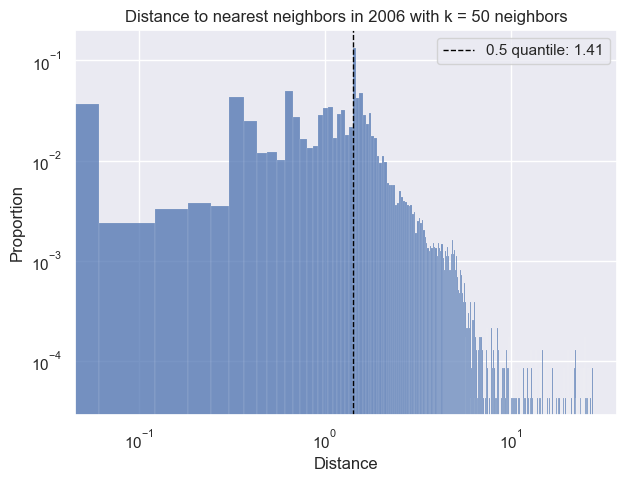

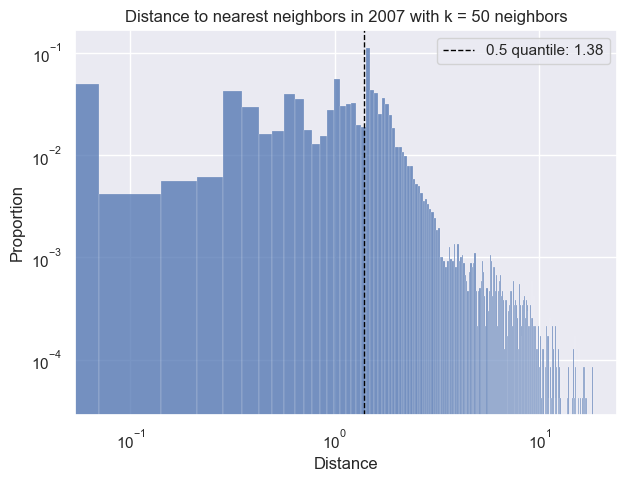

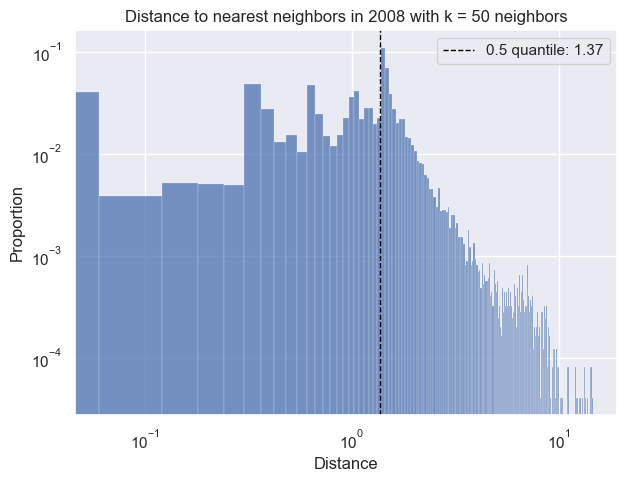

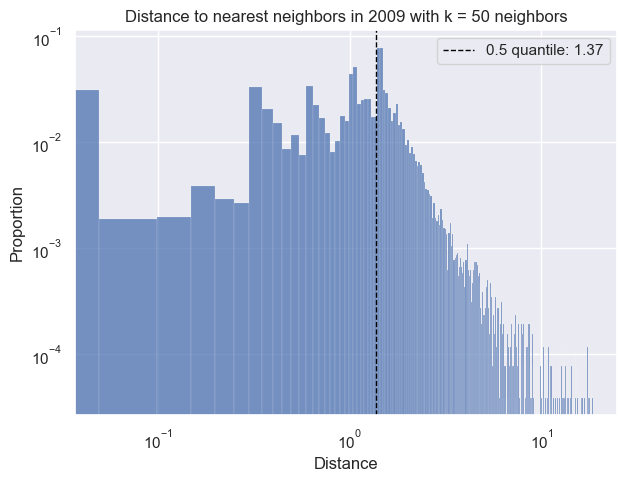

...

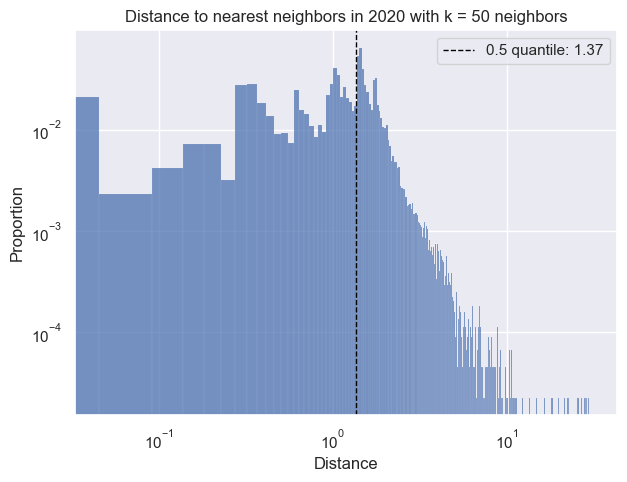

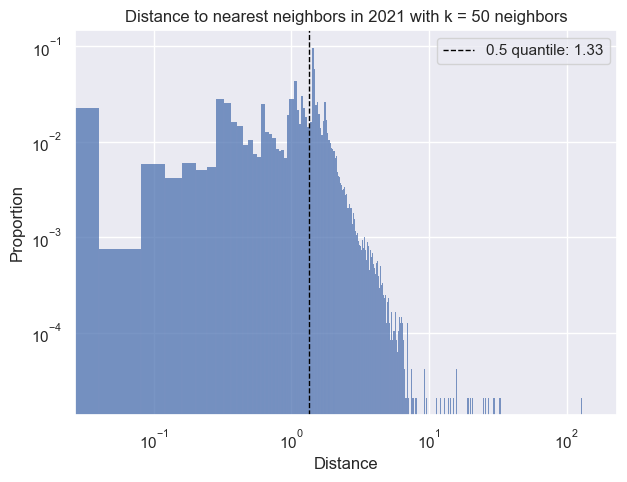

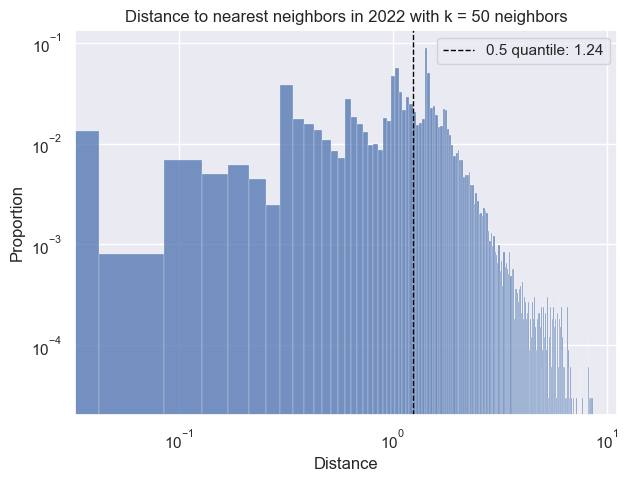

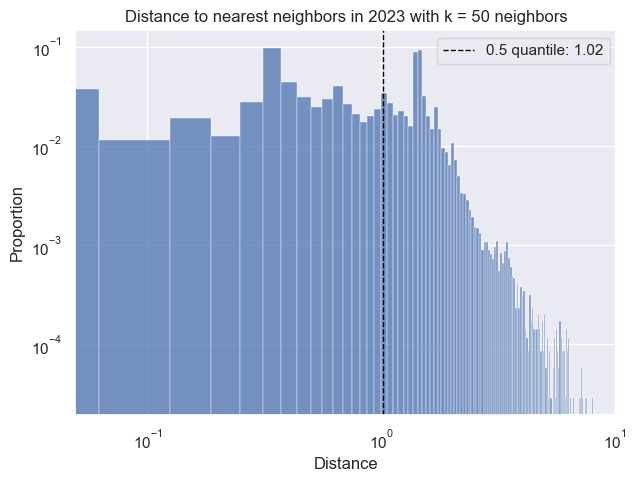

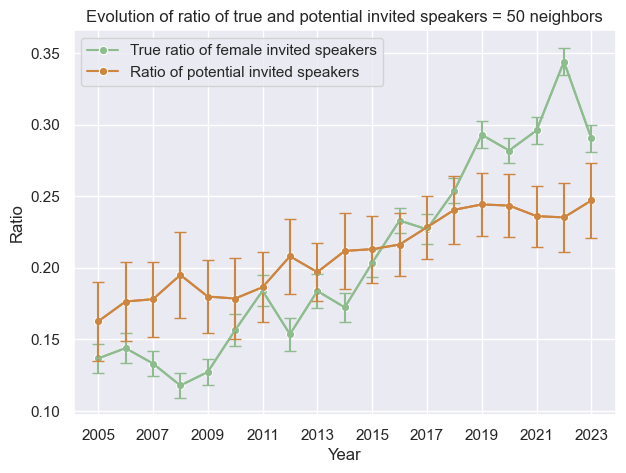

100%|█████████████████████████████████████████████| 6/6 [03:12<00:00, 32.06s/it]


In [253]:
#likelihoodEvolution(oneHot_researchers, ['Seniority', 'CumulativePaperCount', 'Productivity'], allCols, [5, 10, 20, 30, 40, 50], 0.5, 1000, 'Gender',  ['Female', 'Male'])
#likelihoodEvolution(oneHot_researchers, ['Seniority', 'CumulativePaperCount', 'Productivity'], allCols, [5], 0.5, 10, 'Gender',  ['Female', 'Male'], True)
ratio_df = likelihoodEvolutions(oneHot_researchers, allCols, [5, 10, 20, 30, 40, 50], 10, 'SessionType', False)

In [103]:
likelihoodEvolution(oneHot_researchers, ['Seniority', 'CumulativePaperCount', 'Productivity'], allCols, [5, 10, 20, 30, 40, 50], 0.5, 1000, 'SessionType',  ['attendee', 'invited'], False)

TypeError: likelihoodEvolution() missing 1 required positional argument: 'seniorityFilter'

### Filter on seniority

In [25]:
binStart = [-1]
bins = np.arange(5, 35, 5).tolist()
bins.append(float("inf"))
binStart += bins
labels = ['0-5', '6-10', '11-15', '16-20', '21-25', '26-30', '> 30']

seniorityCat_researchers = oneHot_researchers.copy()
seniorityCat_researchers['Seniority_cat'] = pd.cut(oneHot_researchers['Seniority'], bins = binStart, labels = labels)

  0%|                                                     | 0/4 [00:00<?, ?it/s]

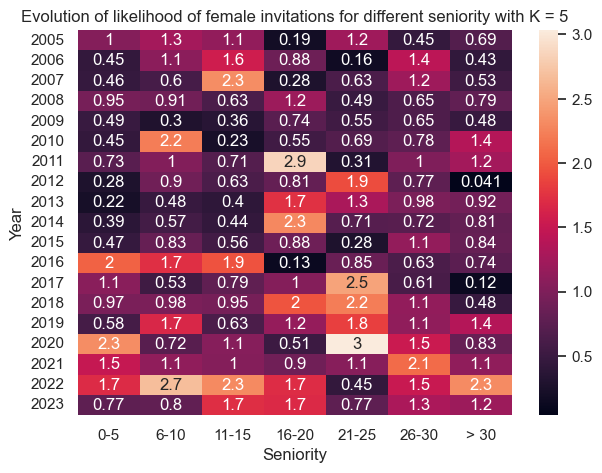

 25%|██████████▎                              | 1/4 [43:38<2:10:56, 2618.69s/it]

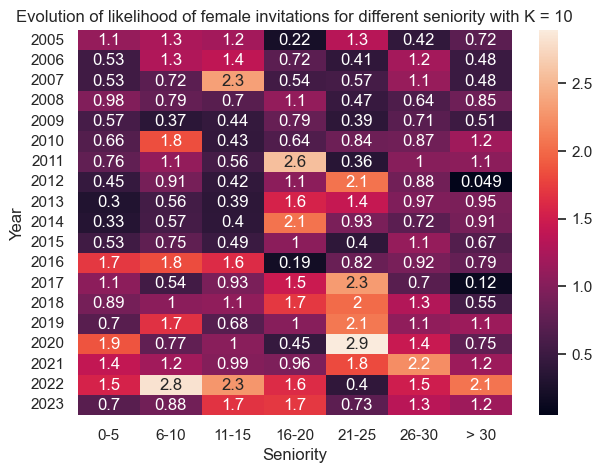

 50%|███████████████████▌                   | 2/4 [1:32:54<1:32:54, 2787.16s/it]

KeyboardInterrupt



In [46]:
#filter on seniority
likelihoodEvolution(seniorityCat_researchers, ['Seniority', 'CumulativePaperCount', 'Productivity'], allCols, [5, 10, 20, 30], 0.5, 1000, 'Gender', ['Female', 'Male'], True, ['_F', '_M'], 'invited')

In [ ]:
#only goes up to K = 30, since one group of seniority only have 36 females in 2005. 

#the reasont that the females with highest seniority is not most likely to be invited, could that be, 
#that it is because those females were invited for another reason?

In [9]:
def plotYearlyDistances(distance, threshold, year, K, feature):
    df = pd.DataFrame(distance.flatten(), columns = ['Distance'])
    
    fig, ax = plt.subplots(1,1)
    sns.histplot(df, x = 'Distance', stat = 'proportion')
    plt.axvline(x = threshold, color = 'black', linewidth = 1, label = '0.5 quantile: ' + str("{:.2f}".format(threshold))).set_linestyle("--")
    plt.legend()
    plt.xscale('log')
    plt.yscale('log')
    plt.title('Distance to five nearest neighbors in ' + str(year) + " with k = " + str(K) + " neighbors")
    plt.savefig('Figures/nearNeighborsDist' + feature + '_' + str(year) + '_' + str(K) + 'neighbors.png', bbox_inches='tight')
    plt.show()

In [10]:
def likelihood(indices, df1, df2, suffixes, sessionType): #df1 is females, df2 is males
    similarResearchers_df = pd.DataFrame(data = df2['SessionType'])
    index_rand = [np.random.choice(i, 1)[0] for i in indices] #randomly select index for each row
    similarResearchers_df['SimilarFemaleIndex'] = index_rand #create column with the random similar female indices
    similarResearchers_df = similarResearchers_df.dropna(subset = 'SimilarFemaleIndex') #drop rows where the researchers are not similar enough
    #similarIndex = similarResearchers.SimilarFemaleIndex
    similarFemales = df1.iloc[similarResearchers_df.SimilarFemaleIndex][['SessionType']] #the random selected similar females
    similarResearchers = pd.merge(similarResearchers_df, similarFemales, left_on = 'SimilarFemaleIndex', right_on = similarFemales.index, how = 'inner', suffixes=(suffixes[1], suffixes[0]))
    
    #calculate likelihood
    group2 = similarResearchers['SessionType' + suffixes[1]].value_counts(normalize = True).loc['invited']
    group1 = similarResearchers['SessionType' + suffixes[2]].value_counts(normalize = True).loc['invited']
    
    likelihood_n = group2/group1
    
    return likelihood_n

In [34]:
def RelativeLikelihood_stats(df): #calculate average relative likelihood per year
    likelihood_dict = {}
    yearList = np.sort(df.Year.unique())
    for y in yearList:
        avg_likelihood = df[df.Year == y].Likelihood.mean()
        std_likelihood = df[df.Year == y].Likelihood.std()
        likelihood_dict[y] = {'Avg_likelihood': avg_likelihood, 'Std_likelihood': std_likelihood}
    return likelihood_dict

In [35]:
def plotLikelihood(df, k, title):
    years = df.index.tolist()
    
    fix, ax = plt.subplots(1,1)
    sns.lineplot(data = df, x = df.index, y = 'Avg_likelihood', marker = 'o', color = 'red')
    plt.axhline(1, color = 'black', linewidth = 1, label = "Line indicating equality").set_linestyle("--")
    plt.errorbar(x = df.index, y = df.Avg_likelihood, yerr = df.Std_likelihood, color = 'red', capsize = 4)
    plt.legend()
    plt.xticks(np.arange(min(years), max(years)+1, 2.0))
    plt.xlabel('Year')
    plt.ylabel('Likelihood of female invitation')
    plt.title(title + str(k))
    plt.savefig("Figures/femaleLikelihood" + str(k) + "Neighbors.png", bbox_inches='tight')
    plt.show()

In [36]:
KNN(df, groupFeature, groups, year, allFeatures, oneHotFeatures_n, standardizeFeatures_n, K, q)
groupFeature = 'Gender'
groups = ['Female', 'Male']

likelihood(indices, df1, df2, ['_F', '_M'])

plotLikelihood(df, k, 'Evolution of average likelihood of female invited speakers with K = ')

NameError: name 'df' is not defined

In [37]:
def likelihoodEvolution(df, standardizeFeatures, allFeatures, K, q, N, groupFeature, groups): #calculate likelihood of females being invited as speakers over the years
    likelihood_dict = {}
    index = 0
    researchers = df.copy()
    n_oneHotFeatures = len(allFeatures) - len(standardizeFeatures) #number of features from one-hot encoding
    standardizeFeatures_n = len(standardizeFeatures)
    
    for c in standardizeFeatures:
        researchers[c] = standardizeColumn(researchers, c) #standardize data
    
    for k in tqdm(K):
        yearList = np.sort(researchers.Year.unique())
        #for y in tqdm(yearList):
        for y in yearList:
            year_df = researchers[researchers.Year == y] #get all data from year y
            #indices, females, males = KNN(year_df, y, allFeatures, n_oneHotFeatures, standardizeFeatures_n, k, q)
            indices, group1, group2 = KNN(df, groupFeature, groups, y, allFeatures, n_oneHotFeatures, standardizeFeatures_n, K, q)
            
            #calculate likelihood
            for n in range(0,N):
                lh = likelihood(indices, females, males)
                likelihood_dict[index] = {'Year': y, 'Iteration': n, 'Likelihood': lh}
                index += 1
    
#    likelihood = KNN(df, standardizeFeatures, groupFeature, groups, allFeatures, K, q)
            
        likelihood_df = pd.DataFrame.from_dict(likelihood_dict, orient='index') #create df with likelihood
        likelihood_stats = RelativeLikelihood_stats(likelihood_df) #calculate average and standard deviation
        likelihood_stats_df = pd.DataFrame.from_dict(likelihood_stats, orient = 'index') #create df with stats on likelihood
    
        plotLikelihood(likelihood_stats_df, k) #plot likelihood


In [38]:
likelihoodEvolution(oneHot_researchers, ['Seniority', 'CumulativePaperCount', 'Productivity'], allCols, [5, 10, 20, 30, 40, 50], 0.5, 1000, 'Gender',  ['Female', 'Male'])

  0%|                                                     | 0/6 [00:00<?, ?it/s]


TypeError: '<=' not supported between instances of 'list' and 'int'

In [15]:
allCols = known/Units
allCols += ['Seniority', 'CumulativePaperCount', 'Productivity']

  0%|                                                     | 0/6 [00:00<?, ?it/s]

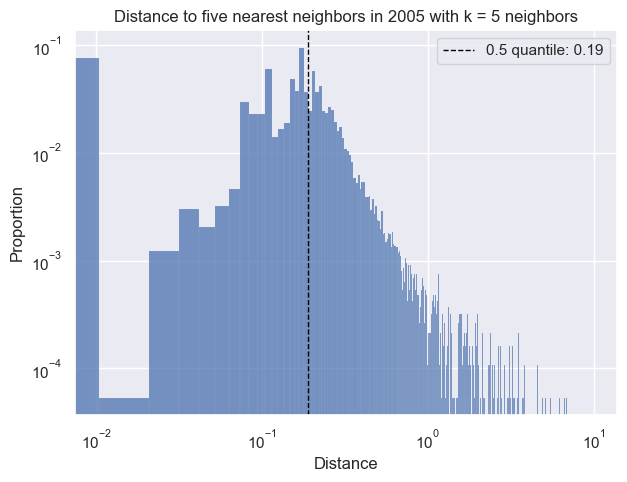

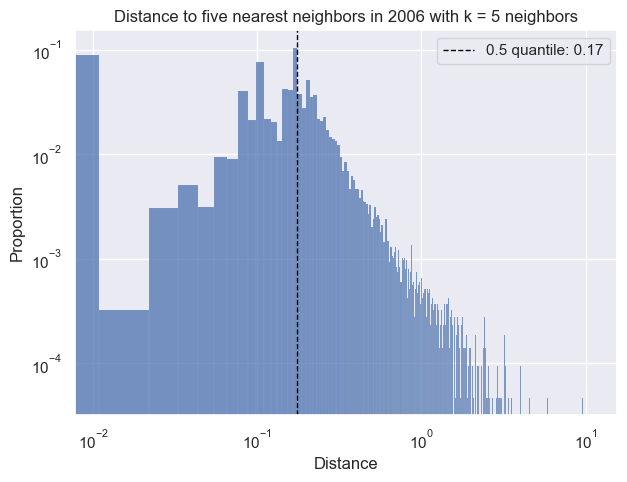

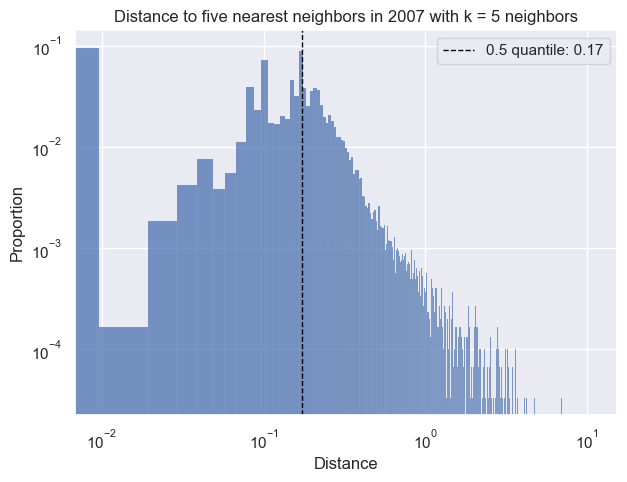

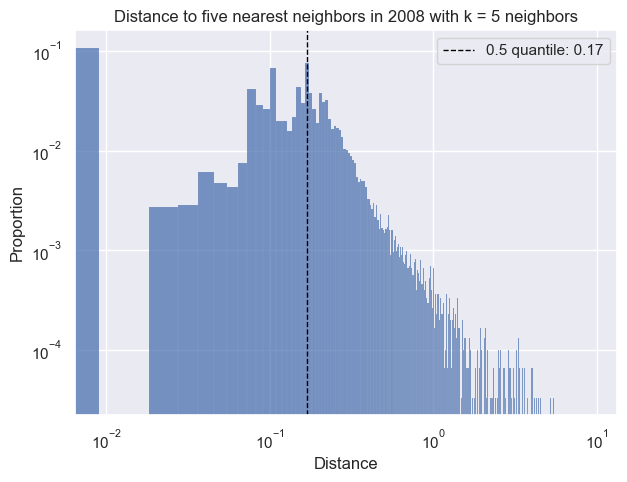

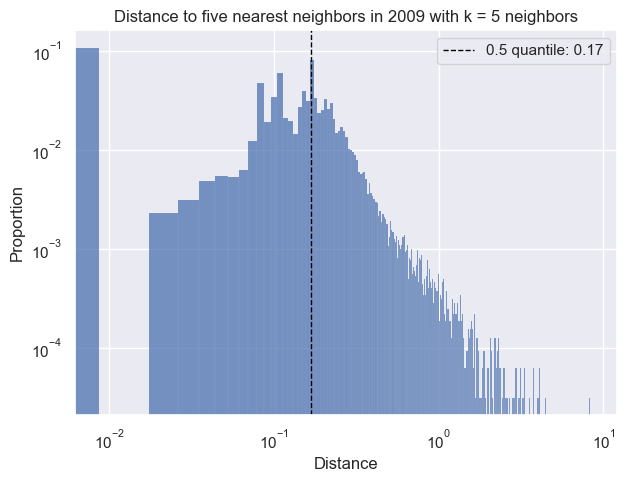

...

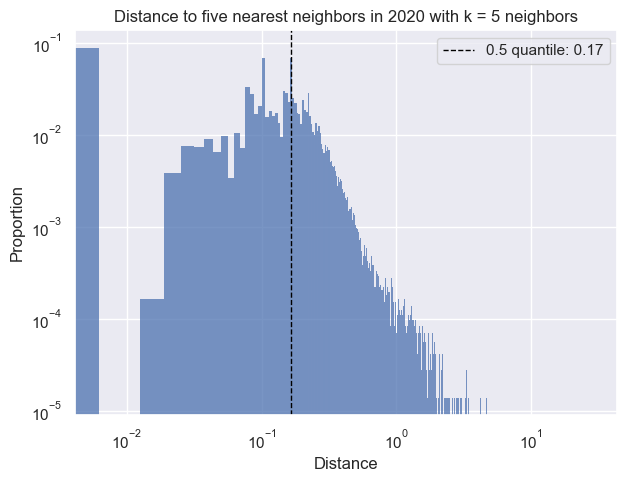

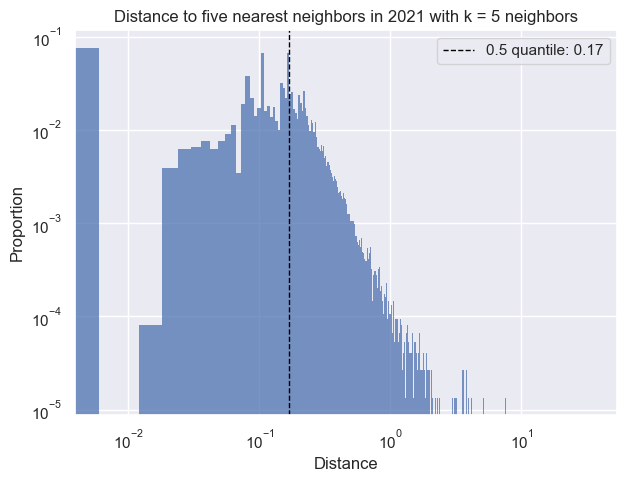

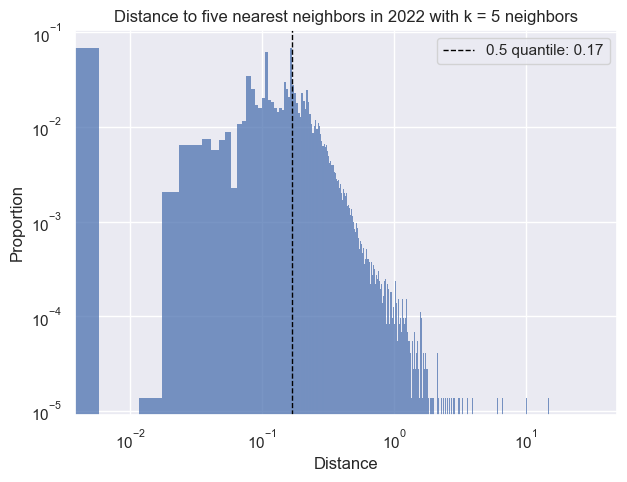

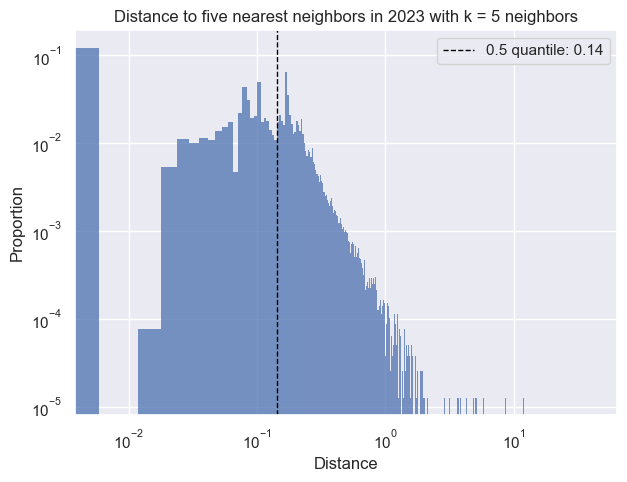

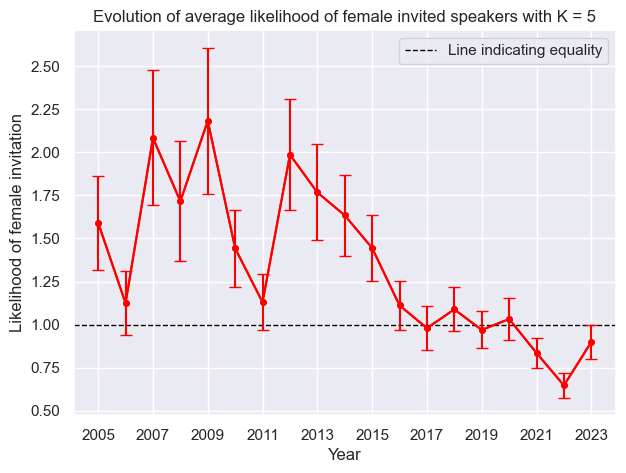

 17%|██████▊                                  | 1/6 [33:26<2:47:10, 2006.04s/it]

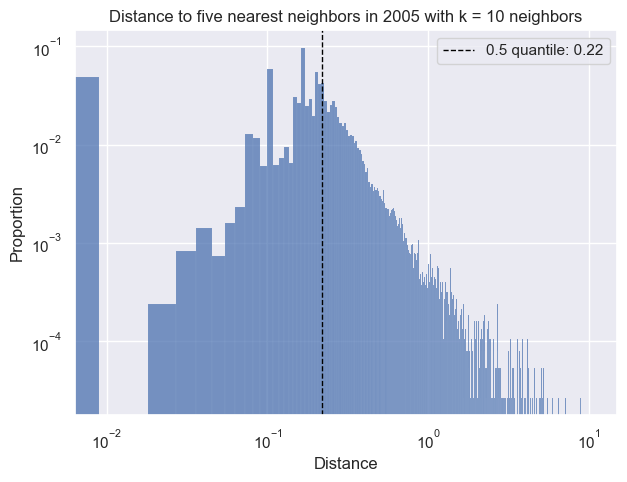

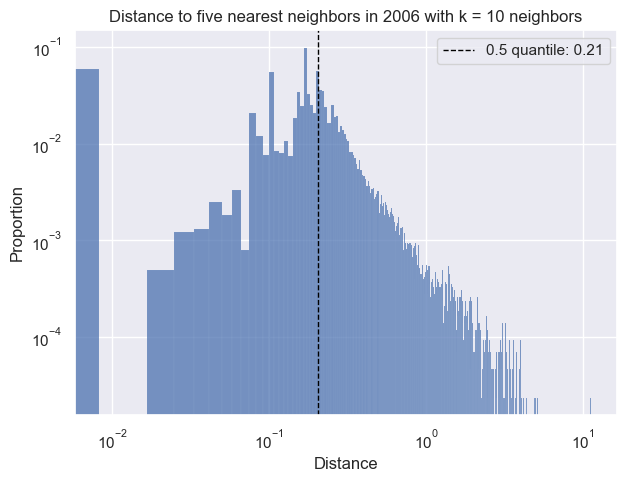

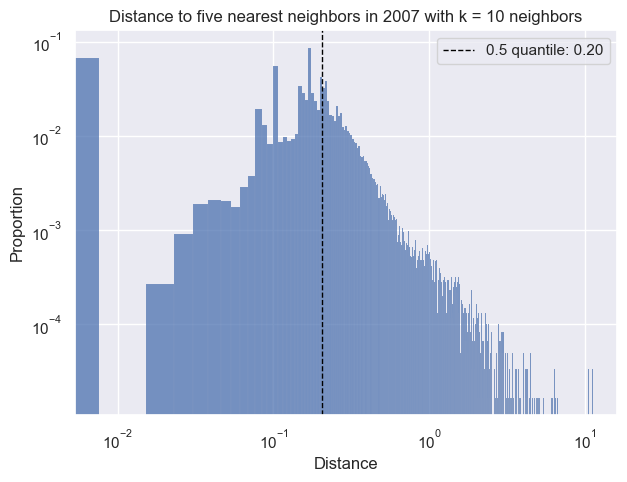

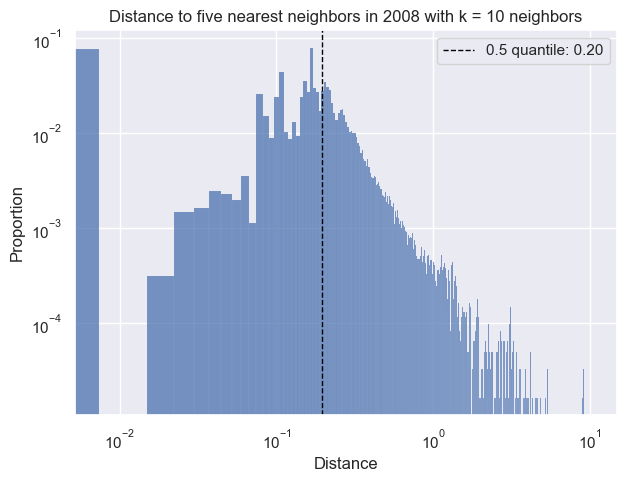

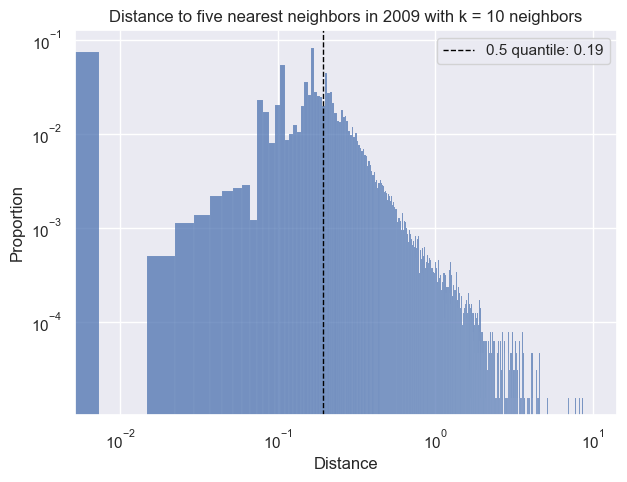

...

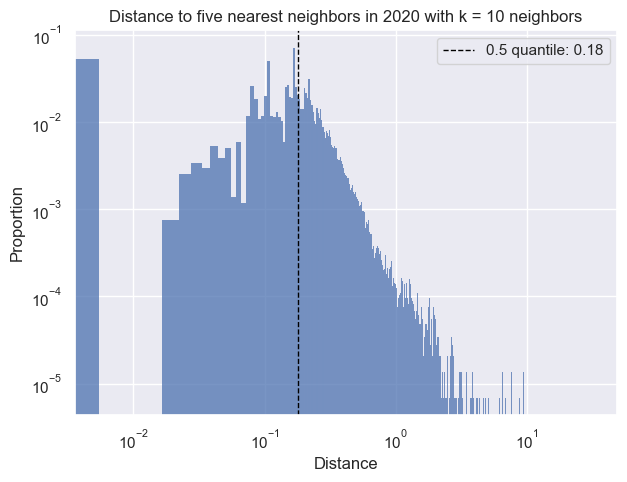

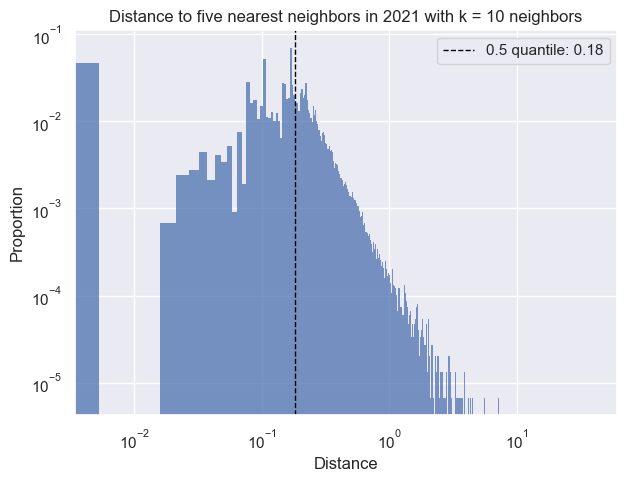

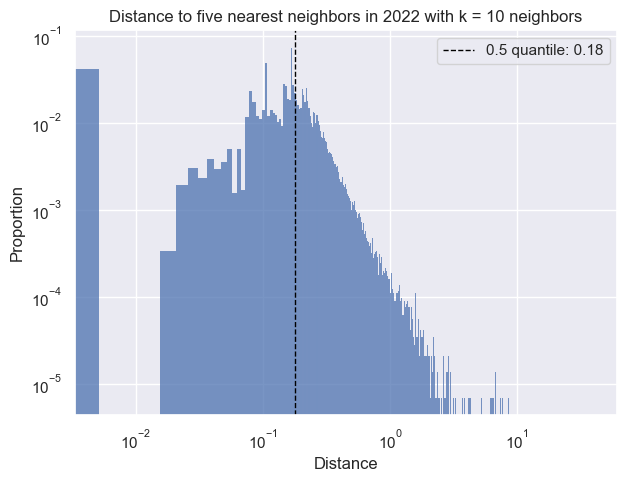

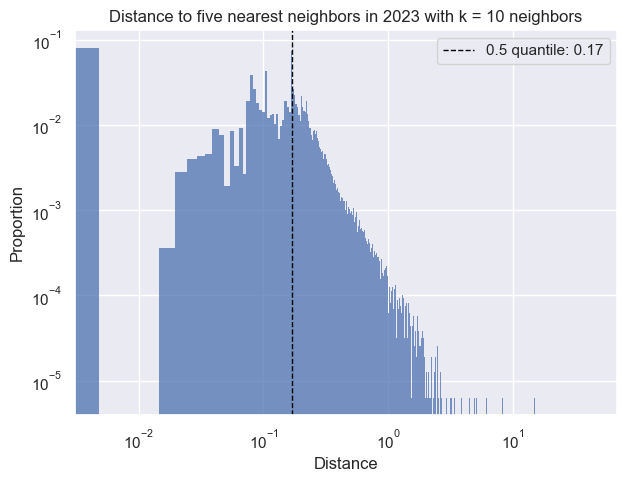

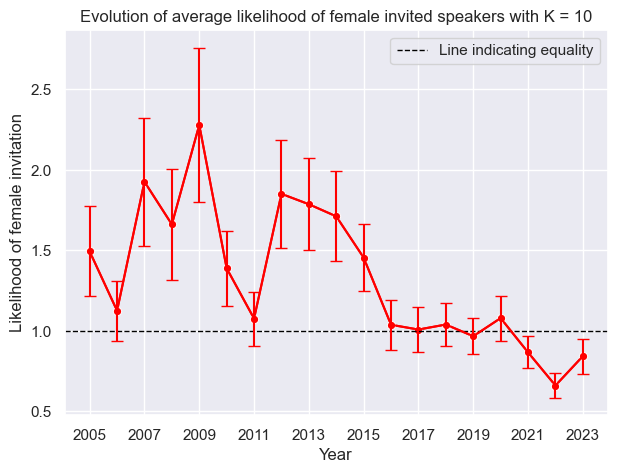

 33%|█████████████                          | 2/6 [1:37:22<3:25:30, 3082.52s/it]

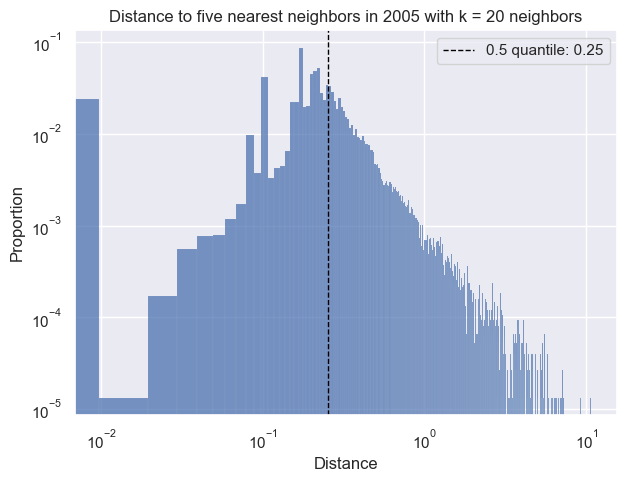

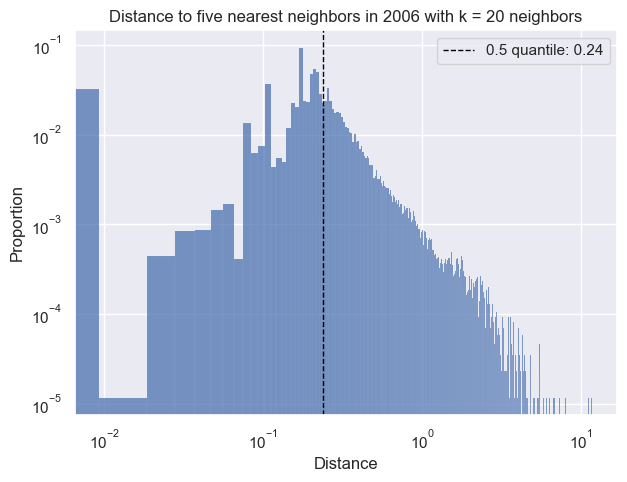

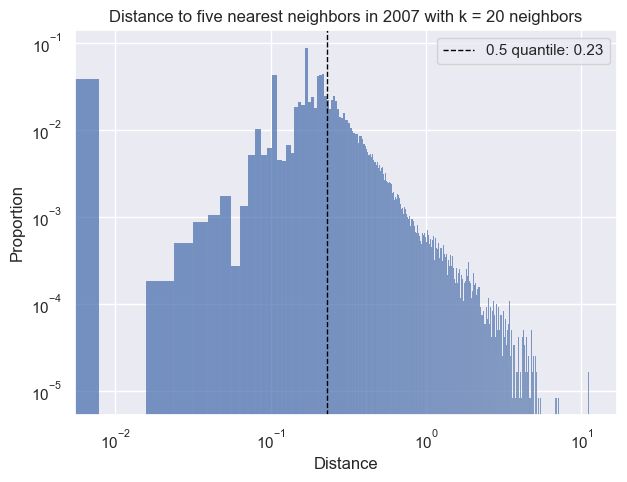

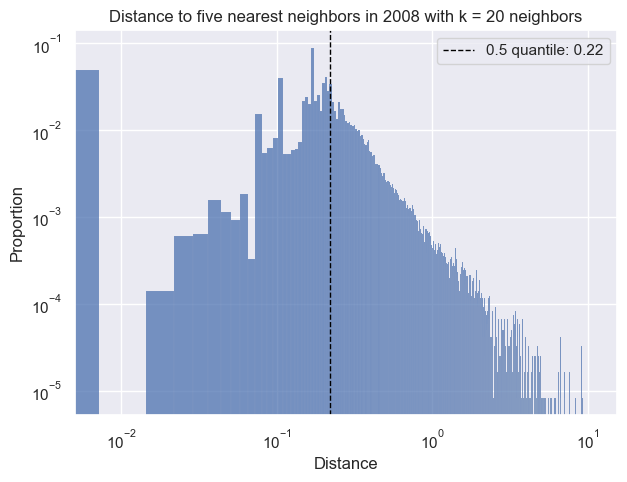

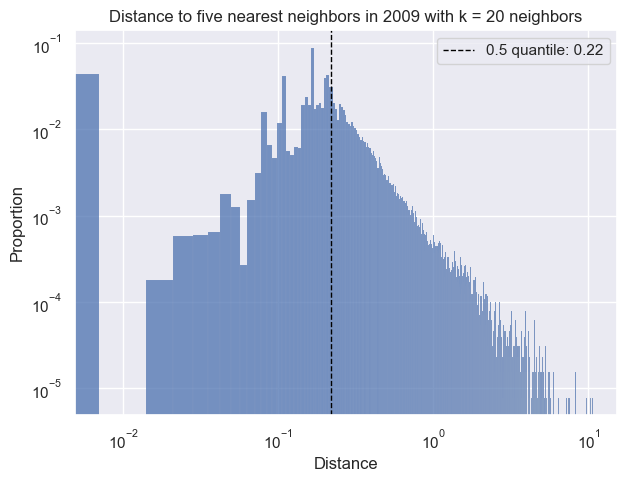

...

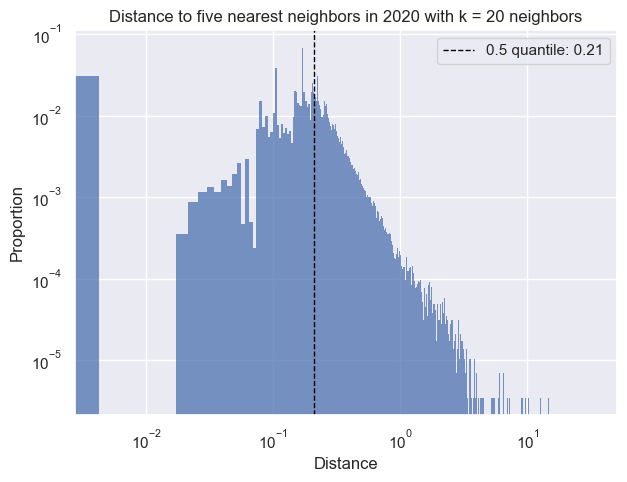

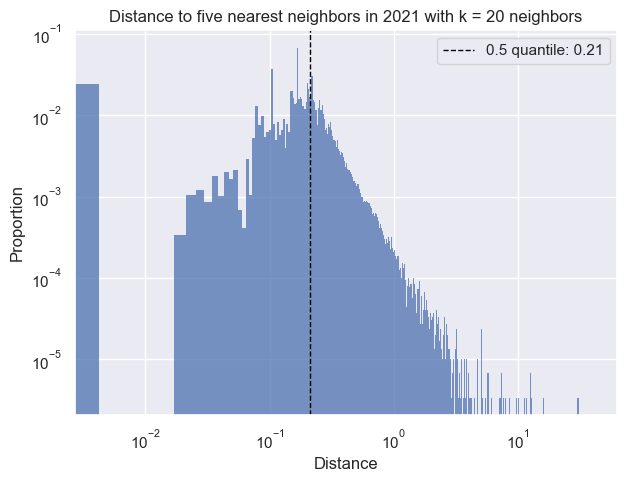

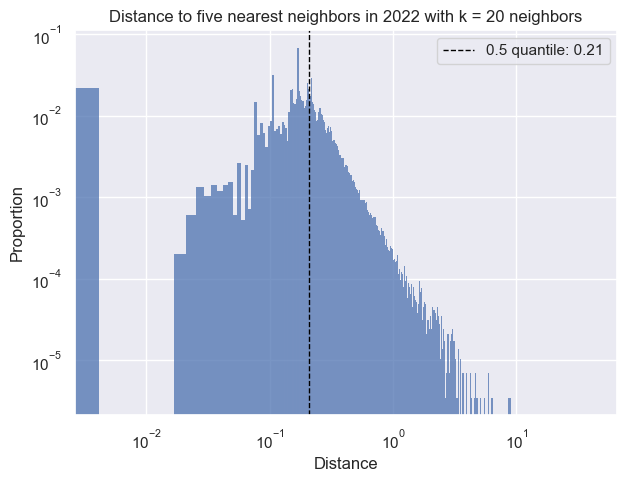

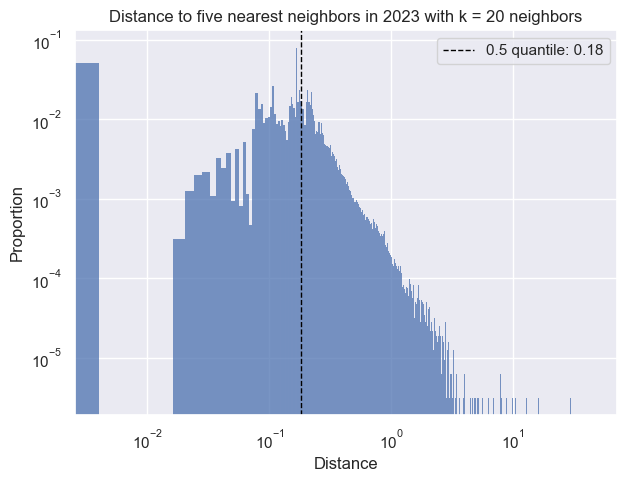

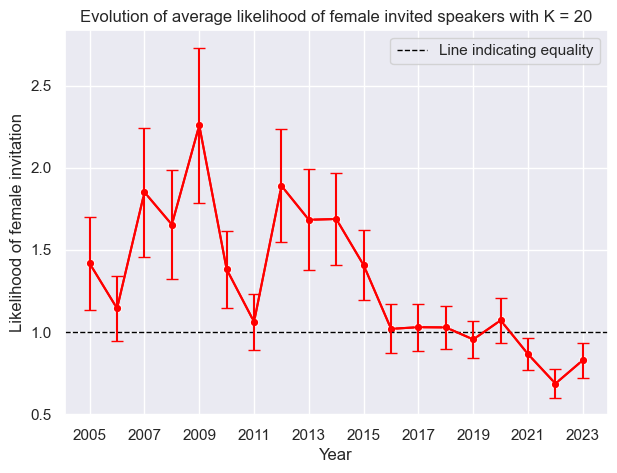

 50%|███████████████████▌                   | 3/6 [2:11:51<2:10:59, 2619.93s/it]

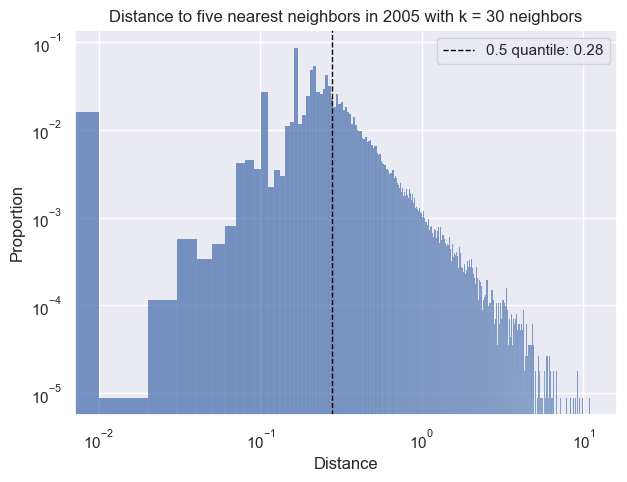

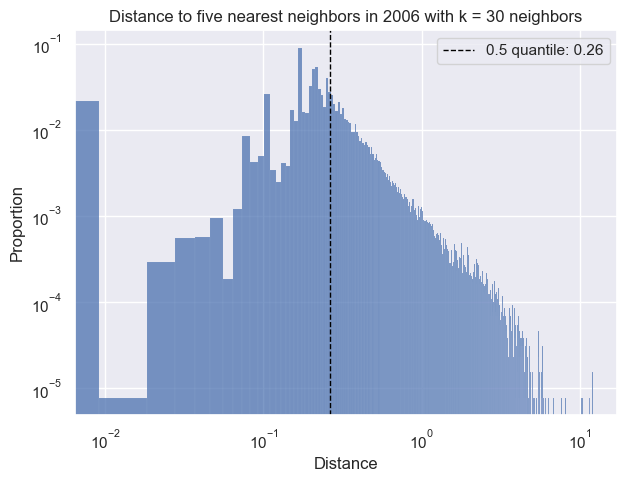

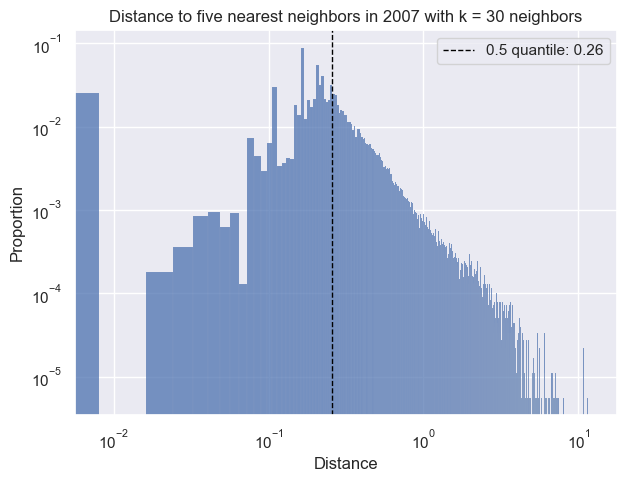

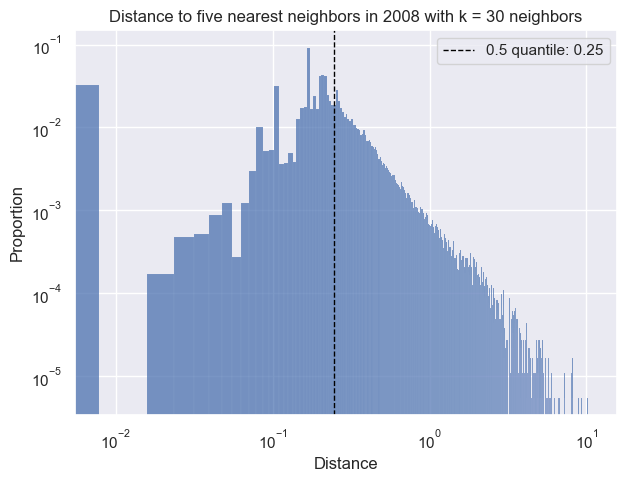

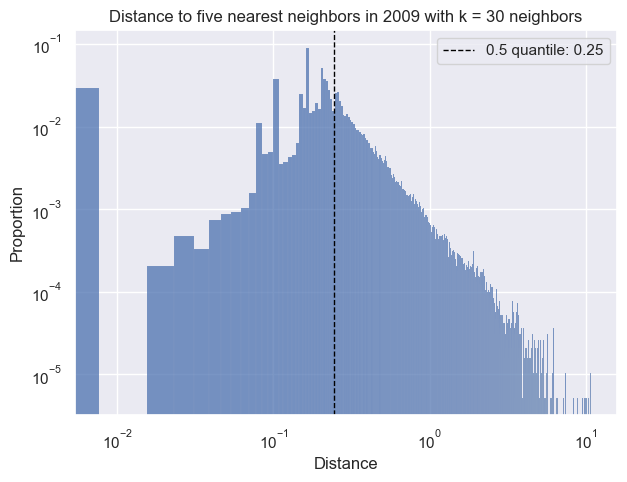

...

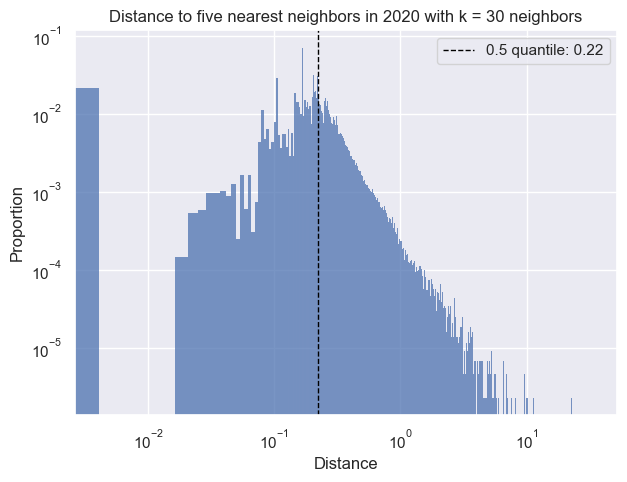

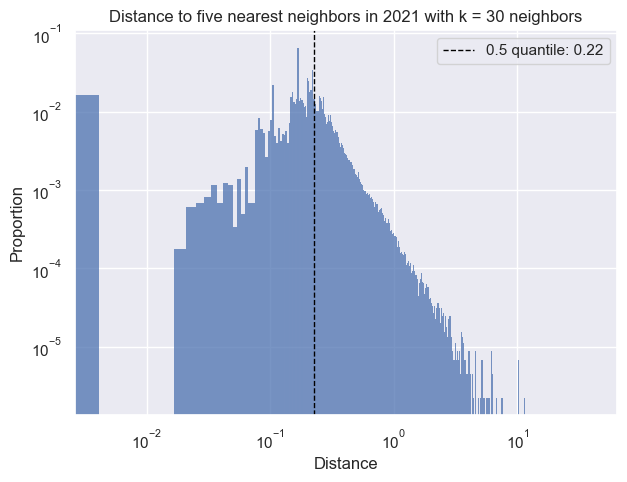

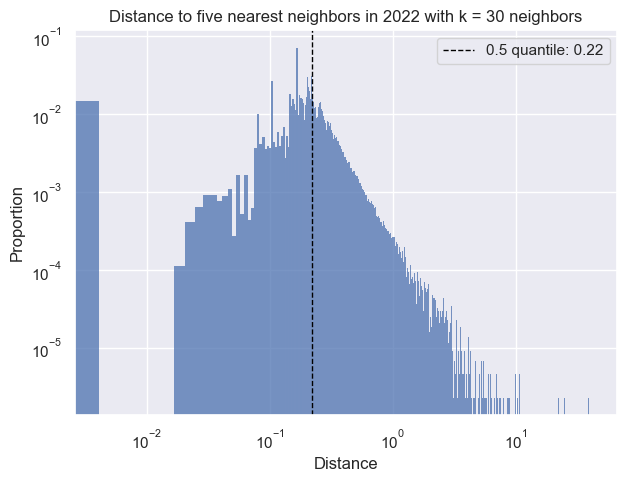

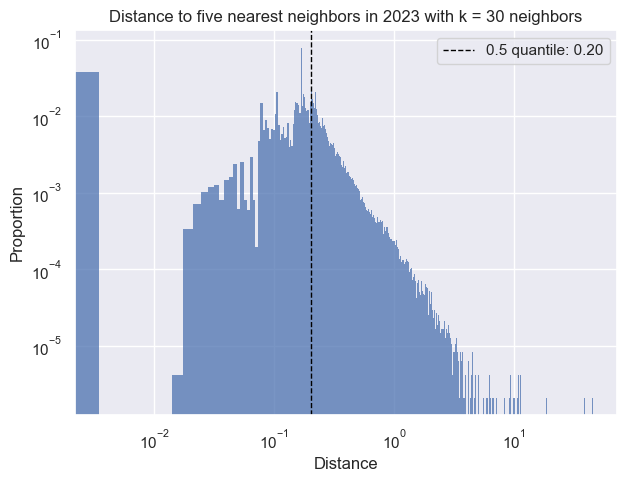

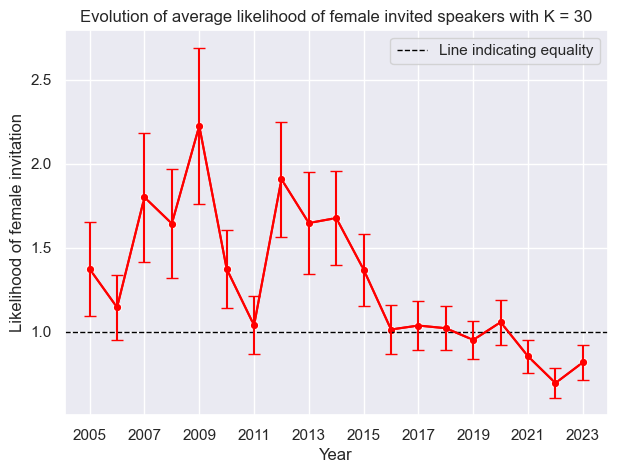

 67%|██████████████████████████             | 4/6 [2:46:42<1:20:22, 2411.20s/it]

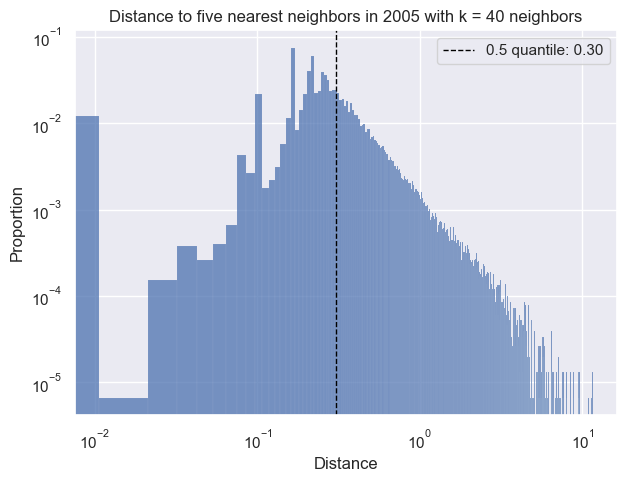

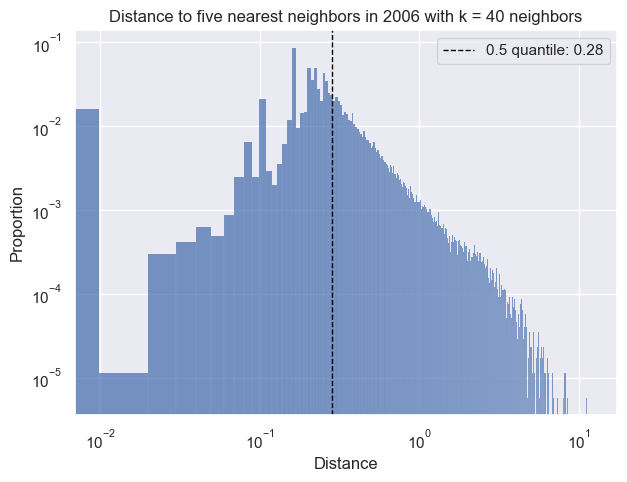

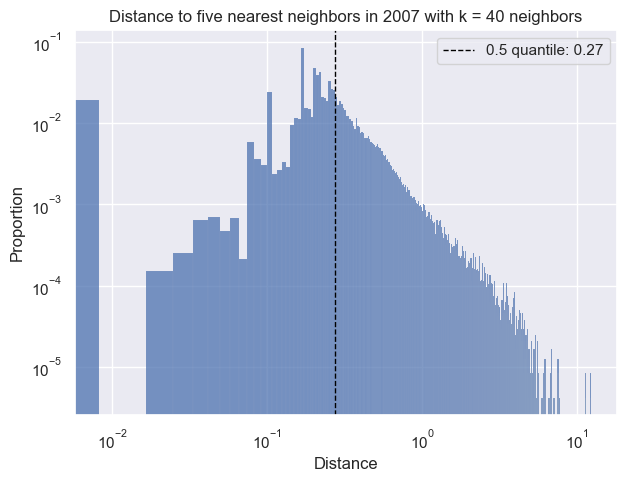

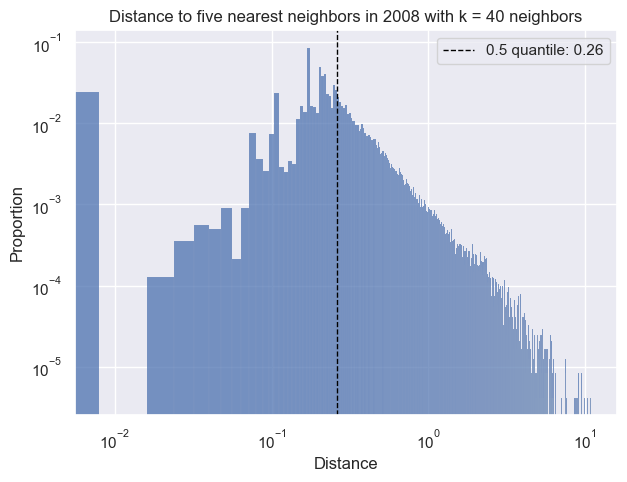

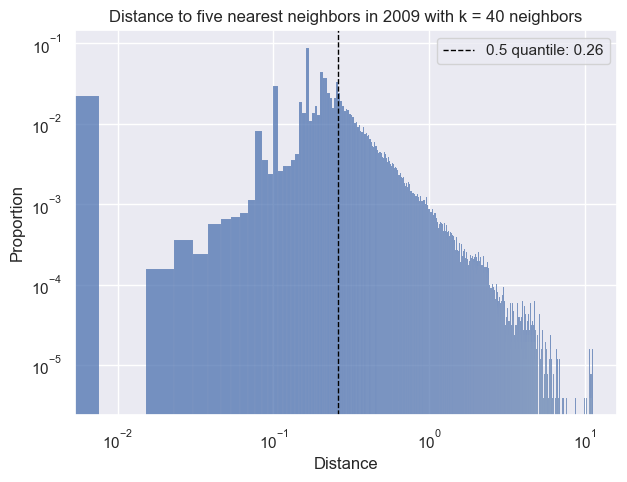

...

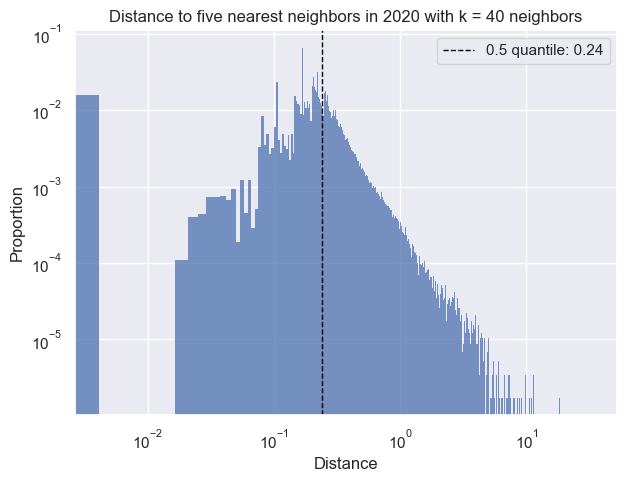

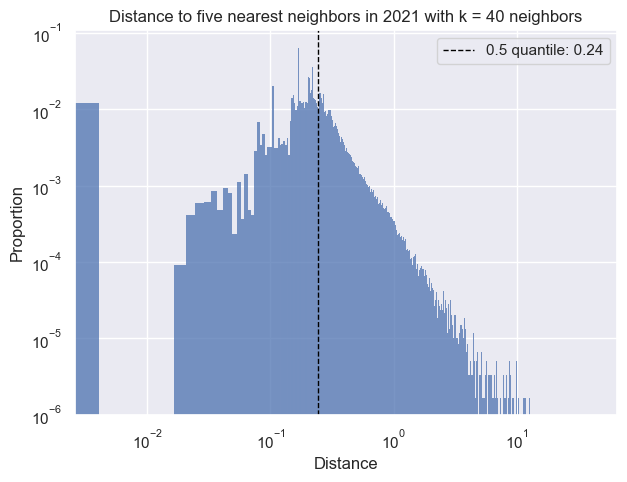

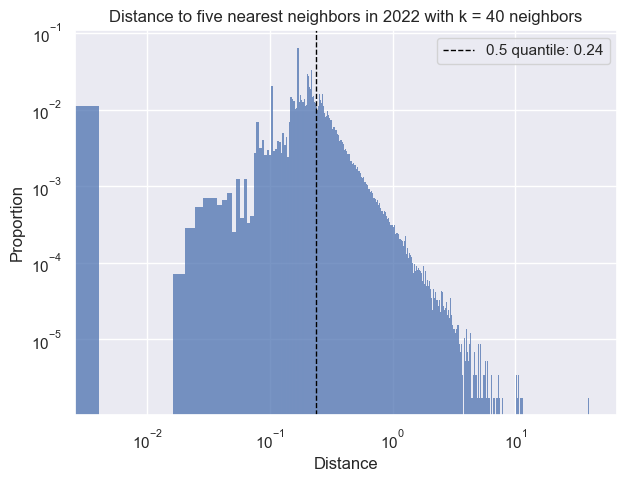

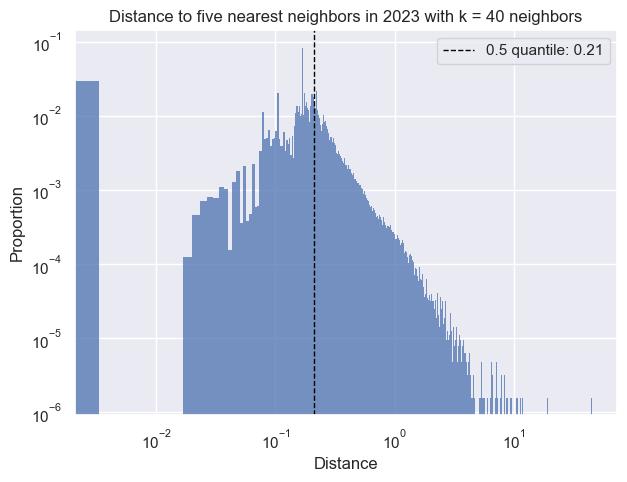

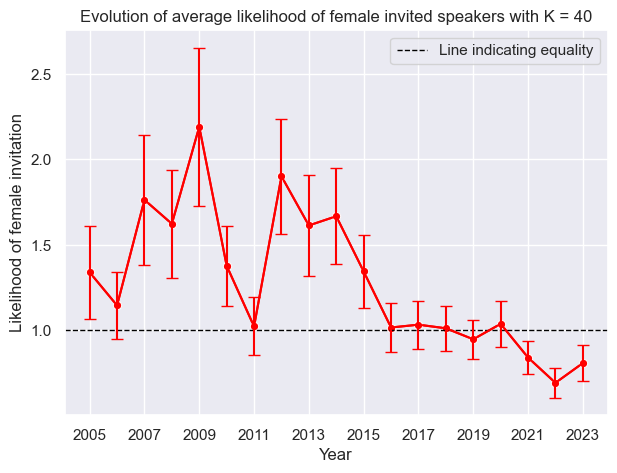

 83%|██████████████████████████████████▏      | 5/6 [3:21:51<38:22, 2302.24s/it]

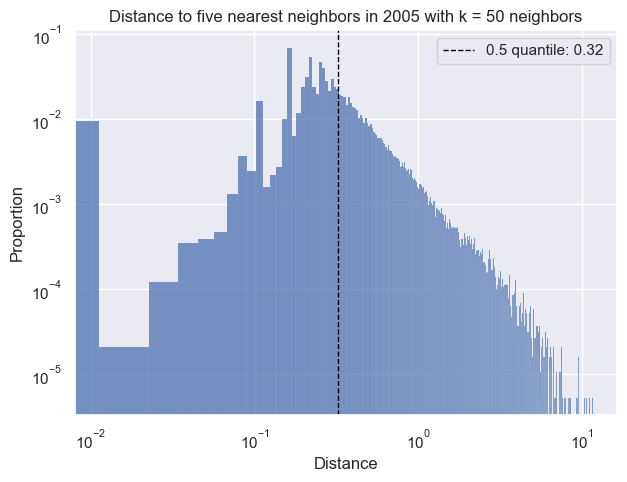

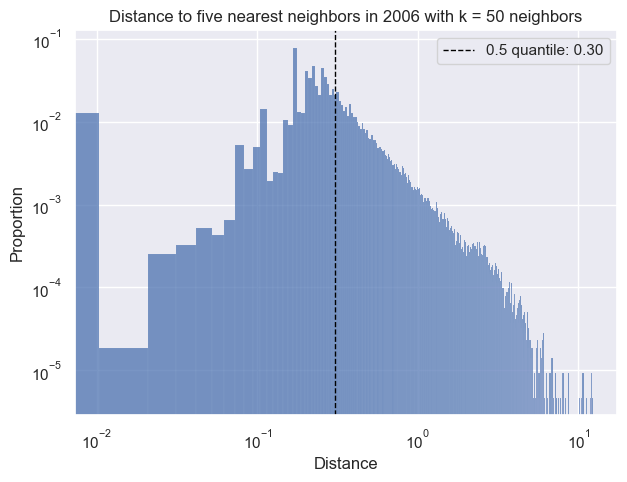

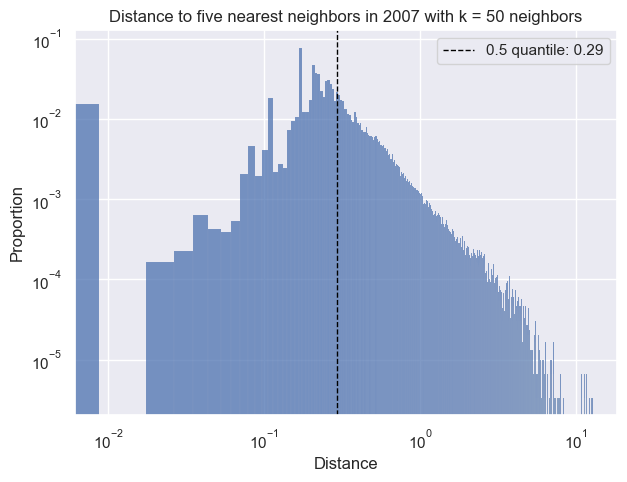

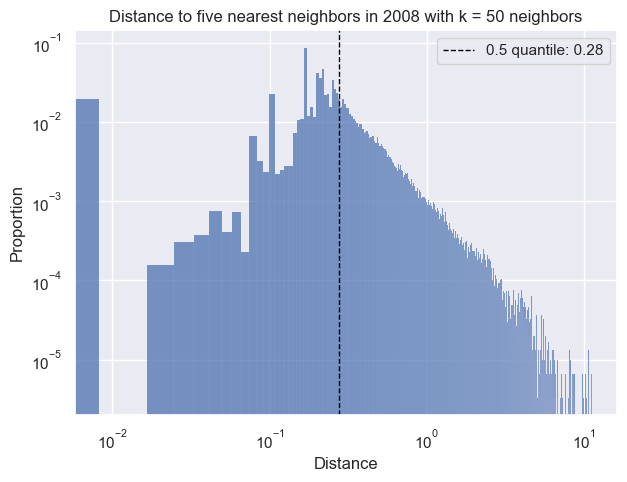

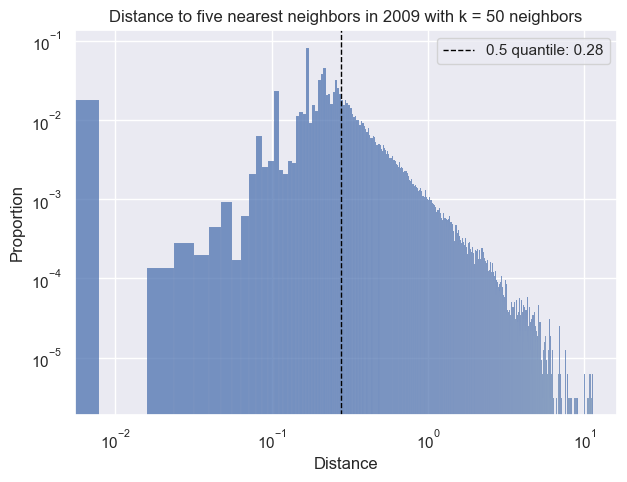

...

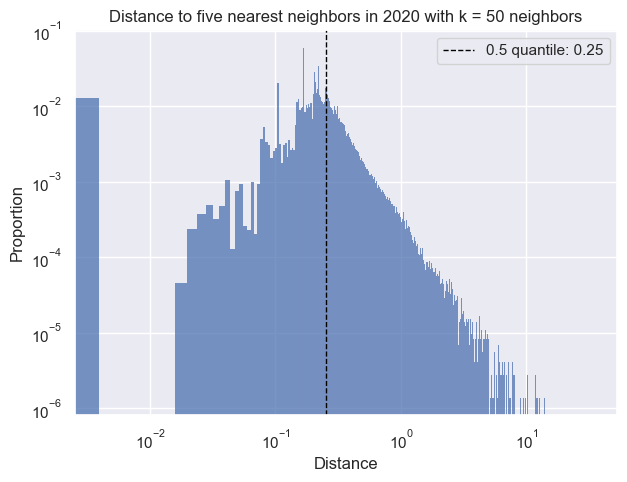

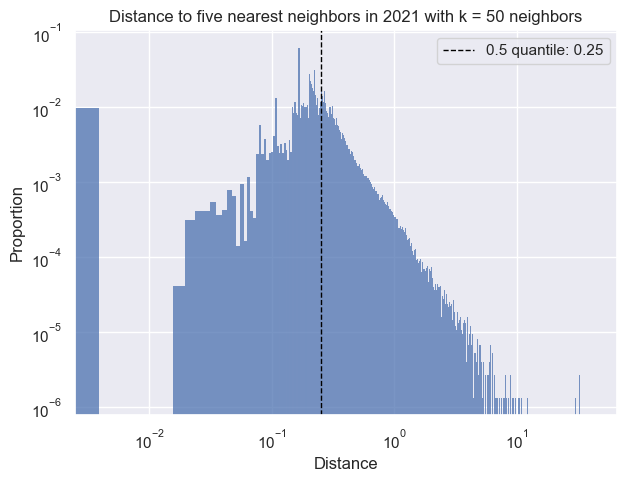

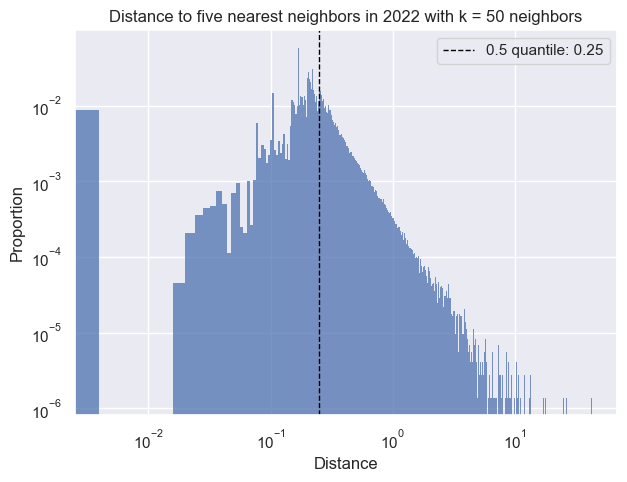

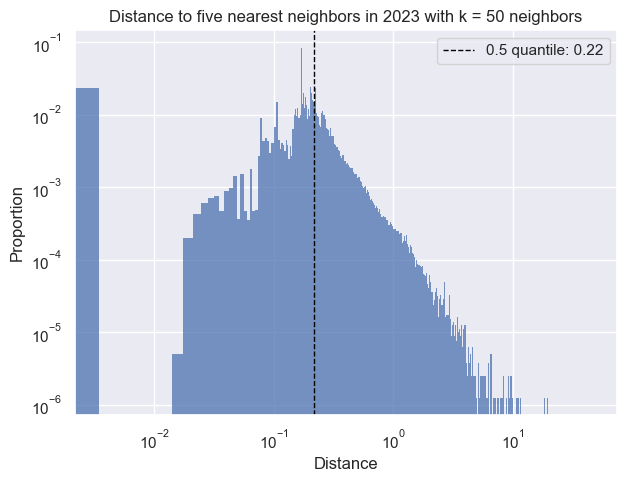

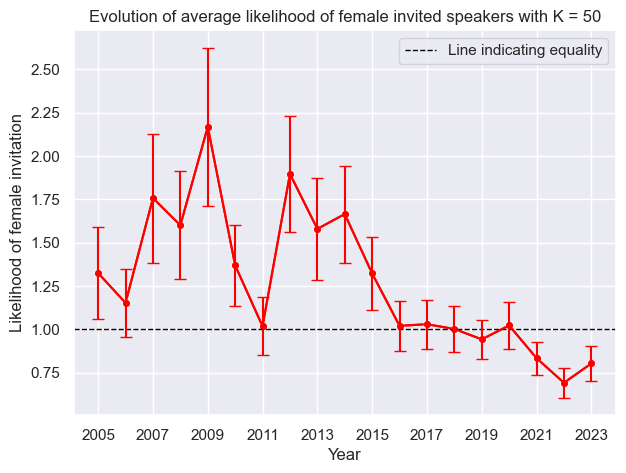

100%|█████████████████████████████████████████| 6/6 [3:57:21<00:00, 2373.58s/it]


In [16]:
likelihoodEvolution(oneHot_researchers, ['Seniority', 'CumulativePaperCount', 'Productivity'], allCols, [5, 10, 20, 30, 40, 50], 0.5, 1000)

#### Algorithm for calcualting likelihoods of females being invited
1. For each male, random select a female of the k similar females
2. Check session type of male and random female
3. Calculate ratio of invited females and ratio of invited males
4. Divide these 2 numbers, which give the relative likelihood of females being invited
5. Repeat step 1-4 *n* times
6. Calculate average and standard deviation of the *n* relative likelihoods (for later plots)
7. Repeat step 1-6 for each year
8. Females are more likely than males to be invited if the results are above 1, and males are more likely than females to be invited if the results are lower than 1. 

In [17]:
#try do do functions such that they work with male/female and invited/attendees
#one function at a time(and restart constantly)

  0%|                                                    | 0/19 [00:00<?, ?it/s]

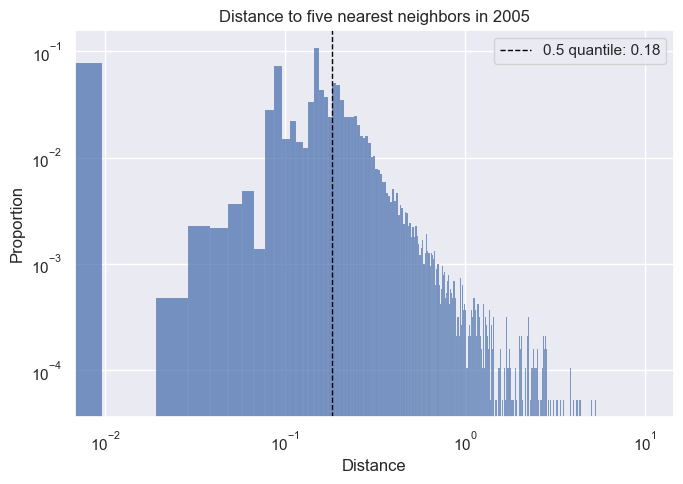

  5%|██▎                                         | 1/19 [00:40<12:14, 40.79s/it]

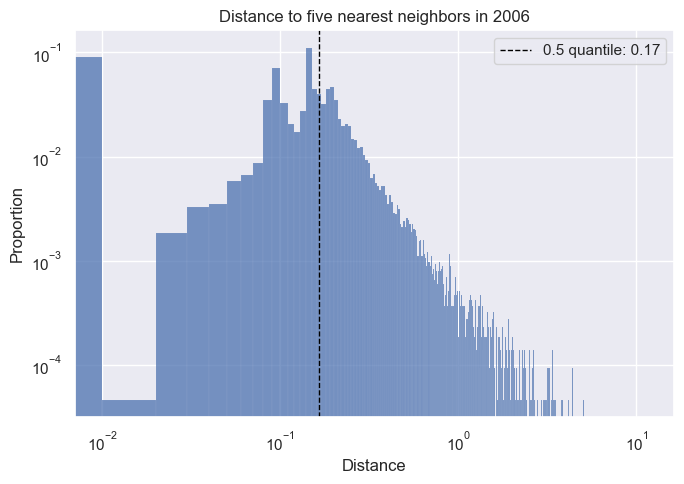

 11%|████▋                                       | 2/19 [01:25<12:16, 43.31s/it]

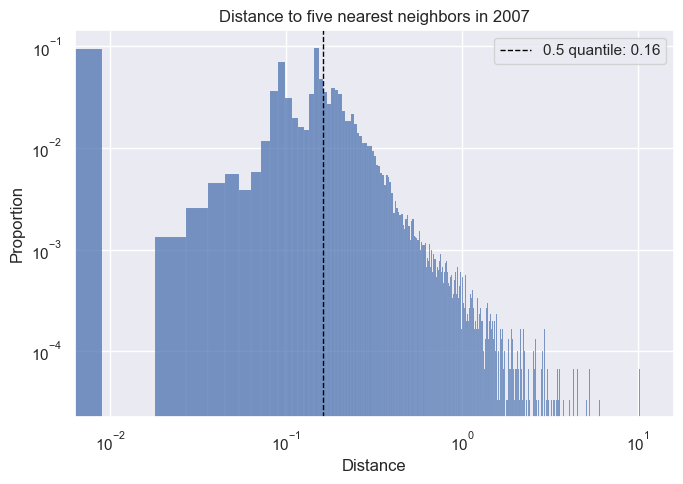

 16%|██████▉                                     | 3/19 [02:26<13:36, 51.03s/it]

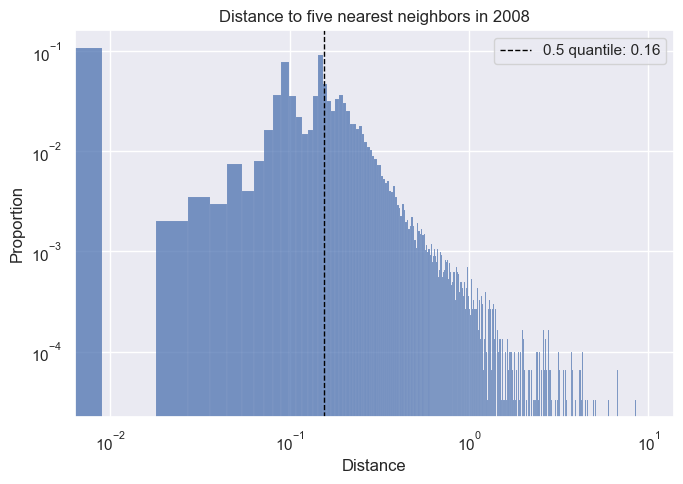

 21%|█████████▎                                  | 4/19 [03:26<13:42, 54.83s/it]

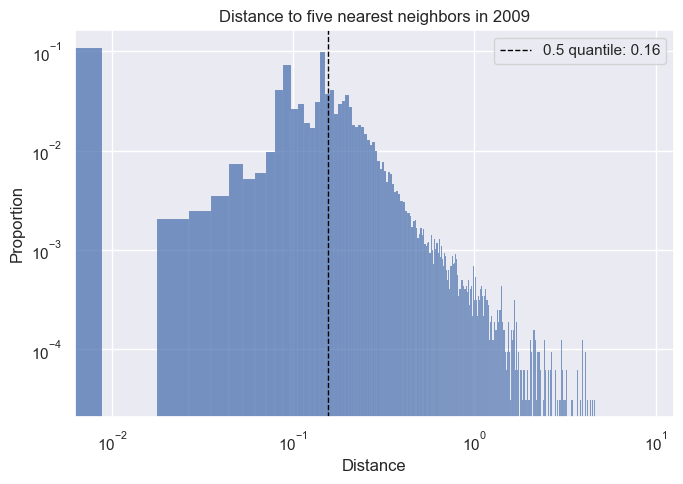

 26%|███████████▌                                | 5/19 [04:30<13:32, 58.01s/it]

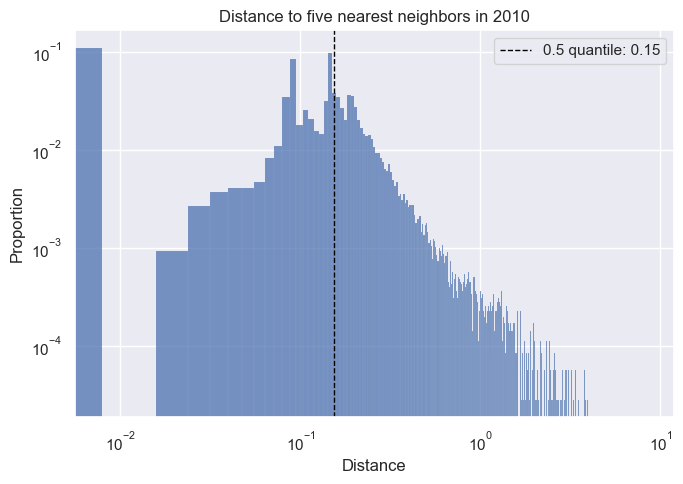

 32%|█████████████▉                              | 6/19 [05:40<13:27, 62.14s/it]

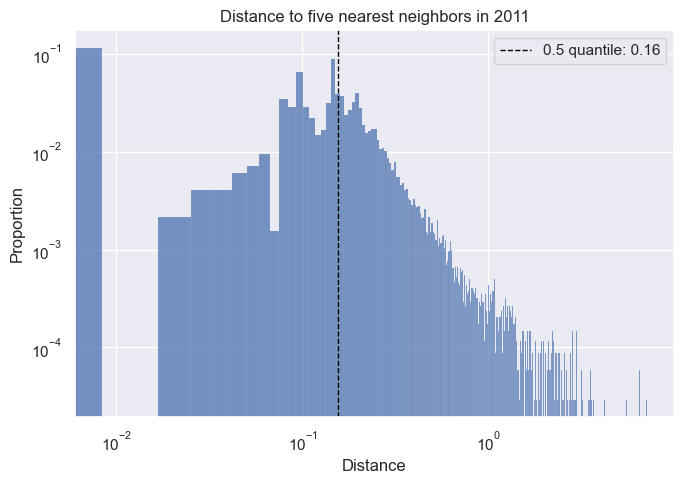

 37%|████████████████▏                           | 7/19 [06:48<12:49, 64.14s/it]

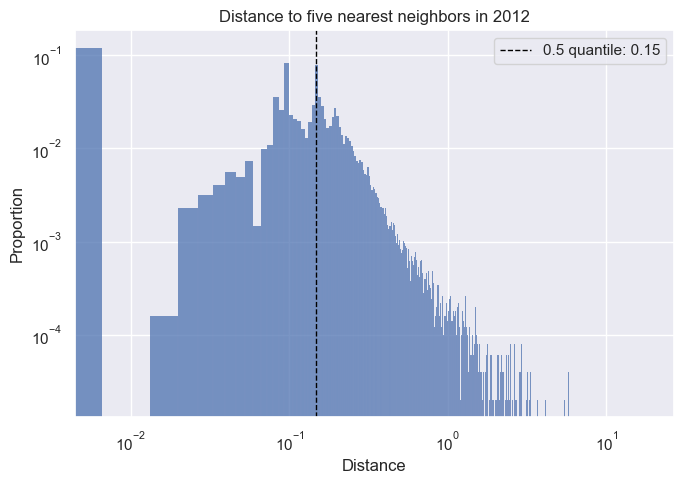

 42%|██████████████████▌                         | 8/19 [08:31<13:59, 76.36s/it]

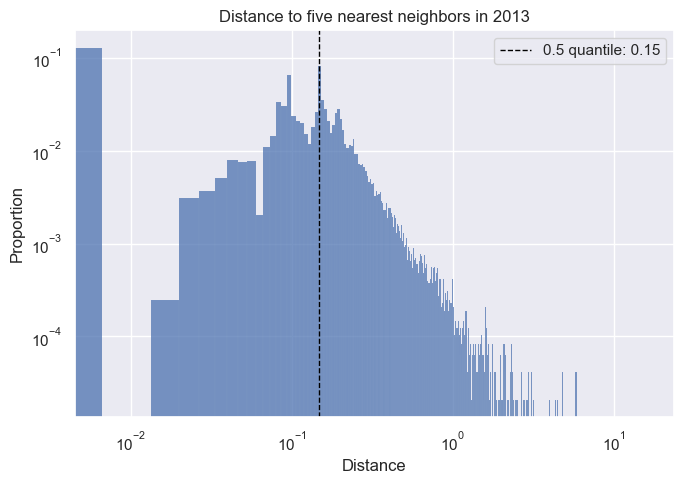

 47%|████████████████████▊                       | 9/19 [10:09<13:50, 83.09s/it]

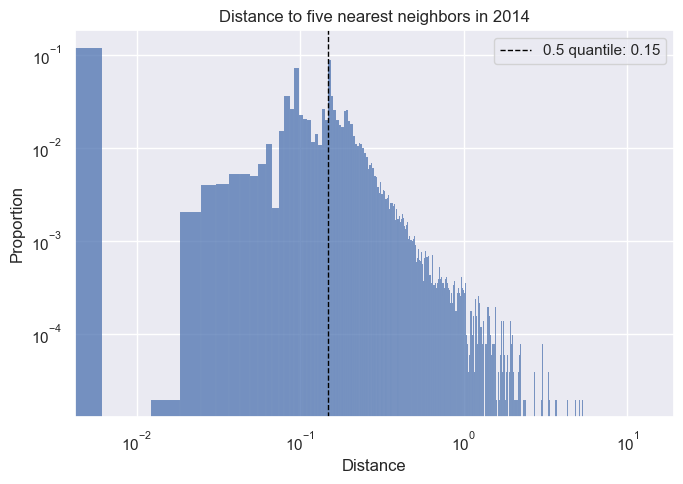

 53%|██████████████████████▋                    | 10/19 [11:51<13:22, 89.12s/it]

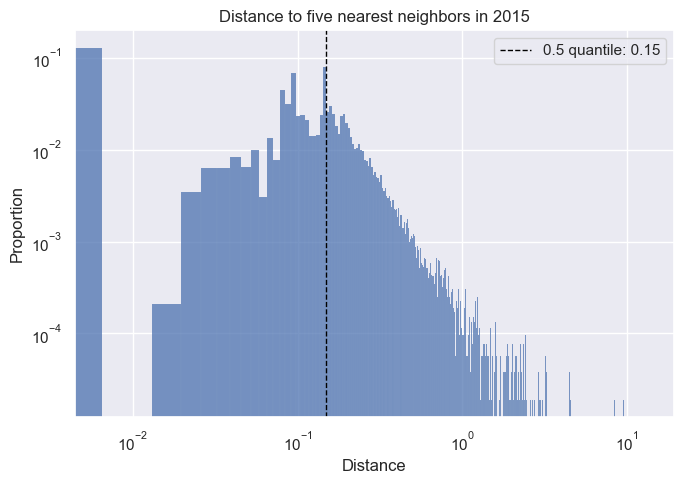

 58%|████████████████████████▉                  | 11/19 [13:38<12:36, 94.62s/it]

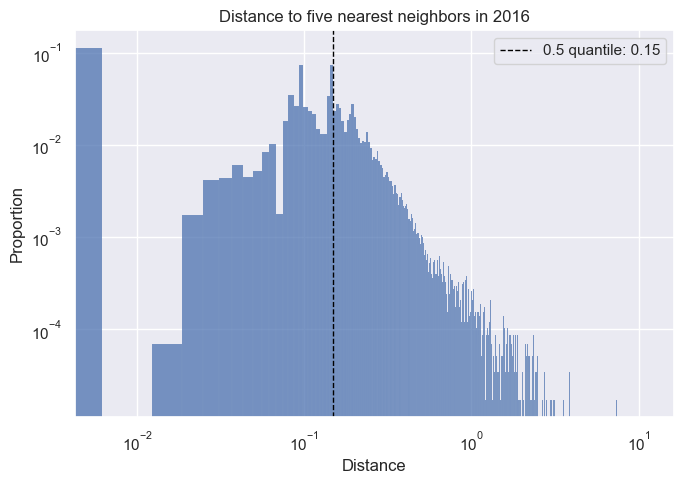

 63%|██████████████████████████▌               | 12/19 [15:37<11:52, 101.79s/it]

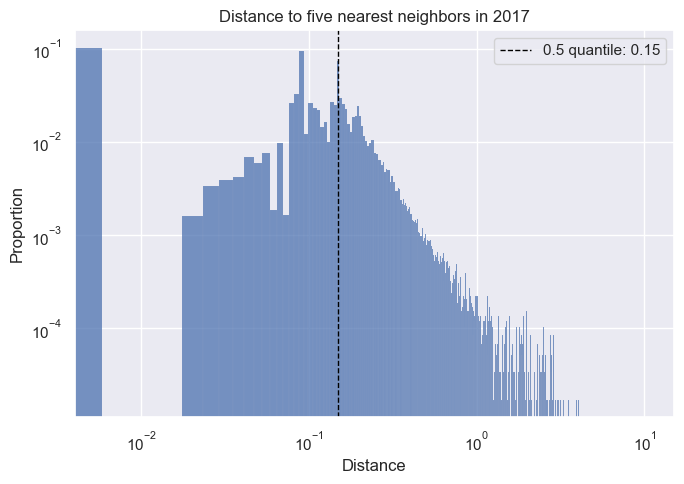

 68%|████████████████████████████▋             | 13/19 [17:39<10:47, 107.98s/it]

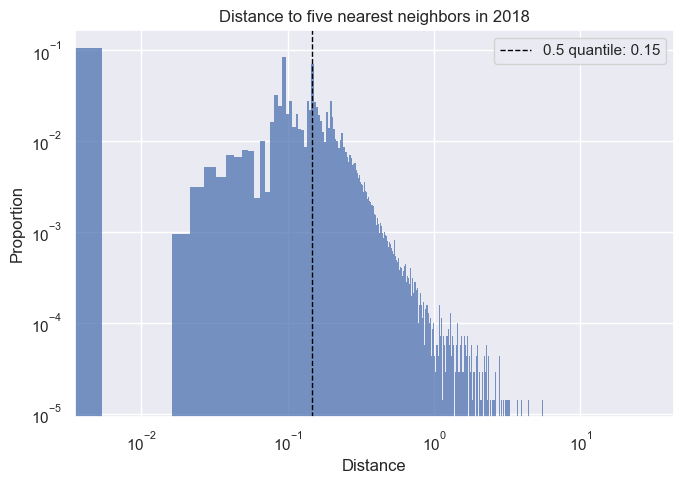

 74%|██████████████████████████████▉           | 14/19 [20:11<10:06, 121.22s/it]

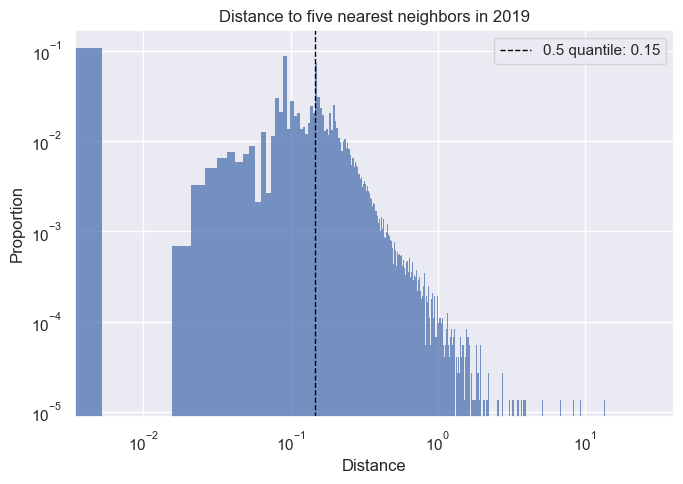

 79%|█████████████████████████████████▏        | 15/19 [22:51<08:52, 133.08s/it]

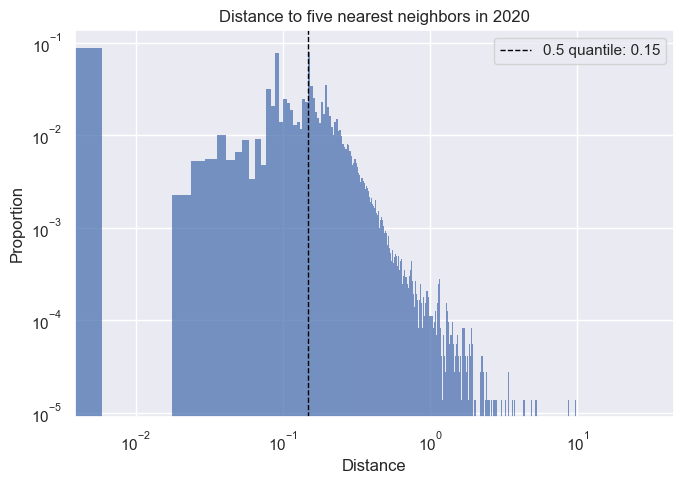

 84%|███████████████████████████████████▎      | 16/19 [25:27<06:59, 140.00s/it]

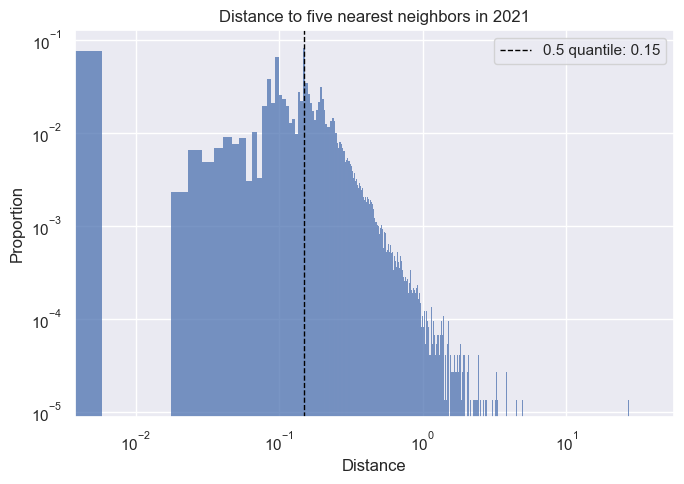

 89%|█████████████████████████████████████▌    | 17/19 [28:10<04:53, 146.73s/it]

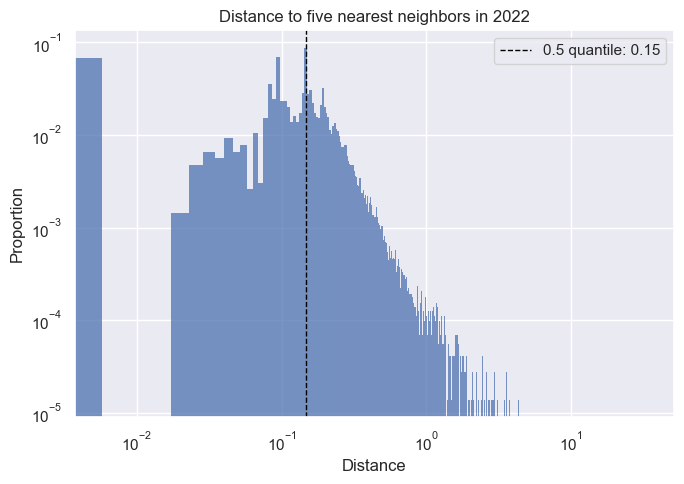

 95%|███████████████████████████████████████▊  | 18/19 [30:47<02:29, 150.00s/it]

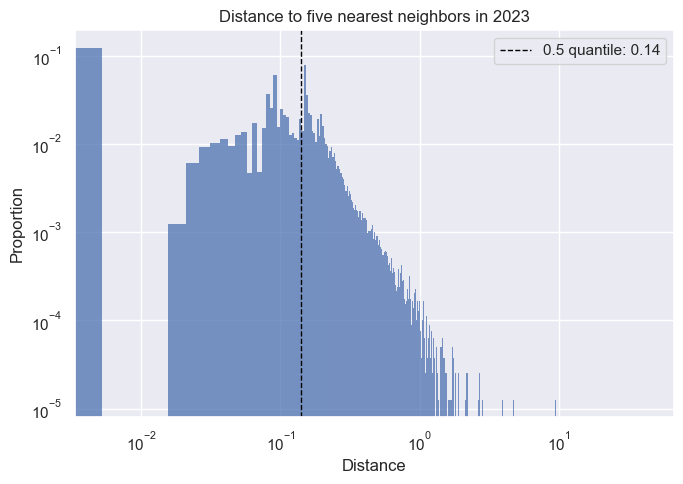

100%|██████████████████████████████████████████| 19/19 [33:44<00:00, 106.54s/it]


In [38]:
#likelihood_dict = KNN(oneHot_researchers, ['Seniority', 'CumulativePaperCount', 'Productivity'], 'Gender', ['Female', 'Male'], allCols, 5, 0.5, 1000)

In [39]:
likelihood_dict

{0: {'Year': 2005, 'Iteration': 0, 'Likelihood': 1.1268472906403941},
 1: {'Year': 2005, 'Iteration': 1, 'Likelihood': 1.7196428571428573},
 2: {'Year': 2005, 'Iteration': 2, 'Likelihood': 1.3700159489633175},
 3: {'Year': 2005, 'Iteration': 3, 'Likelihood': 1.3275862068965518},
 4: {'Year': 2005, 'Iteration': 4, 'Likelihood': 1.3810888252148998},
 5: {'Year': 2005, 'Iteration': 5, 'Likelihood': 1.2309782608695652},
 6: {'Year': 2005, 'Iteration': 6, 'Likelihood': 1.3550387596899227},
 7: {'Year': 2005, 'Iteration': 7, 'Likelihood': 1.9458874458874458},
 8: {'Year': 2005, 'Iteration': 8, 'Likelihood': 1.4985207100591715},
 9: {'Year': 2005, 'Iteration': 9, 'Likelihood': 1.3170409511228534},
 10: {'Year': 2005, 'Iteration': 10, 'Likelihood': 1.3881064162754306},
 11: {'Year': 2005, 'Iteration': 11, 'Likelihood': 1.6547842401500938},
 12: {'Year': 2005, 'Iteration': 12, 'Likelihood': 1.1617283950617283},
 13: {'Year': 2005, 'Iteration': 13, 'Likelihood': 1.4123563218390804},
 14: {'Year'

In [40]:
likelihood_df = pd.DataFrame.from_dict(likelihood_dict, orient='index')

In [41]:
likelihood_stats = pd.DataFrame.from_dict(avgRelativeLikelihood(likelihood_df), orient = 'index')

In [42]:
years = likelihood_stats.index.tolist()

In [43]:
#make plot as function, so we can try different Ks

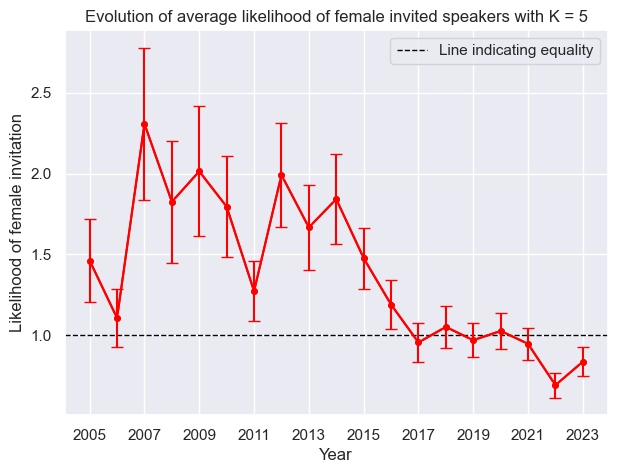

In [44]:
sns.lineplot(data = likelihood_stats, x = likelihood_stats.index, y = 'Avg_likelihood', marker = 'o', color = 'red')
plt.axhline(1, color = 'black', linewidth = 1, label = "Line indicating equality").set_linestyle("--")
plt.errorbar(x = likelihood_stats.index, y = likelihood_stats.Avg_likelihood, yerr = likelihood_stats.Std_likelihood, color = 'red', capsize = 4)
plt.legend()
plt.xticks(np.arange(min(years), max(years)+1, 2.0))
plt.xlabel('Year')
plt.ylabel('Likelihood of female invitation')
plt.title('Evolution of average likelihood of female invited speakers with K = 5')
plt.savefig("Figures/femaleLikelihood.png", bbox_inches='tight')
plt.show()

In [ ]:
#so there are fewer similar female researchers
#but do that actually make a lot of sense, because more are being invited.
#But not because they are similar to the males, but because they come with something different?

### Old code

In [ ]:
#old
def KNN(df, standardizeFeatures, groupFeature, groups, allFeatures, K, q, N): 
    likelihood_dict = {}
    index = 0
    KNN_researchers = df.copy()
    for c in standardizeFeatures:
        KNN_researchers[c] = standardizeColumn(KNN_researchers, c) #standardize data
    
    yearList = np.sort(KNN_researchers.Year.unique())
    for y in tqdm(yearList):
        year_df = KNN_researchers[KNN_researchers.Year == y] #get all data from year y
        group1 = year_df[year_df[groupFeature] == groups[0]].reset_index(drop = True)
        group2 = year_df[year_df[groupFeature] == groups[1]].reset_index(drop = True)
        
        #neighbors = NearestNeighbors(n_neighbors=K).fit(group1[allFeatures].to_numpy())
        n_oneHotFeatures = len(allFeatures) - len(standardizeFeatures) #number of features from one-hot encoding
        oneHot_weight = np.repeat(1/n_oneHotFeatures, n_oneHotFeatures) #weight for one-hot encoded features
        other_weight = np.repeat(1, len(standardizeFeatures)) #weight for the other features
        weights = np.hstack((oneHot_weight, other_weight)) 
        neighbors = NearestNeighbors(n_neighbors=K, metric='minkowski', p = 1.5, metric_params={'w': weights}, n_jobs = -1).fit(group1[allFeatures].to_numpy())
        kNeighbor_dist, kNeighbor_ind = neighbors.kneighbors(group2[allFeatures].to_numpy()) 
        
        threshold = np.quantile(kNeighbor_dist.flatten(), q) #q quantile
        indices = kNeighbor_ind.copy().astype(float) #get indices of five nearest neighbors of all males
        indices[~(kNeighbor_dist <= threshold)] = np.nan #set indices to nan if their distance is higher than the threshold
        
        plotYearlyDistances(kNeighbor_dist, threshold, y) #plot yearly distances
        
        for n in range(0,N):
            lh = likelihood(indices, group1, group2)
            likelihood_dict[index] = {'Year': y, 'Iteration': n, 'Likelihood': lh}
            index += 1
    
    #create df from likelihood_dict
    #also create more functions inside this one
        
    return likelihood_dict

In [ ]:
#test - delete
df = oneHot_researchers
standardizeFeatures = ['Seniority', 'CumulativePaperCount', 'Productivity']
groupFeature = 'Gender'
groups = ['Female', 'Male']
K = 5
allFeatures = allCols
t = np.repeat(1/32, 29)
other = np.repeat(1, len(standardizeFeatures))
weights = np.hstack((t, other)) 
#likelihood_dict = {}
    #index = 0
KNN_researchers = df.copy()
for c in standardizeFeatures:
    KNN_researchers[c] = standardizeColumn(KNN_researchers, c) #standardize data

yearList = np.sort(KNN_researchers.Year.unique())
y = 2005
year_df = KNN_researchers[KNN_researchers.Year == y] #get all data from year y
group1 = year_df[year_df[groupFeature] == groups[0]].reset_index(drop = True)
group2 = year_df[year_df[groupFeature] == groups[1]].reset_index(drop = True)

#neighbors = NearestNeighbors(n_neighbors=K, algorithm = 'brute', metric='wminkowski', p = 1.5, w = weights).fit(group1[allFeatures].to_numpy())
neighbors = NearestNeighbors(n_neighbors=K, metric='minkowski', p = 1.5, metric_params={'w': weights}, n_jobs = -1).fit(group1[allFeatures].to_numpy())



kNeighbor_dist, kNeighbor_ind = neighbors.kneighbors(group2[allFeatures].to_numpy()) 
     
#threshold = np.quantile(kNeighbor_dist.flatten(), q) #q quantile
    #   indices = kNeighbor_ind.copy().astype(float) #get indices of five nearest neighbors of all males
#    indices[~(kNeighbor_dist <= threshold)] = np.nan #set indices to nan if their distance is higher than the threshold
        
#     plotYearlyDistances(kNeighbor_dist, threshold, y) #plot yearly distances
        
#      for n in range(0,N):
#           lh = likelihood(indices, group1, group2)
#            likelihood_dict[index] = {'Year': y, 'Iteration': n, 'Likelihood': lh}
#            index += 1
        

In [10]:
def KNN(df, standardizeFeatures, allFeatures, K): #K for number of neighbors to find in KNN
    #standardize column and create new df with the standardized attributes
    KNN_dict = {}
    KNN_researchers = df.copy()
    for c in standardizeFeatures:
        KNN_researchers[c] = standardizeColumn(KNN_researchers, c)
    #invitedMales = KNN_researchers[(KNN_researchers.SessionType == 'invited') & (KNN_researchers.Gender == 'Male')]
    invitedSpeakers = KNN_researchers[KNN_researchers.SessionType == 'invited'] #invited speakers
    for i in tqdm(invitedSpeakers.index): #loop through index of invited speakers
        currentInvited = invitedSpeakers[invitedSpeakers.index == i] #current invited speaker
        currentInvited_name = currentInvited.SearchName[i]        
        year = currentInvited.Year[i] #find year of current invited speaker
        yearResearchers = KNN_researchers[KNN_researchers.Year == year]#find researchers within "current" year
        other = yearResearchers[yearResearchers.SearchName != currentInvited_name] #remove current researcher
        #KNN
        if K == "all": #when all neighbors should be found
            k = len(other)
        else:
            k = K
        #neighbors = NearestNeighbors(n_neighbors=K).fit(other)
        neighbors = NearestNeighbors(n_neighbors=k).fit(other[allFeatures].to_numpy())
        kNeighbor_dist, kNeighbor_ind = neighbors.kneighbors(currentInvited[allFeatures].to_numpy())
        #kNeighbor_dist, kNeighbor_ind = neighbors.kneighbors(currentInvited[allFeatures].to_numpy())
        neighbor_df = other.iloc[kNeighbor_ind[0]] #k nearest neighbors as df
        
        KNN_dict[i] = {'Name': currentInvited_name, 'Year': year, 'Gender': currentInvited.Gender.values[0], 'NeighborDistance': kNeighbor_dist[0], 'NeighborNames': list(neighbor_df.SearchName), 'NeighborGender': list(neighbor_df.Gender)}
    return KNN_dict
    #return yearResearchers

In [11]:
#test
#df = oneHot_researchers
#KNN_researchers = df.copy()
#standardizeFeatures = ['Seniority', 'CumulativePaperCount', 'Productivity']
#allFeatures = allCols
#for c in standardizeFeatures:
#    KNN_researchers[c] = standardizeColumn(KNN_researchers, c)
#invitedSpeakers = KNN_researchers[KNN_researchers.SessionType == 'invited'] #invited speakers
#i = 46
#currentInvited = invitedSpeakers[invitedSpeakers.index == i] #current invited speaker
#currentInvited_name = currentInvited.SearchName[i]
#year = currentInvited.Year[i] #find year of current invited speaker
#yearResearchers = KNN_researchers[KNN_researchers.Year == year]#find researchers within "current" year
#other = yearResearchers[yearResearchers.SearchName != currentInvited_name] #remove current researcher
#neighbors = NearestNeighbors(n_neighbors=len(other)).fit(other[allFeatures].to_numpy())
#kNeighbor_dist, kNeighbor_ind = neighbors.kneighbors(currentInvited[allFeatures].to_numpy())
#other.iloc[kNeighbor_ind[0]]
#kNeighbor_dist, kNeighbor_ind

In [12]:
allCols = knownUnits
allCols += ['Seniority', 'CumulativePaperCount', 'Productivity']

In [13]:
KNN_dict = KNN(oneHot_researchers, ['Seniority', 'CumulativePaperCount', 'Productivity'], allCols, "all")

100%|█████████████████████████████████████| 12725/12725 [10:38<00:00, 19.94it/s]


In [14]:
KNN_df = pd.DataFrame.from_dict(KNN_dict, orient='index').explode(['NeighborDistance', 'NeighborNames', 'NeighborGender']).reset_index()

In [18]:
KNN_dfList = pd.DataFrame.from_dict(KNN_dict, orient='index')

In [50]:
distance_df = pd.DataFrame()
distance_df['Year'] = KNN_dfList['Year']

In [51]:
distance_df['Min'] = KNN_dfList.NeighborDistance.apply(lambda x: min(x))
distance_df['Max'] = KNN_dfList.NeighborDistance.apply(lambda x: max(x))

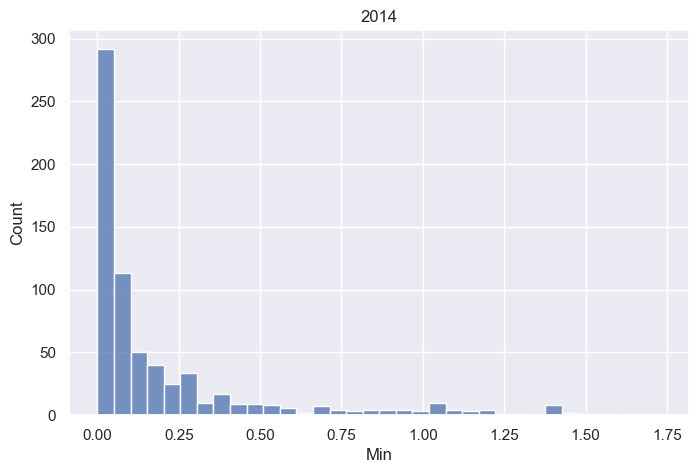

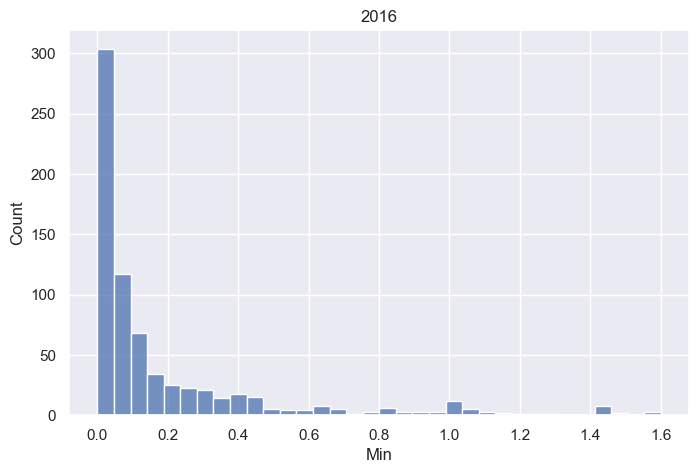

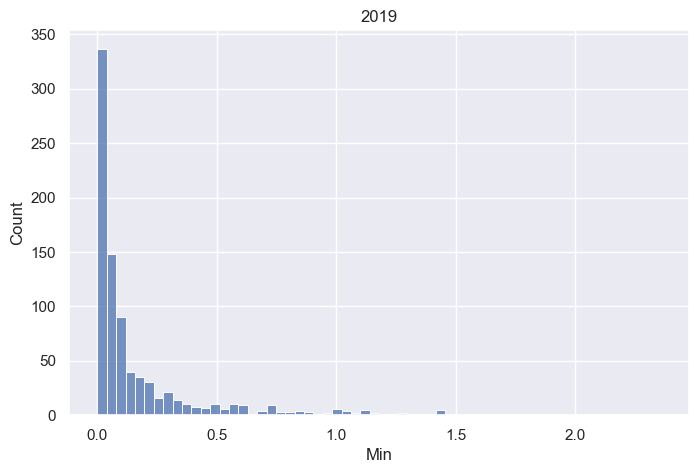

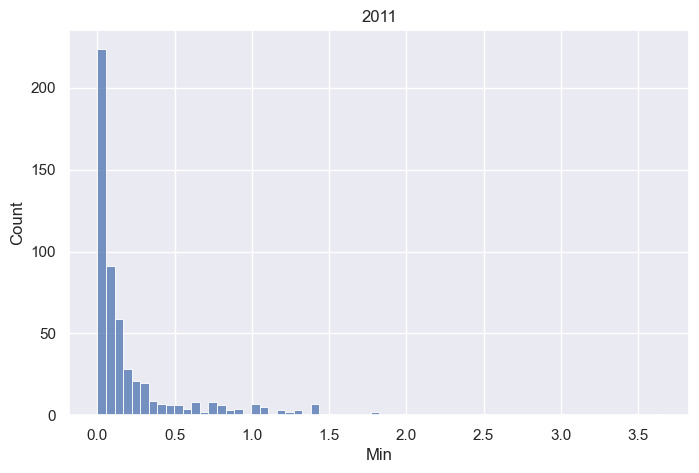

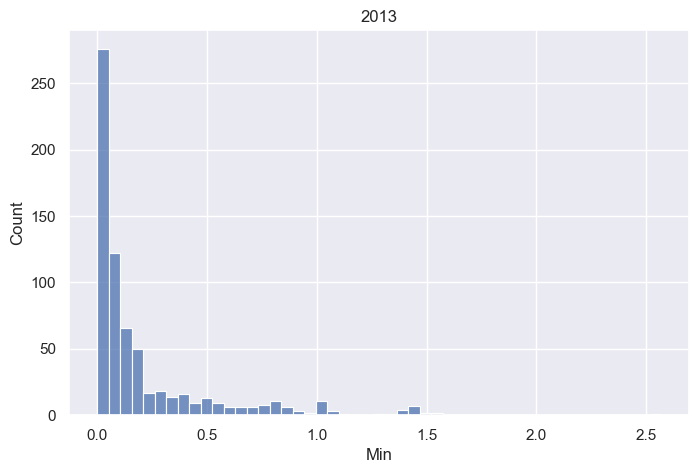

...

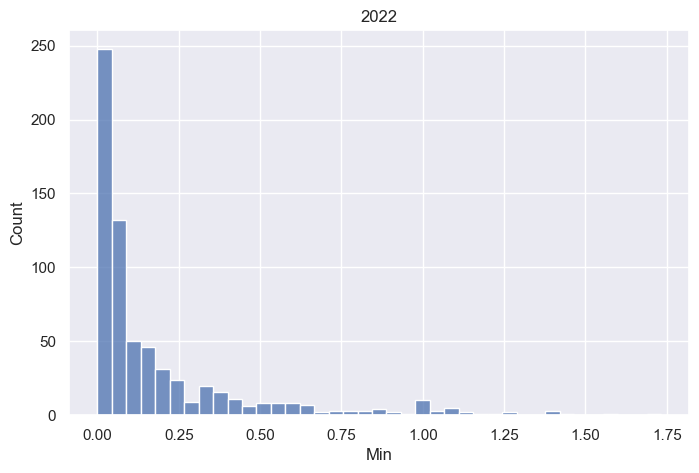

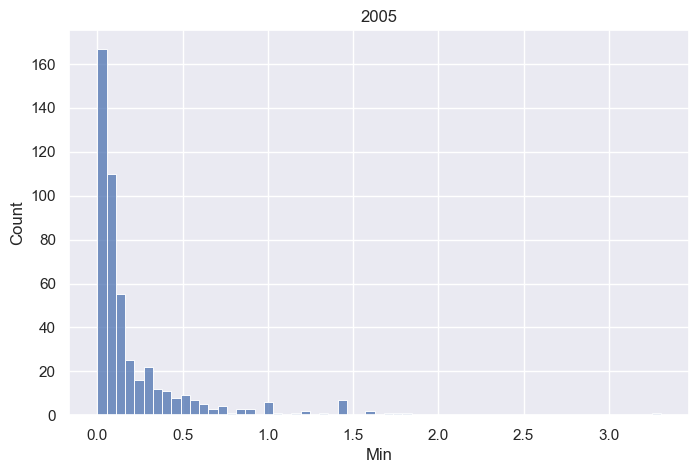

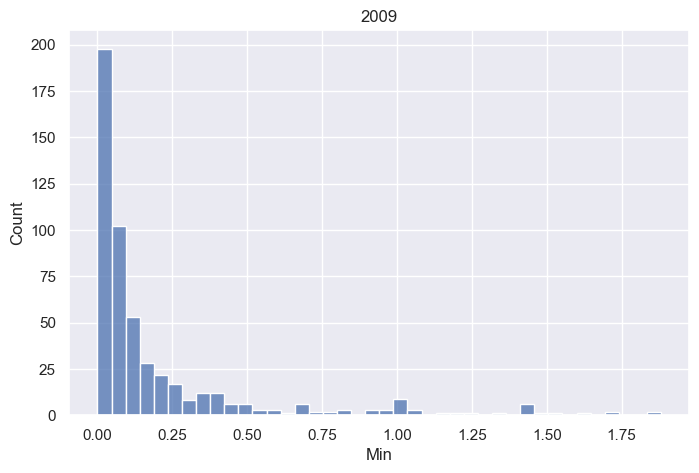

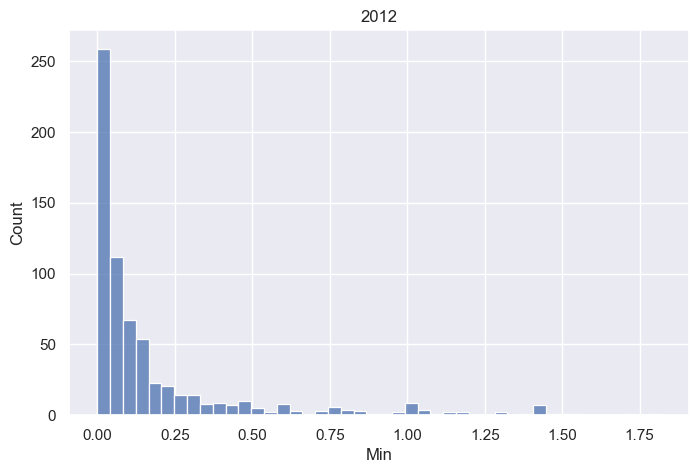

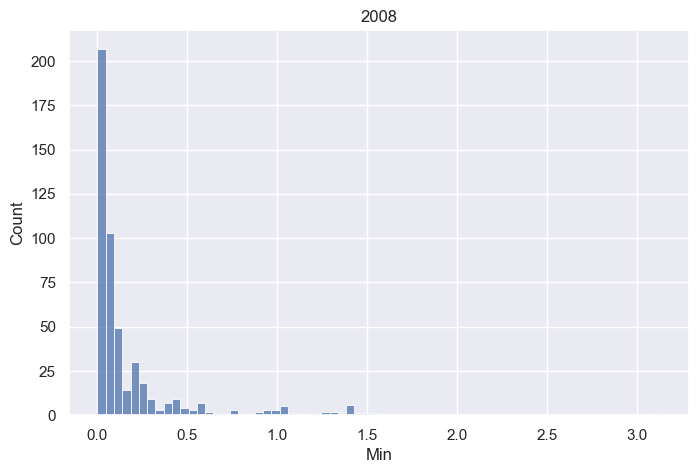

In [89]:
years = distance_df.Year.unique()
for y in years:
    df = distance_df[distance_df.Year == y]
    plt.figure()
    plt.tight_layout()
    sns.set(rc={"figure.figsize":(8, 5)})
    plt.title(y)
    sns.histplot(df, x = 'Min')

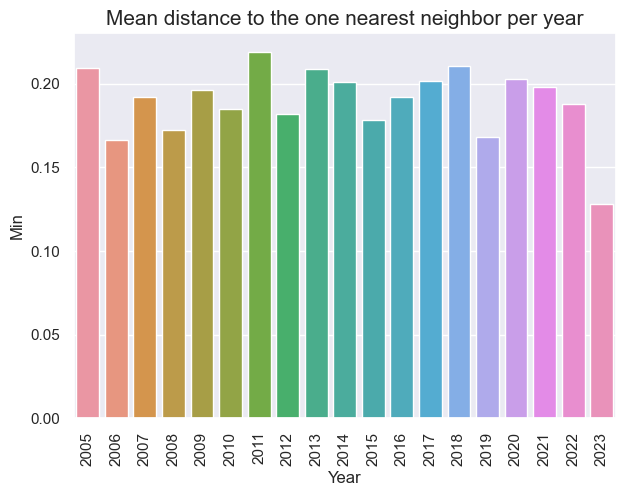

In [69]:
avgTable = distance_df.groupby('Year').mean().reset_index()
sns.barplot(data = avgTable, x = 'Year', y = 'Min')
plt.xticks(rotation=90)
plt.title("Mean distance to the one nearest neighbor per year", fontsize = 15)
plt.show()

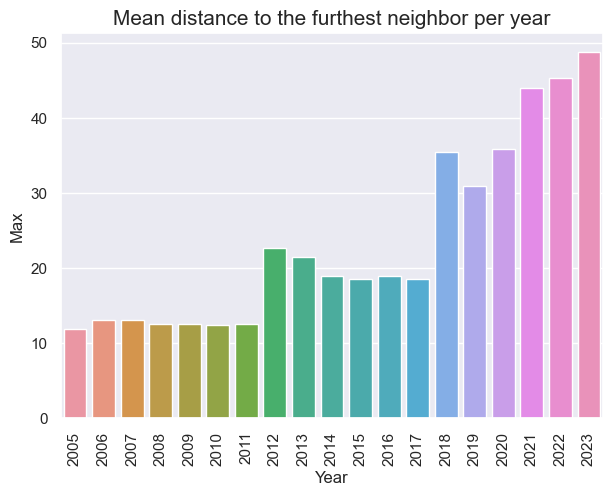

In [70]:
avgTable = distance_df.groupby('Year').mean().reset_index()
sns.barplot(data = avgTable, x = 'Year', y = 'Max')
plt.title("Mean distance to the furthest neighbor per year", fontsize = 15)
plt.xticks(rotation=90)
plt.show()

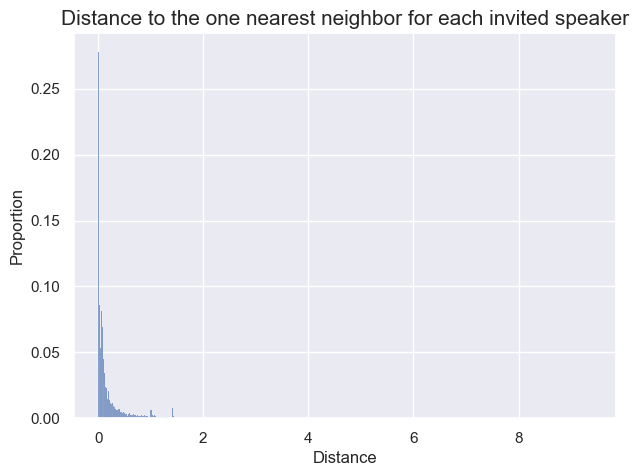

In [56]:
sns.histplot(data = distance_df, x = 'Min', stat = 'proportion')
plt.xlabel('Distance')
plt.title("Distance to the one nearest neighbor for each invited speaker", fontsize = 15)
#plt.savefig("Figures/title", bbox_inches='tight')
plt.show()

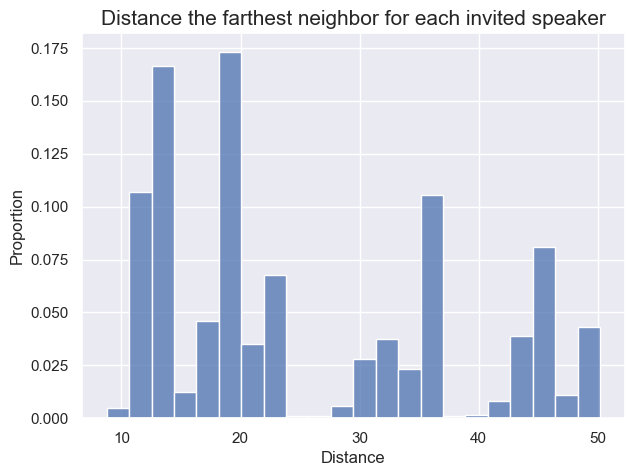

In [55]:
sns.histplot(data = distance_df, x = 'Max', stat = 'proportion')
plt.xlabel('Distance')
plt.title("Distance the farthest neighbor for each invited speaker", fontsize = 15)
#plt.savefig("Figures/title", bbox_inches='tight')
plt.show()

<AxesSubplot:xlabel='NeighborDistance', ylabel='Count'>

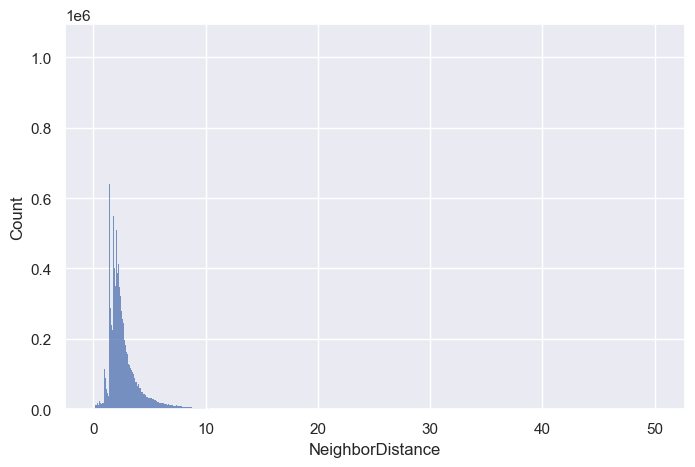

In [90]:
sns.histplot(data = KNN_df, x = 'NeighborDistance')
plt.show()

KeyboardInterrupt: 

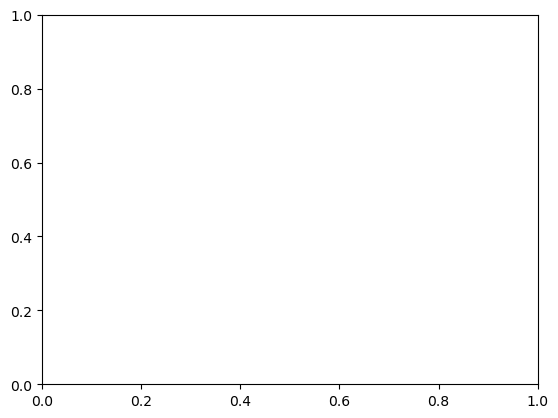

In [20]:
sns.histplot(data = KNN_df, x = 'Neighbor distance', bins = 10)

In [8]:
distance_table = KNN_df.groupby('Neighbor distance').count()

In [9]:
distanceCount = distance_table.reset_index()
distanceCount

,Neighbor distance,Name,Year,Neighbor index
0,0.000000e+00,372339,372339,372339
1,9.313226e-10,7,7,7
2,1.317089e-09,9,9,9
3,1.862645e-09,28,28,28
4,2.634178e-09,73,73,73
...,...,...,...,...
21395540,4.975554e+01,1,1,1
21395541,4.984776e+01,1,1,1
21395542,4.996473e+01,1,1,1
21395543,5.006720e+01,1,1,1


In [19]:
researchers.drop_duplicates(subset = ['Seniority', 'CumulativePaperCount', 'Productivity'])[['Seniority', 'CumulativePaperCount', 'Productivity']].max()

Seniority               218.000000
CumulativePaperCount    500.000000
Productivity            164.666667
dtype: float64

In [21]:
researchers[researchers.Seniority >= 100]

,SearchName,FirstName,ResearcherCount,MaxPaperCount,API_Field,API_FieldCount,ExternalField,ModelField,ExternalFieldCount,ModelFieldCount,...,Title,SponsoringUnit,SessionIndex,SessionType,Seniority,CumulativePaperCount,Productivity,firstName,Gender,AssignedSponsoringUnit
347,felix krueger,felix,12,33,Philosophy,7,Philosophy,History,7,1,...,Inference of emergent spatio-temporal processe...,DBIO,127935.0,attendee,120,19,0.158333,felix,Male,Biological Physics
651,pablo iglesias,pablo,107,6,Engineering,2,Engineering,Engineering,2,1,...,A modular view of directed cell migration,DCMP GSNP,128469.0,invited,120,1,0.008333,pablo,Male,None
855,hisao kanda,hisao,5,210,Materials Science,112,Materials Science,Materials Science,112,193,...,Pressure dependence of the first-order Raman f...,DCMP DMP,11195.0,attendee,100,166,1.660000,hisao,Male,None
1834,crispin contreras-martinez,crispin,2,22,Physics,13,Physics,Physics,13,21,...,Characterization of losses in dielectric subst...,DQI,11247.0,attendee,123,17,0.138211,crispin,Male,Quantum Information
1835,yuriy pischalnikov,yuriy,5,199,Physics,129,Physics,Physics,129,190,...,Characterization of losses in dielectric subst...,DQI,11247.0,attendee,123,189,1.536585,yuriy,Male,Quantum Information
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
553732,pascoal pagliuso,pascoal,4,342,Physics,170,Physics,Physics,170,330,...,Structural and Physical Properties of CeAu2Bi:...,DCMP,135588.0,attendee,119,299,2.512605,pascoal,Male,Condensed Matter Physics
553733,pascoal pagliuso,pascoal,4,342,Physics,170,Physics,Physics,170,330,...,The Role of the Relaxation Rate of Nematic Flu...,DMP,142351.0,attendee,118,286,2.423729,pascoal,Male,Materials Physics
553735,pascoal pagliuso,pascoal,4,342,Physics,170,Physics,Physics,170,330,...,Complex magnetism in novel intermetallic compo...,DCMP,170995.0,attendee,123,336,2.731707,pascoal,Male,Condensed Matter Physics
553934,james martin,james,1275,3,Medicine,2,Medicine,Medicine,2,3,...,Dynamics of particle suspensions subjected to ...,DCMP,80671.0,invited,109,3,0.027523,james,Male,Condensed Matter Physics


In [ ]:
sns.barplot(data = distanceCount, x = 'Neighbor distance', y = 'Name')

In [ ]:
#now plot the distances from KNN_dict.
#Find a way to also check for individual distances. How much do they vary(variance)?
#Find a way to check for differences in differen years. Maybe a histogram for each year, or do year as hue

In [92]:
neighbors = NearestNeighbors(n_neighbors=10, metric = 'euclidean')
neighbors.fit(data)

knn = neighbors.kneighbors(researcher.reshape(1, -1))

NameError: name 'data' is not defined

In [91]:
test_df[['Seniority', 'CumulativePaperCount', 'Productivity']]

,Seniority,CumulativePaperCount,Productivity
2,2,2,1.000000
8,16,4,0.250000
111,43,104,2.418605
262,6,4,0.666667
264,2,1,0.500000
...,...,...,...
553878,25,15,0.600000
553921,37,20,0.540541
554146,15,46,3.066667
554174,7,3,0.428571


In [105]:
data = KNN_researchers[['Seniority', 'CumulativePaperCount', 'Productivity']]
researcher = KNN_researchers[KNN_researchers.SessionType == 'invited'][['Seniority', 'CumulativePaperCount', 'Productivity']].iloc[0].to_numpy().reshape(1, -1)

In [128]:
neighbors = NearestNeighbors(n_neighbors=10, metric = 'manhattan')
neighbors.fit(data)

NearestNeighbors(metric='manhattan', n_neighbors=10)

In [129]:
knn = neighbors.kneighbors(researcher.reshape(1, -1))

/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but NearestNeighbors was fitted with feature names
  warnings.warn(


In [130]:
knn

(array([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]),
 array([[3406, 3583, 2282, 3576, 3464, 3473,    2,  135,  305,   52]]))

In [131]:
researcher

array([[-0.88210549, -0.51229433, -0.3393391 ]])

In [109]:
KNN_researchers.iloc[3406]

SearchName                                                         steve barr
FirstName                                                               steve
ResearcherCount                                                            11
MaxPaperCount                                                               2
API_Field                                               Environmental Science
API_FieldCount                                                              1
ExternalField                                           Environmental Science
ModelField                                              Environmental Science
ExternalFieldCount                                                          1
ModelFieldCount                                                             2
FirstPaperYear                                                           2008
Year                                                                     2010
Name                                                            

NearestNeighbors(n_neighbors=10)

In [80]:
knn = NearestNeighbors(n_neighbors=10, algorithm='auto')
knn.fit(KNN_researchers[['Seniority', 'CumulativePaperCount', 'Productivity']].to_numpy())

NearestNeighbors(n_neighbors=10)

In [ ]:
##do knn with one invited male speaker(for one year)


X = np.array([[-1, -1], [-2, -1], [-3, -2], [1, 1], [2, 1], [3, 2]])
>>> nbrs = NearestNeighbors(n_neighbors=2, algorithm='ball_tree').fit(X)
>>> distances, indices = nbrs.kneighbors(X)